In [1]:
#pip install --upgrade --force-reinstall matplotlib

In [1]:
import pandas as pd
import numpy as np
import json
import re

In [2]:
import matplotlib as plt

In [3]:
from sklearn.preprocessing import StandardScaler, LabelEncoder

#### Učitavanje podataka

In [4]:
data_attrition=pd.read_csv('WA_Fn-UseC_-HR-Employee-Attrition.csv')

In [5]:
data_attrition

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,1,2061,...,3,80,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,1,2062,...,1,80,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,1,2064,...,2,80,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,1,2065,...,4,80,0,17,3,2,9,6,0,8


#### Proveravanje null vrednosti u skupu podataka

In [6]:
data_attrition.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

In [7]:
##### Proveravamo da li nam se u skupu podataka 
maska = data_attrition.isnull() | (data_attrition == '') | (data_attrition == 'None') | (data_attrition == ' ')

In [8]:
broj_null_vrednosti = maska.sum()
print(broj_null_vrednosti)

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

In [9]:
### Provera duplikata je takodje jedna od tehnika koje su neophodne u generisanju i preprocesiranju modela mašinskog učenja
## Nekada se radi svesno oversemplovanje ili undersamplovanje skupa podataka za treniranje medjutim u ovom slučaju je
# bolje na početku proveriti i uveriti se da li u samom startu postoje vrednosti koje su duplirane
### 

In [10]:
podaci_duplirani= data_attrition.duplicated()

In [11]:
# SADA DA VIDIMO DA LI SU PODACI DUPLIRANI
data_attrition[podaci_duplirani]

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager


In [12]:
#-Podaci u početnom skupu podataka nisu duplirani i nalaze se normalno 

In [13]:
#### Provera unique vrednosti unutar kolona 
#### kako bi izbegle i izbrisale konstantne vrednosti u skupu podataka koje nisu korisne ili su neke informacije
### poput ID kolona koji nisu kasnije relevantne za analizu

In [14]:
data_attrition.shape

(1470, 35)

In [15]:
for kolona in data_attrition.columns:
    print(f"{kolona}: Ima jedinstvenih vrednosti {data_attrition[kolona].nunique()}")
    print("######################################################")

Age: Ima jedinstvenih vrednosti 43
######################################################
Attrition: Ima jedinstvenih vrednosti 2
######################################################
BusinessTravel: Ima jedinstvenih vrednosti 3
######################################################
DailyRate: Ima jedinstvenih vrednosti 886
######################################################
Department: Ima jedinstvenih vrednosti 3
######################################################
DistanceFromHome: Ima jedinstvenih vrednosti 29
######################################################
Education: Ima jedinstvenih vrednosti 5
######################################################
EducationField: Ima jedinstvenih vrednosti 6
######################################################
EmployeeCount: Ima jedinstvenih vrednosti 1
######################################################
EmployeeNumber: Ima jedinstvenih vrednosti 1470
######################################################
EnvironmentSatisfactio

In [16]:
for kolona in data_attrition.columns:
    if data_attrition[kolona].nunique()==1:
        print(f"{kolona}: Ima jednu jedinstvenu vrednosti {data_attrition[kolona].nunique()}")
        print("######################################################")
    elif data_attrition[kolona].nunique()==data_attrition.shape[0]:
        print(f"{kolona}: Ima sve različite vrednosti")
        print("######################################################")
        

EmployeeCount: Ima jednu jedinstvenu vrednosti 1
######################################################
EmployeeNumber: Ima sve različite vrednosti
######################################################
Over18: Ima jednu jedinstvenu vrednosti 1
######################################################
StandardHours: Ima jednu jedinstvenu vrednosti 1
######################################################


In [17]:
## pre nego što ove informacije budu iskorišćene za prečišćavanje skupa podataka možemo videti raspodelu

array([[<Axes: title={'center': 'Age'}>,
        <Axes: title={'center': 'DailyRate'}>,
        <Axes: title={'center': 'DistanceFromHome'}>,
        <Axes: title={'center': 'Education'}>,
        <Axes: title={'center': 'EmployeeCount'}>],
       [<Axes: title={'center': 'EmployeeNumber'}>,
        <Axes: title={'center': 'EnvironmentSatisfaction'}>,
        <Axes: title={'center': 'HourlyRate'}>,
        <Axes: title={'center': 'JobInvolvement'}>,
        <Axes: title={'center': 'JobLevel'}>],
       [<Axes: title={'center': 'JobSatisfaction'}>,
        <Axes: title={'center': 'MonthlyIncome'}>,
        <Axes: title={'center': 'MonthlyRate'}>,
        <Axes: title={'center': 'NumCompaniesWorked'}>,
        <Axes: title={'center': 'PercentSalaryHike'}>],
       [<Axes: title={'center': 'PerformanceRating'}>,
        <Axes: title={'center': 'RelationshipSatisfaction'}>,
        <Axes: title={'center': 'StandardHours'}>,
        <Axes: title={'center': 'StockOptionLevel'}>,
        <Axe

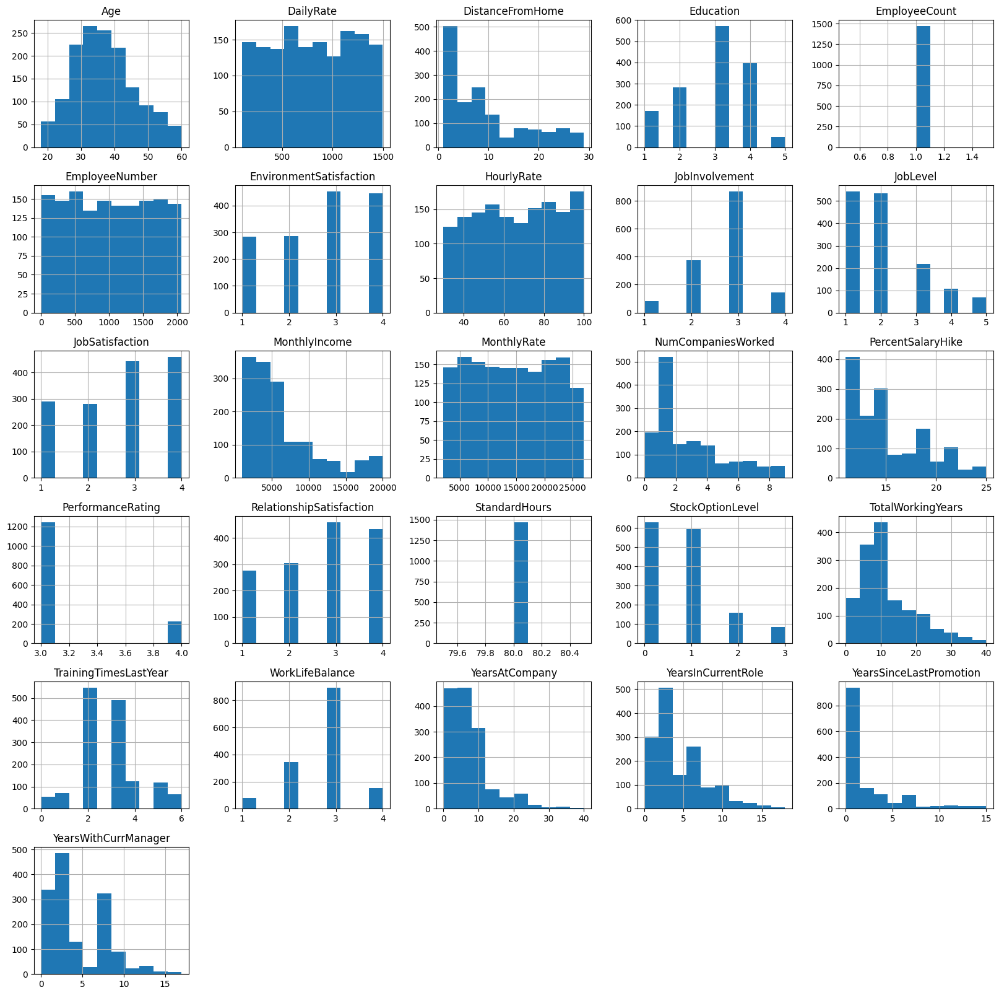

In [18]:
data_attrition.hist(figsize=(20,20))

In [19]:
# Na osnovu prikazanih histograma mogu se izneti sl. zaključci:
# - Dobra većina varijabli imaju distribuciju gde su krajevi raspodele izuzetno opterećeni,
## tako reći to su raspodele verovatnoća čiji repovi (krajevi) nisu eksponencijalno ograničeni. 
# To onda znači da oni opadaju sporije od ekponencijalne raspodele.
# u našem slučaju to bi značilo da većina varijabli ima raspodelu nakrivljenu na desno.
### Takođe vidimo da su neke varijable konstantne i da je moguće da se izbace i ne proučavaju dalje.

In [20]:
##### Ovde se zakljucuje da je neophodno ukoliti kolone koje imaju standardnu vrednost poput EmployeeCount, StandardHours Over18 a da
#varijabla EmployeeNumber predstavlja 

In [21]:
data_attrition.drop(['EmployeeCount', 'EmployeeNumber', 'Over18', 'StandardHours'], axis="columns", inplace=True)

In [22]:
data_attrition.head(5)

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,2,Female,...,3,1,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,3,Male,...,4,4,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,4,Male,...,3,2,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,4,Female,...,3,3,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,Male,...,3,4,1,6,3,3,2,2,2,2


In [23]:
### yes - 1; no -0
label_encoder_output = LabelEncoder()
data_attrition['Attrition'] = label_encoder_output.fit_transform(data_attrition['Attrition'])

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):


In [24]:
data_attrition.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1,Travel_Rarely,1102,Sales,1,2,Life Sciences,2,Female,...,3,1,0,8,0,1,6,4,0,5
1,49,0,Travel_Frequently,279,Research & Development,8,1,Life Sciences,3,Male,...,4,4,1,10,3,3,10,7,1,7
2,37,1,Travel_Rarely,1373,Research & Development,2,2,Other,4,Male,...,3,2,0,7,3,3,0,0,0,0
3,33,0,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,4,Female,...,3,3,0,8,3,3,8,7,3,0
4,27,0,Travel_Rarely,591,Research & Development,2,1,Medical,1,Male,...,3,4,1,6,3,3,2,2,2,2


In [25]:
#data_attrition.head(5).to_csv("sample21.07.csv", index=False)

In [26]:
## sledeći korak je da se odradi uklanjanje outlier-a 
# - tu mogu da se koriste dve technike sada ćemo odraditi tehniku koriščenjem Z-score-a ali posto je takav vid uklanjanja oulier-a
## preporucljiv iskljucivo sa numerickim vrednostima potrebno je da se dobro razumeju sve kolone i shodno tome da se razdvoje
#### u odgovarajuće tipove podatka

In [27]:
data_attrition.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField',
       'EnvironmentSatisfaction', 'Gender', 'HourlyRate', 'JobInvolvement',
       'JobLevel', 'JobRole', 'JobSatisfaction', 'MaritalStatus',
       'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'OverTime',
       'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction',
       'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear',
       'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole',
       'YearsSinceLastPromotion', 'YearsWithCurrManager'],
      dtype='object')

In [28]:
numeričke_varijable=['Age', 'DailyRate', 'DistanceFromHome', 'HourlyRate', 'MonthlyIncome',
                     'MonthlyRate', 'NumCompaniesWorked', 'PercentSalaryHike', 'TotalWorkingYears',
                    'TrainingTimesLastYear', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion', 
                    'YearsSinceLastPromotion', 'YearsWithCurrManager']

In [29]:
kategoričke_nominalne=['BusinessTravel', 'Department', 'EducationField', 'JobRole', 'MaritalStatus']

In [30]:
izlazna_varijabla=['Attrition']

In [31]:
kategoričke_binarne=['Gender', 'OverTime']

In [32]:
kategoričke_ordinalne=['Education', 'EnvironmentSatisfaction', 'JobInvolvement', 
                       'JobLevel', 'JobSatisfaction', 'PerformanceRating', 'RelationshipSatisfaction',
                       'StockOptionLevel', 'WorkLifeBalance']

In [33]:
sve_kategoricke=kategoričke_nominalne+kategoričke_binarne+kategoričke_ordinalne

In [34]:
###### Ispod je predstavljena tehnika otklanjanja outlier-a na osnovu z-scorea

In [35]:
data_attrition.shape

(1470, 31)

In [36]:
###
import numpy as np
from scipy import stats

In [37]:
z_skorovi = np.abs(stats.zscore(data_attrition[numeričke_varijable]))
data_attrition_outlier_cleaned = data_attrition[(z_skorovi < 3).all(axis=1)]

In [38]:
data_attrition_outlier_cleaned.shape

(1387, 31)

In [39]:
#### Sledeći korak jeste feature engineering u kome ćemo dodati odredjene izvedene varijable


In [40]:
# data_attrition_obogacen= data_attrition_outlier_cleaned.copy()

In [41]:
# data_attrition_obogacen['YearsAtCompany_ManagerRatio'] = data_attrition_obogacen['YearsAtCompany'] / (data_attrition_obogacen['YearsWithCurrManager'] + 1)
# data_attrition_obogacen['SalaryIncreasePerYear']=(data_attrition_obogacen['MonthlyIncome']-data_attrition_obogacen['DailyRate']*22) / data_attrition_obogacen['YearsAtCompany']

In [42]:
data_attrition_obogacen=data_attrition_outlier_cleaned

In [43]:
data_attrition_obogacen.shape

(1387, 31)

In [44]:
### sada se dodaju ove dve numericke varijable u numericke varijable i onda je potrebno da će biti odradjena 
##odgovarajuća konverzija kategorickih varijabli u numerickih kao i skaliranje numerickih varijabli

In [45]:
# numeričke_varijable.append('YearsAtCompany_ManagerRatio')
# numeričke_varijable.append('SalaryIncreasePerYear')

In [46]:
numeričke_varijable

['Age',
 'DailyRate',
 'DistanceFromHome',
 'HourlyRate',
 'MonthlyIncome',
 'MonthlyRate',
 'NumCompaniesWorked',
 'PercentSalaryHike',
 'TotalWorkingYears',
 'TrainingTimesLastYear',
 'YearsAtCompany',
 'YearsInCurrentRole',
 'YearsSinceLastPromotion',
 'YearsSinceLastPromotion',
 'YearsWithCurrManager']

In [47]:
##### konverzija kategorickih u numericke

In [48]:
### prvo kategoricke ordinalne konvertujemo u ordinal varijable

In [49]:
import warnings

warnings.filterwarnings('ignore', category=FutureWarning)

In [50]:
warnings.filterwarnings('ignore')

In [51]:
from sklearn.preprocessing import StandardScaler, LabelEncoder

In [52]:
from tqdm import tqdm

In [53]:
le = LabelEncoder()
l1 = []; l2 = []; text_categorical_features = []
print('Pretvaranje kategorickih varijabli ')
for i in tqdm(sve_kategoricke):
    if type(data_attrition_obogacen[i][0]) == str:
        text_categorical_features.append(i)
        data_attrition_obogacen[i] = le.fit_transform(data_attrition_obogacen[i])
        l1.append(list(data_attrition_obogacen[i].unique())); l2.append(list(le.inverse_transform(data_attrition_obogacen[i].unique())))
        print(i,' : ',data_attrition_obogacen[i].unique(),' = ',le.inverse_transform(data_attrition_obogacen[i].unique()))

Pretvaranje kategorickih varijabli 


100%|██████████| 16/16 [00:00<00:00, 547.82it/s]

BusinessTravel  :  [2 1 0]  =  ['Travel_Rarely' 'Travel_Frequently' 'Non-Travel']
Department  :  [2 1 0]  =  ['Sales' 'Research & Development' 'Human Resources']
EducationField  :  [1 4 3 2 5 0]  =  ['Life Sciences' 'Other' 'Medical' 'Marketing' 'Technical Degree'
 'Human Resources']
JobRole  :  [7 6 2 4 0 3 8 5 1]  =  ['Sales Executive' 'Research Scientist' 'Laboratory Technician'
 'Manufacturing Director' 'Healthcare Representative' 'Manager'
 'Sales Representative' 'Research Director' 'Human Resources']
MaritalStatus  :  [2 1 0]  =  ['Single' 'Married' 'Divorced']
Gender  :  [0 1]  =  ['Female' 'Male']
OverTime  :  [1 0]  =  ['Yes' 'No']


In [54]:
tf1 = {}
for i in range(len(text_categorical_features)):
    tf1[text_categorical_features[i]] = {}
    for j,k in zip(l1[i],l2[i]):
        tf1[text_categorical_features[i]][j] = k

In [55]:
# label_encoders = {}
# for kolona in kategoričke_ordinalne:
#     le = LabelEncoder()
#     data_attrition_obogacen[kolona] = le.fit_transform(data_attrition_obogacen[kolona])
#     label_encoders[kolona] = le

In [56]:
# data_attrition_obogacen = pd.get_dummies(data_attrition_obogacen, columns= kategoričke_nominalne + kategoričke_binarne, drop_first=True)

In [57]:
#### Sada se koristi Standard Scaler za skaliranje numerickih varijabli

In [58]:
# ###3 ! ovo je zbog izvedenih varijabli 
# data_attrition_obogacen.replace([np.inf, -np.inf], np.nan, inplace=True)
# data_attrition_obogacen.dropna(inplace=True)

In [59]:
# data_attrition_obogacen.shape

In [60]:
data_attrition_obogacen.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField',
       'EnvironmentSatisfaction', 'Gender', 'HourlyRate', 'JobInvolvement',
       'JobLevel', 'JobRole', 'JobSatisfaction', 'MaritalStatus',
       'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'OverTime',
       'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction',
       'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear',
       'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole',
       'YearsSinceLastPromotion', 'YearsWithCurrManager'],
      dtype='object')

In [61]:
################## final kolone

In [62]:
import imblearn
from imblearn.pipeline import Pipeline
from collections import Counter
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import SMOTE

In [63]:
kolone_ulazne= list(data_attrition.columns)
kolone_ulazne.remove('Attrition')

In [64]:
over = SMOTE(sampling_strategy = 0.85)
under = RandomUnderSampler(sampling_strategy = 0.1)
f1 = data_attrition_obogacen.loc[:,kolone_ulazne]
t1 = data_attrition_obogacen.loc[:,'Attrition']

steps = [('over', over)]
pipeline = Pipeline(steps=steps)
f1, t1 = pipeline.fit_resample(f1, t1)
Counter(t1)

Counter({0: 1158, 1: 984})

In [65]:
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(f1, t1, test_size = 0.15, random_state = 2)

In [66]:
x_train_test = x_train.copy(deep = True)
x_train_test['Attrition'] = y_train

In [67]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import mutual_info_classif,chi2

In [68]:
import matplotlib.pyplot as plt
import seaborn as sns



In [69]:
colors = ['#D8BFD8', '#FFFFFF']

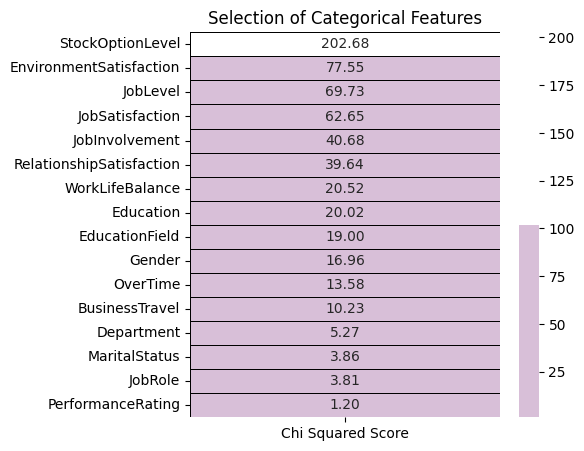

In [70]:
features = x_train.loc[:,sve_kategoricke]
target = pd.DataFrame(y_train)

best_features = SelectKBest(score_func = chi2,k = 'all')
fit = best_features.fit(features,target)

featureScores = pd.DataFrame(data = fit.scores_,index = list(features.columns),columns = ['Chi Squared Score']) 

plt.subplots(figsize = (5,5))
sns.heatmap(featureScores.sort_values(ascending = False,by = 'Chi Squared Score'),annot = True,cmap = colors,linewidths = 0.4,linecolor = 'black',fmt = '.2f');
plt.title('Selection of Categorical Features');

In [71]:
#### iz ovoga se vidi da je potrebno da se ukolone 
## Gender, EducationField, BusinessTravel, JobRole, Department,MaritalStatus, PerformanceRating, 


In [72]:
from sklearn.feature_selection import SelectKBest, f_classif

In [73]:
features = x_train[numeričke_varijable]
target = pd.DataFrame(y_train)

In [74]:
best_features = SelectKBest(score_func=f_classif, k='all')
fit = best_features.fit(features, target)

In [75]:
feature_scores = pd.DataFrame({
    'Feature': features.columns,
    'ANOVA Score': fit.scores_
})

In [76]:
sorted_feature_scores = feature_scores.sort_values(by='ANOVA Score', ascending=False)

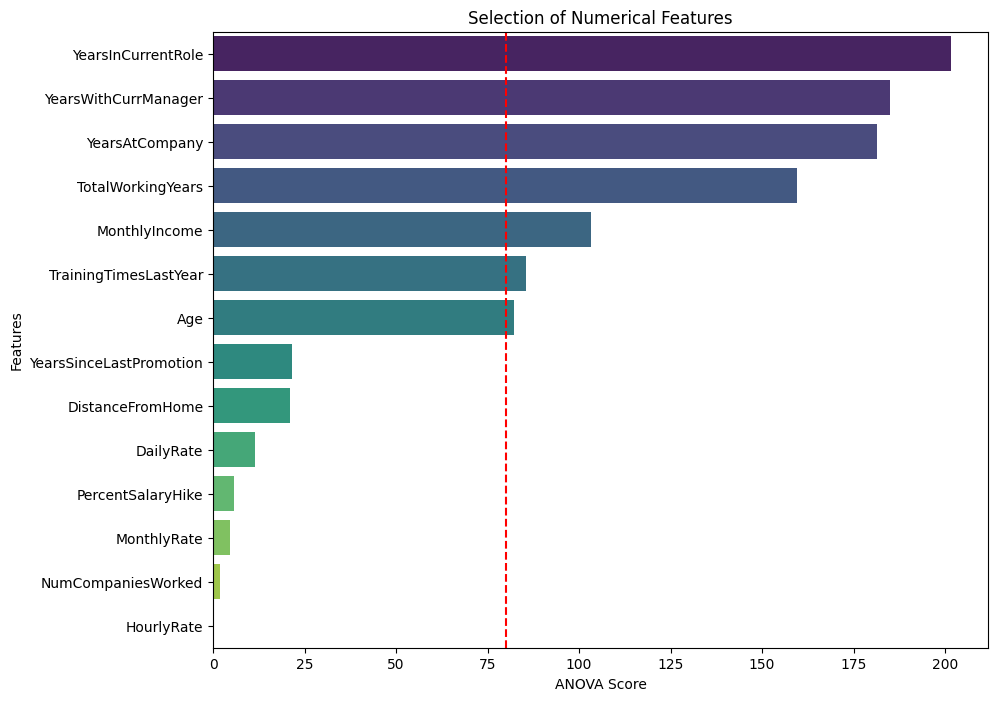

In [77]:
plt.figure(figsize=(10, 8))
sns.barplot(x='ANOVA Score', y='Feature', data=sorted_feature_scores, palette='viridis')
plt.axvline(x=80, color='red', linestyle='--')
plt.title('Selection of Numerical Features')
plt.xlabel('ANOVA Score')
plt.ylabel('Features')
plt.show()

In [78]:
#### ovde na osnovu ANOVA testa mozemo da vidimo da od numerickih varijabli bilo bi dobro da izbacimo 
### YearsSinceLastPromation, DailyRate, DistanceFromHome, PercentSalaryHike, 
# MonthlyRate, HourlyRate, NumCompaniesWorked



In [79]:
x_train = x_train.drop(columns = ['MonthlyRate', 'HourlyRate', 'NumCompaniesWorked', 'PercentSalaryHike', 
                                  'YearsSinceLastPromotion', 'DistanceFromHome','DailyRate',
                                  'PerformanceRating', 'Department', 'JobRole', 'EducationField', 
                                  'BusinessTravel', 'MaritalStatus' ,'Gender'])

x_test = x_test.drop(columns = ['MonthlyRate', 'HourlyRate', 'NumCompaniesWorked', 'PercentSalaryHike', 
                                  'YearsSinceLastPromotion', 'DistanceFromHome','DailyRate',
                                  'PerformanceRating', 'Department', 'JobRole', 'EducationField', 
                                  'BusinessTravel', 'MaritalStatus' ,'Gender'])

In [80]:
x_train

,Age,Education,EnvironmentSatisfaction,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,OverTime,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsWithCurrManager
464,44,4,1,2,2,3,5985,0,2,0,10,1,4,2,2,2
1342,35,4,2,3,2,3,5098,0,2,0,10,5,3,10,7,8
735,28,2,2,2,3,1,8722,0,1,0,10,2,2,10,7,9
1794,25,1,2,1,1,3,1182,0,3,0,1,3,2,1,0,0
1946,28,2,3,1,1,3,2047,0,2,0,5,3,2,3,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1071,32,4,2,4,1,4,3312,0,4,2,6,3,3,3,2,2
433,41,4,1,2,2,3,6811,1,1,0,10,3,3,8,7,7
674,33,4,3,4,2,2,5488,1,1,1,6,2,3,6,5,2
1099,24,1,1,3,1,4,3760,1,3,0,6,2,3,6,3,3


In [81]:
############### NACIN skaliranja varijabli prvo cemo uraditi normalizaciju

In [82]:
from sklearn.preprocessing import MinMaxScaler,StandardScaler

In [83]:
min_max_scaler = MinMaxScaler()

In [84]:
standard_scaler = StandardScaler()

In [85]:
kolone_za_normalizaciju = ['MonthlyIncome', 'TotalWorkingYears', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsWithCurrManager']

In [86]:
kolone_za_standardizaciju = ['Age', 'Education', 'EnvironmentSatisfaction', 'JobInvolvement', 'JobLevel', 'JobSatisfaction', 'OverTime', 'RelationshipSatisfaction', 'StockOptionLevel', 'TrainingTimesLastYear', 'WorkLifeBalance']

In [87]:
for col in kolone_za_standardizaciju:
    x_train[col] = standard_scaler.fit_transform(x_train[[col]])
    x_test[col] = standard_scaler.transform(x_test[[col]])

In [88]:
for col in kolone_za_normalizaciju:
    x_train[col] = min_max_scaler.fit_transform(x_train[[col]])
    x_test[col] = min_max_scaler.transform(x_test[[col]])

### MODELIRANJE

In [89]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.metrics import precision_recall_curve
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc



In [90]:
##### Posto ce se koristiti mnogi modeli kako se kod ne bi preklapao postojace funkcije koje rade 
# izggradnju modela prikaz kros validacijskog scora i prikaz evaluacionih metrika

In [91]:
import matplotlib.pyplot as plt

In [92]:
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix, roc_auc_score, roc_curve, precision_score, recall_score, f1_score, precision_recall_curve

In [93]:
boje_za_grafikone= ['#8A2BE2','#D02090']

#### Modelovanje bez hiperparametrizacije

In [94]:
def prikazivanje_roc_auc_krive(model, x_test, y_test, y_pred_proba):
    #y_prob = model.predict_proba(x_test)[:,1]

    FPR,TPR, thresholds = roc_curve(y_test, y_pred_proba)

    roc_auc = auc(FPR,TPR)
    plt.figure()
    plt.plot(FPR, TPR, color='purple', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], color='violet', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC kriva')
    plt.legend(loc="lower right")
    plt.show()

In [95]:
def krosvalidacija_i_prikaz_roc_auc_krive(model, x_train, y_train, x_test, y_test, y_pred, y_pred_proba):
    ##### Krosvalidacija i pracenje krosvalidacionog score-a
    cv = RepeatedStratifiedKFold(n_splits = 10, n_repeats=3, random_state=1)
    kros_validacioni_score=cross_val_score(model,x_train,y_train,cv = cv,scoring = 'roc_auc').mean()
    print("Krosvalidacioni scopre: ",'{0:.2%}'.format(cross_val_score(model,x_train,y_train,cv = cv,scoring = 'roc_auc').mean()))
    print("ROC_AUC Score : ",'{0:.2%}'.format(roc_auc_score(y_test,y_pred)))

    ############### SADA SE PRINTA ROC_AUC KRIVA
    prikazivanje_roc_auc_krive (model, x_test, y_test, y_pred_proba)
    return kros_validacioni_score

In [118]:
def evaluacija_modela_metrike(ime_modela,y_test, y_pred, y_pred_prob):

    print("#################################")
    accuracy=accuracy_score(y_test, y_pred)
    print(f"Accuracy (Tačnost): {accuracy_score(y_test, y_pred)}")
    print("#################################")
    precision_= precision_score(y_test, y_pred)
    print(f"Precision (Preciznost): {precision_score(y_test, y_pred)}")
    print("#################################")
    recall_ = recall_score(y_test, y_pred)
    print(f"Recall(odziv): {recall_score(y_test, y_pred)}")
    print("###############################")
    f1_score_=f1_score(y_test, y_pred)
    print(f"F1 Score: {f1_score(y_test, y_pred)}")
    roc_auc_score_=roc_auc_score(y_test, y_pred_prob)
    print(f"ROC AUC: {roc_auc_score(y_test, y_pred_prob)}")
    print(f"Confusion Matrix (matrica konfuzije):\n{confusion_matrix(y_test, y_pred)}")
    print(f"Classification Report (klasifikacijski izvestaj):\n{classification_report(y_test, y_pred)}\n")

    ###### printing the confusion matrix
    plt.figure(figsize=(4, 4))
    matrica_konfuzije= confusion_matrix(y_test, y_pred)
    falseNegativi=matrica_konfuzije[1,0]
    ## IZMENJENA MATRICA RADI INTUITIVNIJEG PRIKAZA
    konvertovana_matrica = np.fliplr(np.flipud(matrica_konfuzije))
    
    sns.heatmap(konvertovana_matrica, annot=True, fmt='d', cmap=boje_za_grafikone, xticklabels=['Attrition', 'No Attrition'], yticklabels=['Attrition', 'No Attrition'])
    plt.xlabel('Predvidjena')
    plt.ylabel('Stvarna')
    plt.title(f'Matrica konfuzuje za model {ime_modela}')
    plt.show()
    
    ##### izvestaj klasifikacije 
    print(classification_report(y_test,y_pred))

    precision, recall, _ = precision_recall_curve(y_test, y_pred_prob)
    plt.figure(figsize=(6, 4))
    plt.plot(recall, precision, label=f' Grafik za model{ime_modela}',  color='violet')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title(f'Precision-Recall kriva za  {ime_modela}')
    plt.legend()
    plt.show()
    return accuracy, precision_, recall_,f1_score_,roc_auc_score_,falseNegativi

    

In [119]:
def prikaz_znacajnosti_atributa(model, model_name, feature_names):
    if hasattr(model, 'feature_importances_'):
        importance = model.feature_importances_
        sorted_idx = np.argsort(importance)
        plt.figure(figsize=(10, 8))
        plt.barh(range(len(sorted_idx)), importance[sorted_idx], color=boje_za_grafikone[0], align='center')
        plt.yticks(range(len(sorted_idx)), np.array(feature_names)[sorted_idx])
        plt.xlabel('Znacajni atributi')
        plt.title(f'Znacajni atributi za {model_name}')
        plt.show()
        ###############################
        top_tri_aributa = np.array(feature_names)[sorted_idx][:3]
        return top_tri_aributa.tolist()
    elif hasattr(model, 'coef_'):
        importance = model.coef_[0]
        sorted_idx = np.argsort(importance)
        plt.figure(figsize=(10, 8))
        plt.barh(range(len(sorted_idx)), importance[sorted_idx], color=boje_za_grafikone[1], align='center')
        plt.yticks(range(len(sorted_idx)), np.array(feature_names)[sorted_idx])
        plt.xlabel('Znacajni atributi')
        plt.title(f'Znacajni atributi za {model_name}')
        plt.show()
        top_tri_aributa = np.array(feature_names)[sorted_idx][:3]
        return top_tri_aributa.tolist()
    else:
        print("Model nema podržanu značajnost attributa")
        return []

In [120]:
#########################
REZULTATI_TABELA = pd.DataFrame(columns=["Ime modela","Accuracy", "Precision", "Recall", "F1-score", "ROC_AUC_SCORE", "KrosvalidacioniScore", "FALSE NEGATIVI", "HIPERPARAMETRIZACIJA", "NAJBOLJI PARAMETRI","NAJZNACAJNIJI ATRIBUTI"])
#REZULTATI_TABELA = {}

#### Model logisticke regresije

In [121]:
feature_names = x_train.columns

In [122]:
from sklearn.linear_model import LogisticRegression

########### MODEL LOGISTICKE REGRESIJE ###########
Krosvalidacioni scopre:  88.99%
ROC_AUC Score :  79.75%


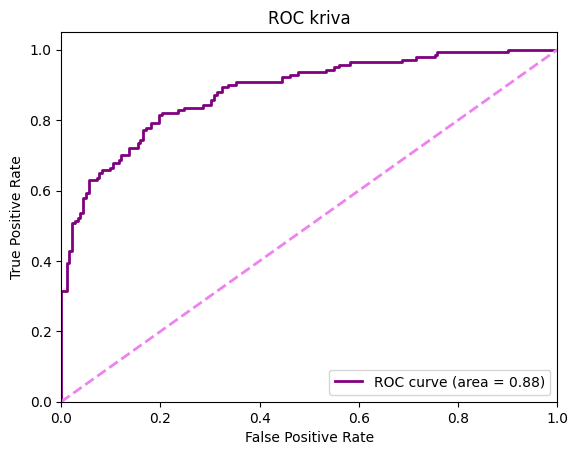

#################################
Accuracy (Tačnost): 0.7981366459627329
#################################
Precision (Preciznost): 0.7551020408163265
#################################
Recall(odziv): 0.7928571428571428
###############################
F1 Score: 0.7735191637630662
ROC AUC: 0.8816718995290423
Confusion Matrix (matrica konfuzije):
[[146  36]
 [ 29 111]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.83      0.80      0.82       182
           1       0.76      0.79      0.77       140

    accuracy                           0.80       322
   macro avg       0.79      0.80      0.80       322
weighted avg       0.80      0.80      0.80       322




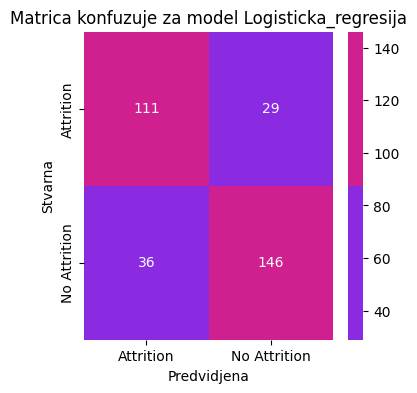

              precision    recall  f1-score   support

           0       0.83      0.80      0.82       182
           1       0.76      0.79      0.77       140

    accuracy                           0.80       322
   macro avg       0.79      0.80      0.80       322
weighted avg       0.80      0.80      0.80       322



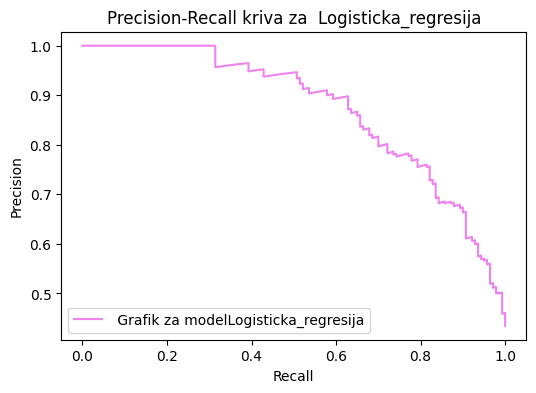

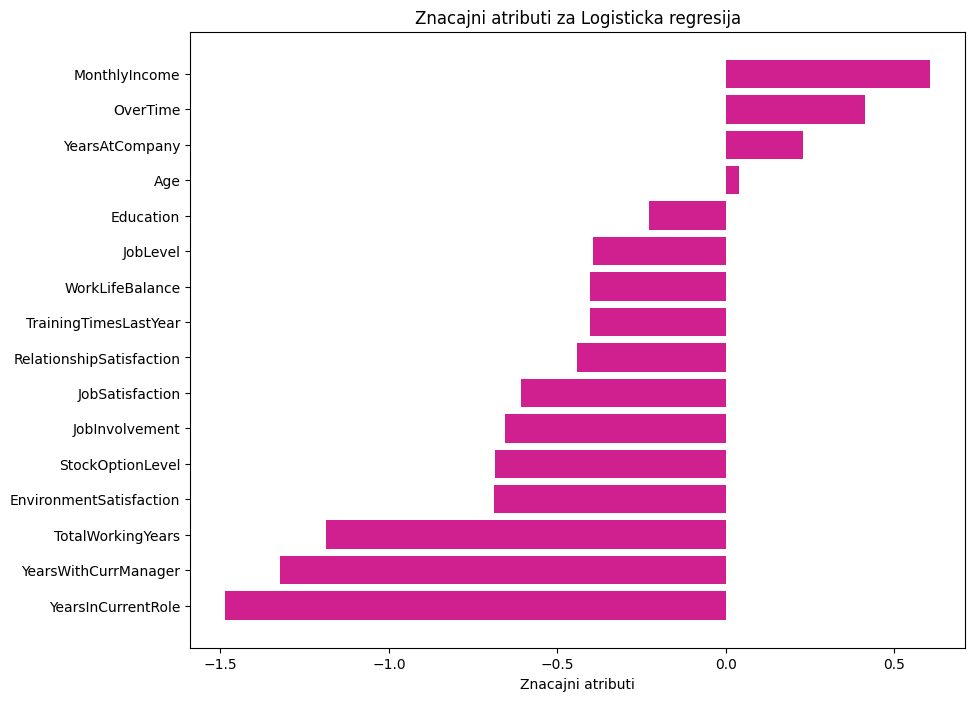

In [123]:
model_lr = LogisticRegression()
model_lr.fit(x_train, y_train)
y_pred_lr = model_lr.predict(x_test)
y_pred_prob_lr = model_lr.predict_proba(x_test)[:, 1]
print("########### MODEL LOGISTICKE REGRESIJE ###########")
krosval_score=krosvalidacija_i_prikaz_roc_auc_krive(model_lr, x_train,y_train,x_test, y_test,y_pred_lr, y_pred_prob_lr)
accuracy, precision, recall,f1_score_,roc_auc_score_,falseNegativi=evaluacija_modela_metrike("Logisticka_regresija", y_test,y_pred_lr, y_pred_prob_lr)

lista_znacajnih_atributa = prikaz_znacajnosti_atributa(model_lr, "Logisticka regresija", feature_names)
red_new= pd.DataFrame([{
"Ime modela": "Logisticka regresija",
"Accuracy":accuracy,
"Precision":precision,
"Recall" :recall,
"F1-score" :f1_score_,
"ROC_AUC_SCORE":roc_auc_score_,
"KrosvalidacioniScore":krosval_score,
"FALSE NEGATIVI":falseNegativi,
"HIPERPARAMETRIZACIJA":"NO",
"NAJBOLJI PARAMETRI":"NONE",
"NAJZNACAJNIJI ATRIBUTI":lista_znacajnih_atributa
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)

In [124]:
REZULTATI_TABELA

,Ime modela,Accuracy,Precision,Recall,F1-score,ROC_AUC_SCORE,KrosvalidacioniScore,FALSE NEGATIVI,HIPERPARAMETRIZACIJA,NAJBOLJI PARAMETRI,NAJZNACAJNIJI ATRIBUTI
0,Logisticka regresija,0.798137,0.755102,0.792857,0.773519,0.881672,0.889855,29,NO,NONE,"[YearsInCurrentRole, YearsWithCurrManager, Tot..."


In [125]:
from sklearn.tree import DecisionTreeClassifier

########### MODEL Drvo odlucivanja ###########
Krosvalidacioni scopre:  79.15%
ROC_AUC Score :  81.54%


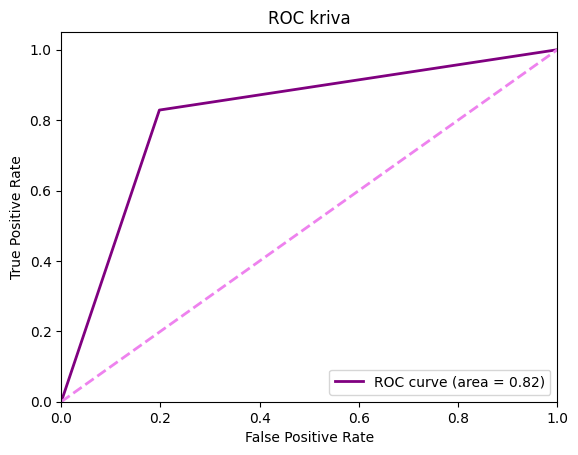

#################################
Accuracy (Tačnost): 0.8136645962732919
#################################
Precision (Preciznost): 0.7631578947368421
#################################
Recall(odziv): 0.8285714285714286
###############################
F1 Score: 0.7945205479452055
ROC AUC: 0.8153846153846155
Confusion Matrix (matrica konfuzije):
[[146  36]
 [ 24 116]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.86      0.80      0.83       182
           1       0.76      0.83      0.79       140

    accuracy                           0.81       322
   macro avg       0.81      0.82      0.81       322
weighted avg       0.82      0.81      0.81       322




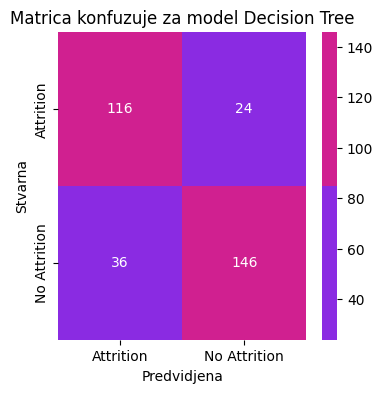

              precision    recall  f1-score   support

           0       0.86      0.80      0.83       182
           1       0.76      0.83      0.79       140

    accuracy                           0.81       322
   macro avg       0.81      0.82      0.81       322
weighted avg       0.82      0.81      0.81       322



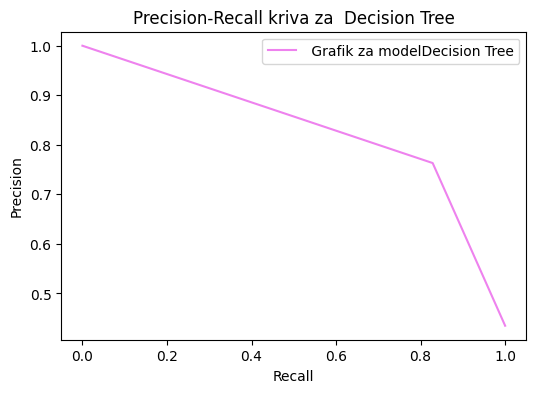

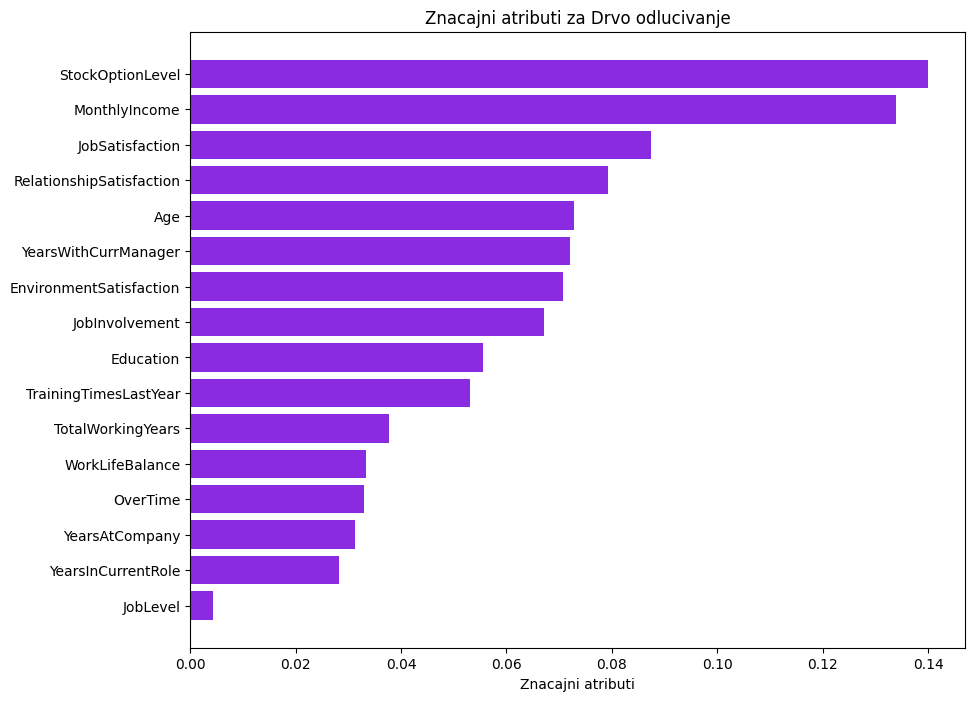

In [126]:
model_dt = DecisionTreeClassifier()
model_dt.fit(x_train, y_train)
y_pred_dt = model_dt.predict(x_test)
y_pred_prob_dt = model_dt.predict_proba(x_test)[:, 1]

print("########### MODEL Drvo odlucivanja ###########")
krosval_score=krosvalidacija_i_prikaz_roc_auc_krive(model_dt, x_train,y_train,x_test, y_test,y_pred_dt, y_pred_prob_dt)

accuracy, precision, recall,f1_score_,roc_auc_score_,falseNegativi=evaluacija_modela_metrike("Decision Tree", y_test,y_pred_dt, y_pred_prob_dt)
lista_znacajnih_atributa = prikaz_znacajnosti_atributa(model_dt, "Drvo odlucivanje", feature_names)
red_new= pd.DataFrame([{
"Ime modela": "Drvo odlucivanja",
"Accuracy":accuracy,
"Precision":precision,
"Recall" :recall,
"F1-score" :f1_score_,
"ROC_AUC_SCORE":roc_auc_score_,
"KrosvalidacioniScore":krosval_score,
"FALSE NEGATIVI":falseNegativi,
"HIPERPARAMETRIZACIJA":"NO",
"NAJBOLJI PARAMETRI":"NONE",
"NAJZNACAJNIJI ATRIBUTI":lista_znacajnih_atributa
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)

In [127]:
REZULTATI_TABELA

,Ime modela,Accuracy,Precision,Recall,F1-score,ROC_AUC_SCORE,KrosvalidacioniScore,FALSE NEGATIVI,HIPERPARAMETRIZACIJA,NAJBOLJI PARAMETRI,NAJZNACAJNIJI ATRIBUTI
0,Logisticka regresija,0.798137,0.755102,0.792857,0.773519,0.881672,0.889855,29,NO,NONE,"[YearsInCurrentRole, YearsWithCurrManager, Tot..."
1,Drvo odlucivanja,0.813665,0.763158,0.828571,0.794521,0.815385,0.785576,24,NO,NONE,"[JobLevel, YearsInCurrentRole, YearsAtCompany]"


In [129]:
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier, BaggingClassifier


########### MODEL Random Forest###########
Krosvalidacioni scopre:  94.62%
ROC_AUC Score :  88.35%


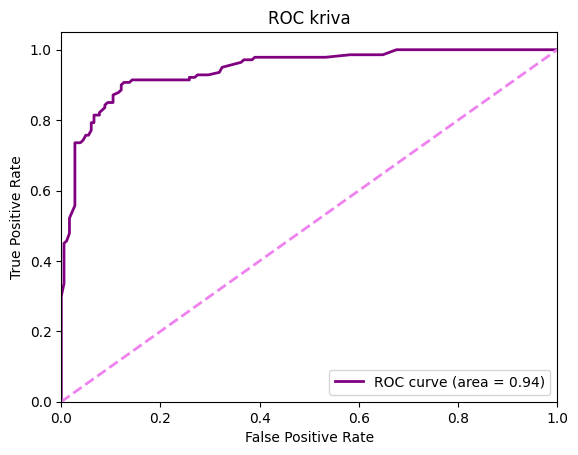

#################################
Accuracy (Tačnost): 0.8850931677018633
#################################
Precision (Preciznost): 0.8652482269503546
#################################
Recall(odziv): 0.8714285714285714
###############################
F1 Score: 0.8683274021352313
ROC AUC: 0.9432496075353218
Confusion Matrix (matrica konfuzije):
[[163  19]
 [ 18 122]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.90      0.90      0.90       182
           1       0.87      0.87      0.87       140

    accuracy                           0.89       322
   macro avg       0.88      0.88      0.88       322
weighted avg       0.89      0.89      0.89       322




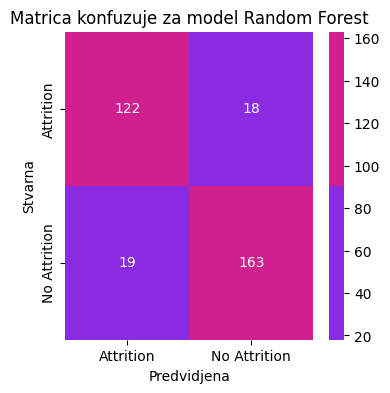

              precision    recall  f1-score   support

           0       0.90      0.90      0.90       182
           1       0.87      0.87      0.87       140

    accuracy                           0.89       322
   macro avg       0.88      0.88      0.88       322
weighted avg       0.89      0.89      0.89       322



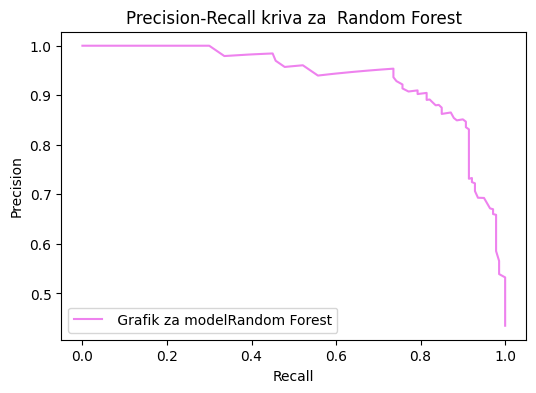

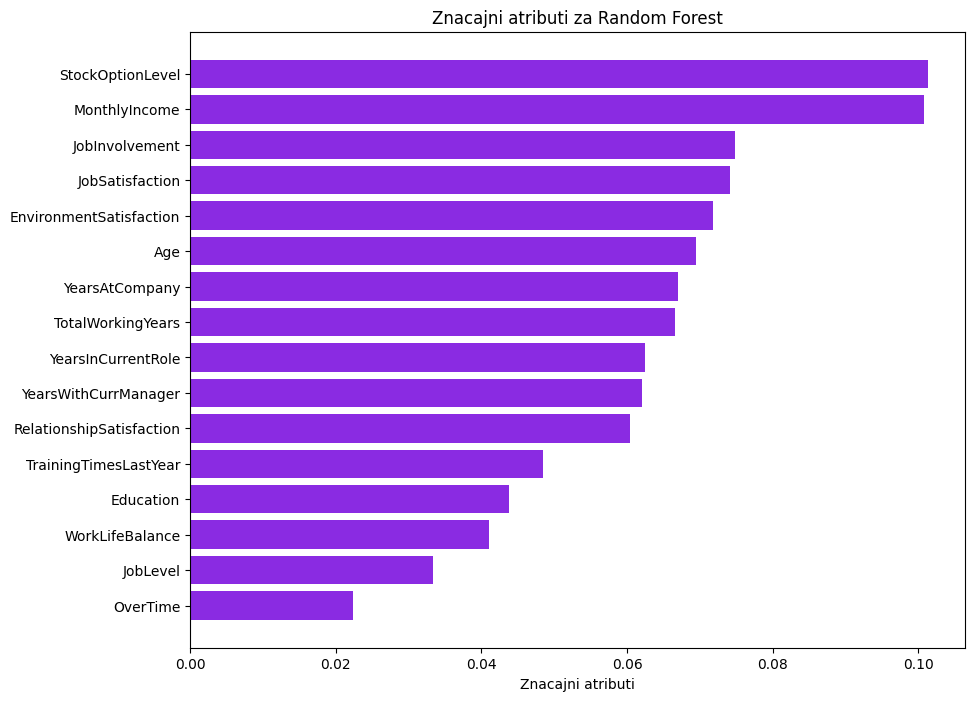

In [130]:
model_rf = RandomForestClassifier()
model_rf.fit(x_train, y_train)
y_pred_rf = model_rf.predict(x_test)
y_pred_prob_rf = model_rf.predict_proba(x_test)[:, 1]

print("########### MODEL Random Forest###########")
krosval_score=krosvalidacija_i_prikaz_roc_auc_krive(model_rf, x_train,y_train,x_test, y_test,y_pred_rf, y_pred_prob_rf)

accuracy, precision, recall,f1_score_,roc_auc_score_,falseNegativi=evaluacija_modela_metrike("Random Forest", y_test,y_pred_rf, y_pred_prob_rf)
lista_znacajnih_atributa = prikaz_znacajnosti_atributa(model_rf, "Random Forest", feature_names)
red_new= pd.DataFrame([{
"Ime modela": "Random Forest",
"Accuracy":accuracy,
"Precision":precision,
"Recall" :recall,
"F1-score" :f1_score_,
"ROC_AUC_SCORE":roc_auc_score_,
"KrosvalidacioniScore":krosval_score,
"FALSE NEGATIVI":falseNegativi,
"HIPERPARAMETRIZACIJA":"NO",
"NAJBOLJI PARAMETRI":"NONE",
"NAJZNACAJNIJI ATRIBUTI":lista_znacajnih_atributa
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)

########### MODEL Gradient Boosting Classifier ###########
Krosvalidacioni scopre:  92.65%
ROC_AUC Score :  85.08%


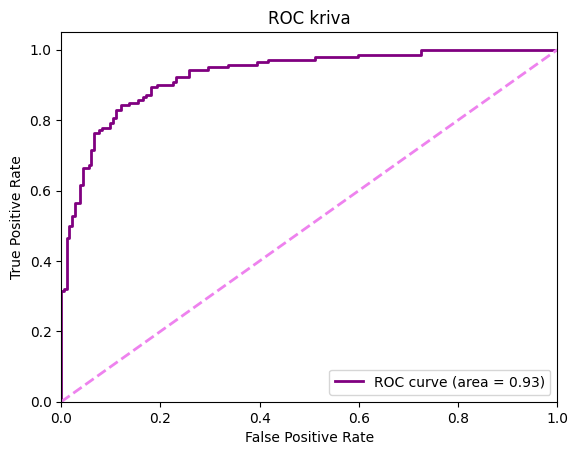

#################################
Accuracy (Tačnost): 0.8509316770186336
#################################
Precision (Preciznost): 0.815068493150685
#################################
Recall(odziv): 0.85
###############################
F1 Score: 0.8321678321678322
ROC AUC: 0.9288854003139718
Confusion Matrix (matrica konfuzije):
[[155  27]
 [ 21 119]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.88      0.85      0.87       182
           1       0.82      0.85      0.83       140

    accuracy                           0.85       322
   macro avg       0.85      0.85      0.85       322
weighted avg       0.85      0.85      0.85       322




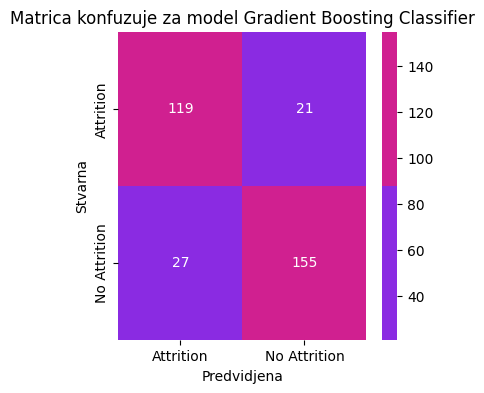

              precision    recall  f1-score   support

           0       0.88      0.85      0.87       182
           1       0.82      0.85      0.83       140

    accuracy                           0.85       322
   macro avg       0.85      0.85      0.85       322
weighted avg       0.85      0.85      0.85       322



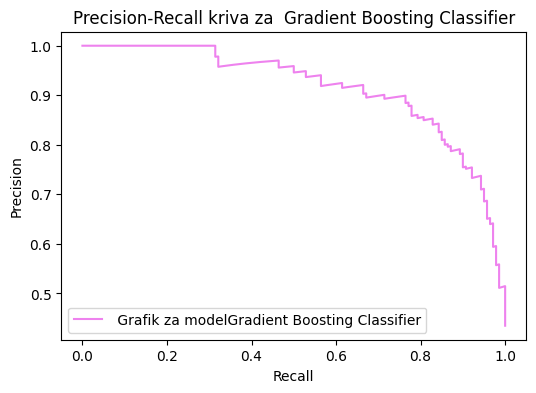

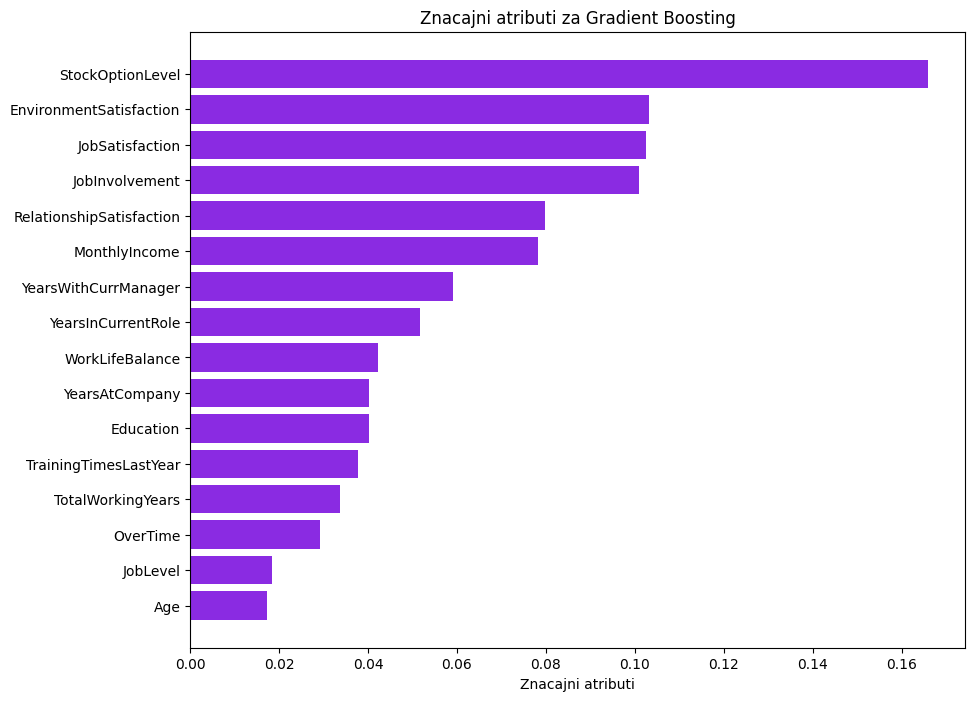

In [131]:
model_gb = GradientBoostingClassifier()
model_gb.fit(x_train, y_train)
y_pred_gb = model_gb.predict(x_test)
y_pred_prob_gb = model_gb.predict_proba(x_test)[:, 1]

print("########### MODEL Gradient Boosting Classifier ###########")
krosval_score=krosvalidacija_i_prikaz_roc_auc_krive(model_gb, x_train,y_train,x_test, y_test,y_pred_gb, y_pred_prob_gb)

accuracy, precision, recall,f1_score_,roc_auc_score_,falseNegativi=evaluacija_modela_metrike("Gradient Boosting Classifier", y_test,y_pred_gb, y_pred_prob_gb)
lista_znacajnih_atributa = prikaz_znacajnosti_atributa(model_gb, "Gradient Boosting", feature_names)
red_new= pd.DataFrame([{
"Ime modela": "Gradient Boosting",
"Accuracy":accuracy,
"Precision":precision,
"Recall" :recall,
"F1-score" :f1_score_,
"ROC_AUC_SCORE":roc_auc_score_,
"KrosvalidacioniScore":krosval_score,
"FALSE NEGATIVI":falseNegativi,
"HIPERPARAMETRIZACIJA":"NO",
"NAJBOLJI PARAMETRI":"NONE",
"NAJZNACAJNIJI ATRIBUTI":lista_znacajnih_atributa
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)

In [132]:
REZULTATI_TABELA

,Ime modela,Accuracy,Precision,Recall,F1-score,ROC_AUC_SCORE,KrosvalidacioniScore,FALSE NEGATIVI,HIPERPARAMETRIZACIJA,NAJBOLJI PARAMETRI,NAJZNACAJNIJI ATRIBUTI
0,Logisticka regresija,0.798137,0.755102,0.792857,0.773519,0.881672,0.889855,29,NO,NONE,"[YearsInCurrentRole, YearsWithCurrManager, Tot..."
1,Drvo odlucivanja,0.813665,0.763158,0.828571,0.794521,0.815385,0.785576,24,NO,NONE,"[JobLevel, YearsInCurrentRole, YearsAtCompany]"
2,Random Forest,0.885093,0.865248,0.871429,0.868327,0.943250,0.945672,18,NO,NONE,"[OverTime, JobLevel, WorkLifeBalance]"
3,Gradient Boosting,0.850932,0.815068,0.850000,0.832168,0.928885,0.926648,21,NO,NONE,"[Age, JobLevel, OverTime]"


########### MODEL Ada Boost Classifier ###########
Krosvalidacioni scopre:  90.42%
ROC_AUC Score :  82.91%


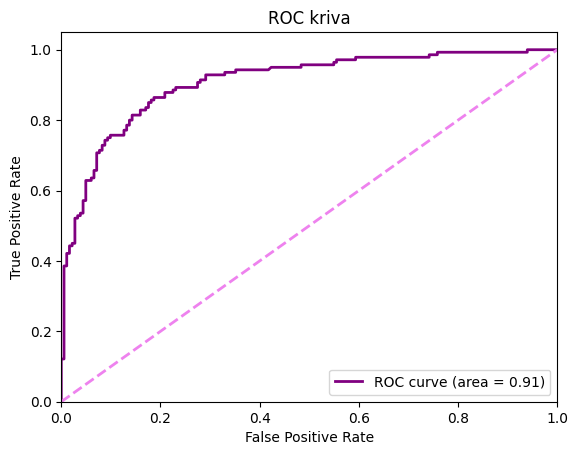

#################################
Accuracy (Tačnost): 0.8291925465838509
#################################
Precision (Preciznost): 0.7891156462585034
#################################
Recall(odziv): 0.8285714285714286
###############################
F1 Score: 0.8083623693379791
ROC AUC: 0.9074764521193093
Confusion Matrix (matrica konfuzije):
[[151  31]
 [ 24 116]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.86      0.83      0.85       182
           1       0.79      0.83      0.81       140

    accuracy                           0.83       322
   macro avg       0.83      0.83      0.83       322
weighted avg       0.83      0.83      0.83       322




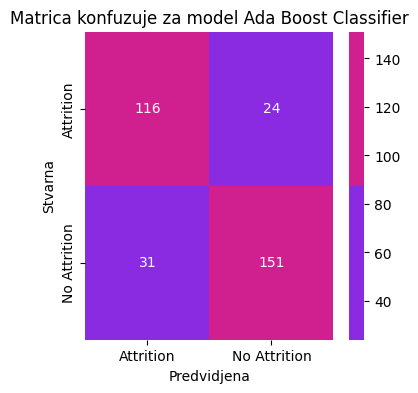

              precision    recall  f1-score   support

           0       0.86      0.83      0.85       182
           1       0.79      0.83      0.81       140

    accuracy                           0.83       322
   macro avg       0.83      0.83      0.83       322
weighted avg       0.83      0.83      0.83       322



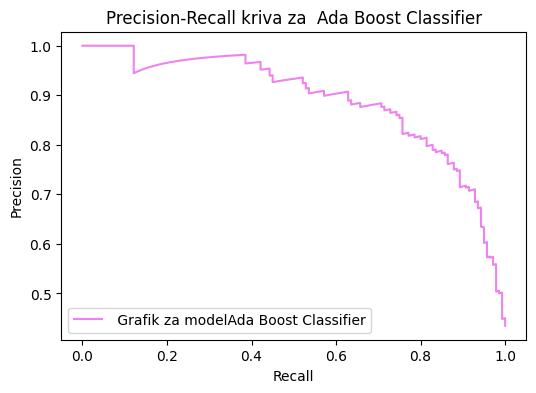

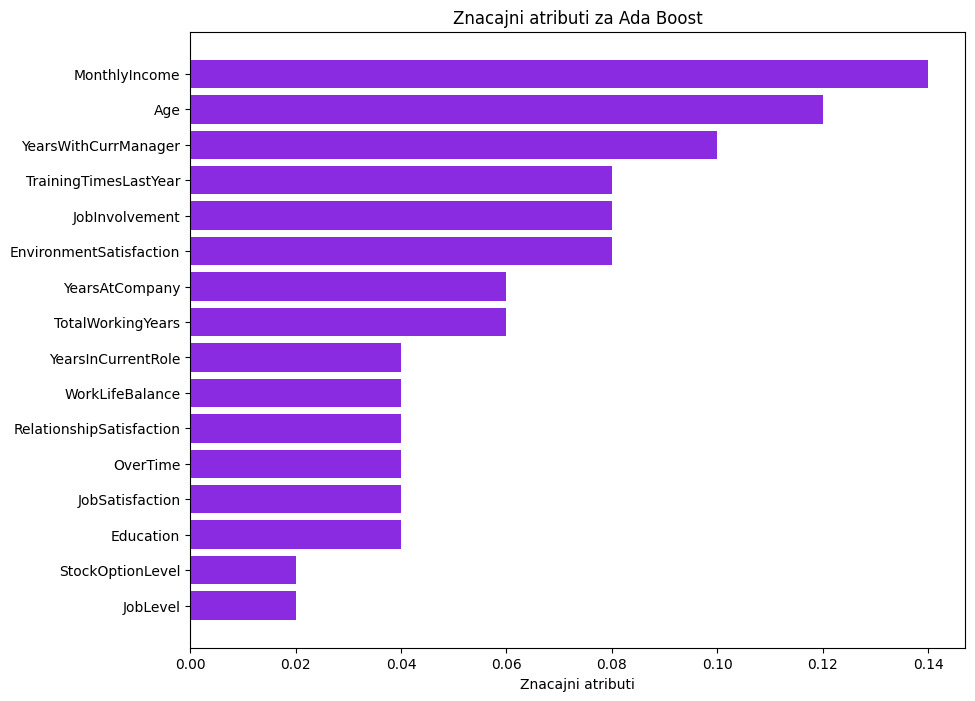

In [133]:
model_ab = AdaBoostClassifier()
model_ab.fit(x_train, y_train)
y_pred_ab = model_ab.predict(x_test)
y_pred_prob_ab = model_ab.predict_proba(x_test)[:, 1]

print("########### MODEL Ada Boost Classifier ###########")
krosval_score=krosvalidacija_i_prikaz_roc_auc_krive(model_ab, x_train,y_train,x_test, y_test,y_pred_ab, y_pred_prob_ab)

accuracy, precision, recall,f1_score_,roc_auc_score_,falseNegativi=evaluacija_modela_metrike("Ada Boost Classifier", y_test,y_pred_ab, y_pred_prob_ab)
lista_znacajnih_atributa = prikaz_znacajnosti_atributa(model_ab, "Ada Boost", feature_names)
red_new= pd.DataFrame([{
"Ime modela": "Ada Boost",
"Accuracy":accuracy,
"Precision":precision,
"Recall" :recall,
"F1-score" :f1_score_,
"ROC_AUC_SCORE":roc_auc_score_,
"KrosvalidacioniScore":krosval_score,
"FALSE NEGATIVI":falseNegativi,
"HIPERPARAMETRIZACIJA":"NO",
"NAJBOLJI PARAMETRI":"NONE",
"NAJZNACAJNIJI ATRIBUTI":lista_znacajnih_atributa
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)

########### MODEL Bagging Classifier ###########
Krosvalidacioni scopre:  91.18%
ROC_AUC Score :  86.04%


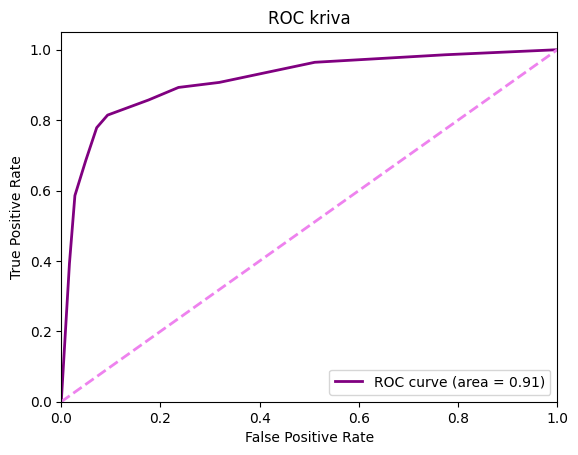

#################################
Accuracy (Tačnost): 0.8664596273291926
#################################
Precision (Preciznost): 0.8702290076335878
#################################
Recall(odziv): 0.8142857142857143
###############################
F1 Score: 0.8413284132841329
ROC AUC: 0.9128728414442702
Confusion Matrix (matrica konfuzije):
[[165  17]
 [ 26 114]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.86      0.91      0.88       182
           1       0.87      0.81      0.84       140

    accuracy                           0.87       322
   macro avg       0.87      0.86      0.86       322
weighted avg       0.87      0.87      0.87       322




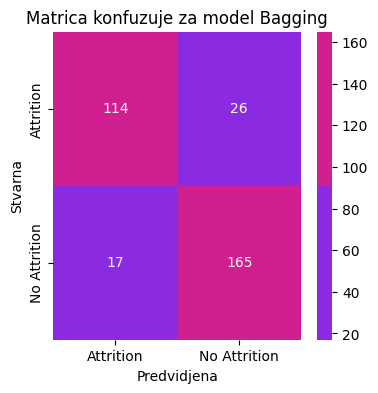

              precision    recall  f1-score   support

           0       0.86      0.91      0.88       182
           1       0.87      0.81      0.84       140

    accuracy                           0.87       322
   macro avg       0.87      0.86      0.86       322
weighted avg       0.87      0.87      0.87       322



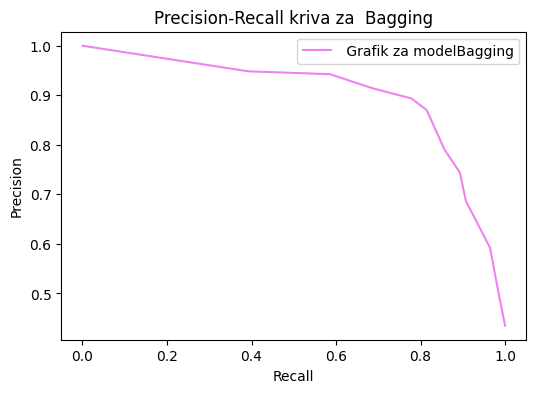

Model nema podržanu značajnost attributa


In [134]:
model_bg = BaggingClassifier()
model_bg.fit(x_train, y_train)
y_pred_bg = model_bg.predict(x_test)
y_pred_prob_bg = model_bg.predict_proba(x_test)[:, 1]

print("########### MODEL Bagging Classifier ###########")
krosval_score=krosvalidacija_i_prikaz_roc_auc_krive(model_bg, x_train,y_train,x_test, y_test,y_pred_bg, y_pred_prob_bg)

accuracy, precision, recall,f1_score_,roc_auc_score_,falseNegativi=evaluacija_modela_metrike("Bagging", y_test,y_pred_bg, y_pred_prob_bg)
lista_znacajnih_atributa = prikaz_znacajnosti_atributa(model_bg, "Bagging Classifier", feature_names)
red_new= pd.DataFrame([{
"Ime modela": "Bagging",
"Accuracy":accuracy,
"Precision":precision,
"Recall" :recall,
"F1-score" :f1_score_,
"ROC_AUC_SCORE":roc_auc_score_,
"KrosvalidacioniScore":krosval_score,
"FALSE NEGATIVI":falseNegativi,
"HIPERPARAMETRIZACIJA":"NO",
"NAJBOLJI PARAMETRI":"NONE",
"NAJZNACAJNIJI ATRIBUTI":lista_znacajnih_atributa
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)


In [135]:
import xgboost as xgb
import lightgbm as lgb
import catboost as cb

########### MODEL XGB Classifier###########
Krosvalidacioni scopre:  94.45%
ROC_AUC Score :  86.79%


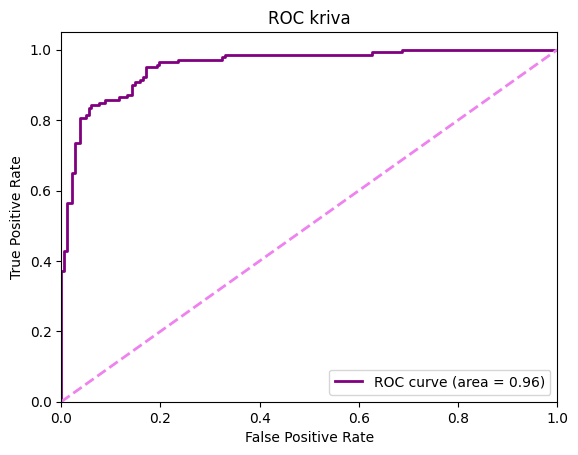

#################################
Accuracy (Tačnost): 0.8664596273291926
#################################
Precision (Preciznost): 0.825503355704698
#################################
Recall(odziv): 0.8785714285714286
###############################
F1 Score: 0.8512110726643599
ROC AUC: 0.9554552590266876
Confusion Matrix (matrica konfuzije):
[[156  26]
 [ 17 123]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.90      0.86      0.88       182
           1       0.83      0.88      0.85       140

    accuracy                           0.87       322
   macro avg       0.86      0.87      0.87       322
weighted avg       0.87      0.87      0.87       322




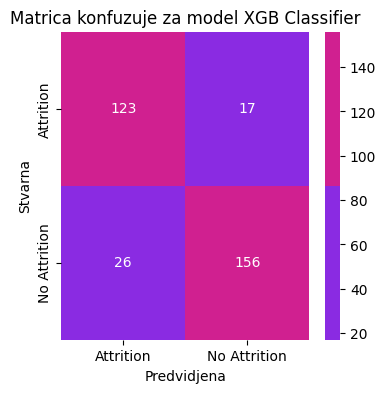

              precision    recall  f1-score   support

           0       0.90      0.86      0.88       182
           1       0.83      0.88      0.85       140

    accuracy                           0.87       322
   macro avg       0.86      0.87      0.87       322
weighted avg       0.87      0.87      0.87       322



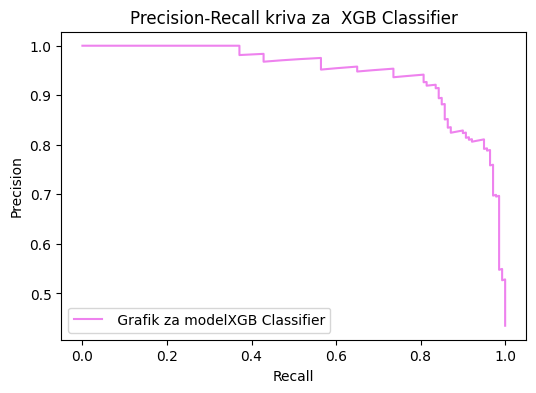

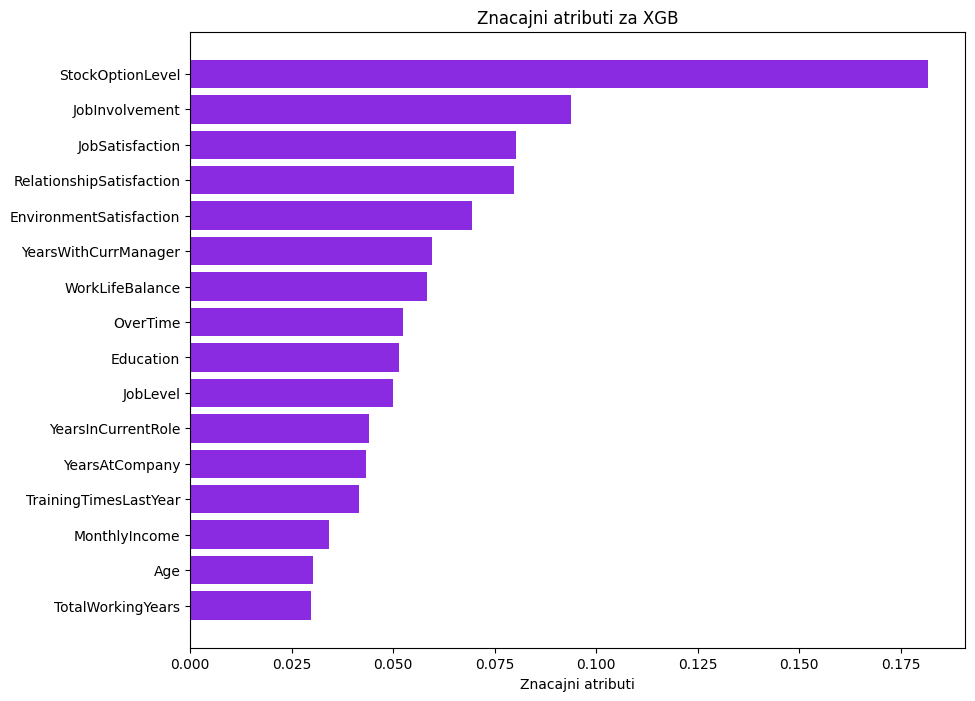

In [136]:
model_xgb = xgb.XGBClassifier()
model_xgb.fit(x_train, y_train)
y_pred_xgb = model_xgb.predict(x_test)
y_pred_prob_xgb = model_xgb.predict_proba(x_test)[:, 1]

print("########### MODEL XGB Classifier###########")
krosval_score=krosvalidacija_i_prikaz_roc_auc_krive(model_xgb, x_train,y_train,x_test, y_test,y_pred_xgb, y_pred_prob_xgb)

accuracy, precision, recall,f1_score_,roc_auc_score_,falseNegativi=evaluacija_modela_metrike("XGB Classifier", y_test,y_pred_xgb, y_pred_prob_xgb)
lista_znacajnih_atributa = prikaz_znacajnosti_atributa(model_xgb, "XGB", feature_names)
red_new= pd.DataFrame([{
"Ime modela": "XGB",
"Accuracy":accuracy,
"Precision":precision,
"Recall" :recall,
"F1-score" :f1_score_,
"ROC_AUC_SCORE":roc_auc_score_,
"KrosvalidacioniScore":krosval_score,
"FALSE NEGATIVI":falseNegativi,
"HIPERPARAMETRIZACIJA":"NO",
"NAJBOLJI PARAMETRI":"NONE",
"NAJZNACAJNIJI ATRIBUTI":lista_znacajnih_atributa
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)

[LightGBM] [Info] Number of positive: 844, number of negative: 976
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002267 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 441
[LightGBM] [Info] Number of data points in the train set: 1820, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.463736 -> initscore=-0.145310
[LightGBM] [Info] Start training from score -0.145310
########### MODEL LGBM Classifier###########
[LightGBM] [Info] Number of positive: 760, number of negative: 878
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000751 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 441
[LightGBM] [Info] Number of data points in the train set: 1638, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0

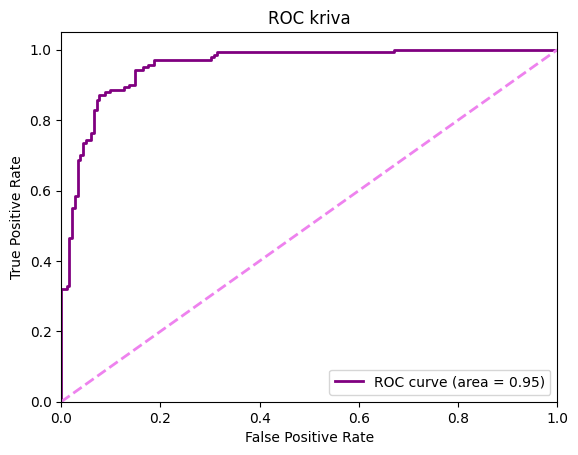

#################################
Accuracy (Tačnost): 0.8913043478260869
#################################
Precision (Preciznost): 0.8671328671328671
#################################
Recall(odziv): 0.8857142857142857
###############################
F1 Score: 0.8763250883392225
ROC AUC: 0.9543171114599687
Confusion Matrix (matrica konfuzije):
[[163  19]
 [ 16 124]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.91      0.90      0.90       182
           1       0.87      0.89      0.88       140

    accuracy                           0.89       322
   macro avg       0.89      0.89      0.89       322
weighted avg       0.89      0.89      0.89       322




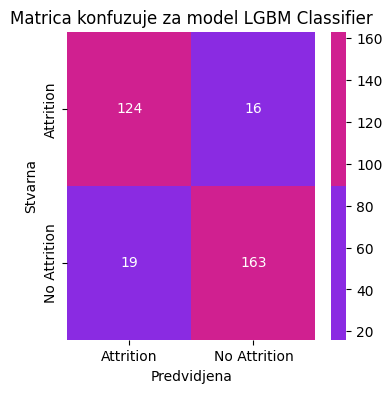

              precision    recall  f1-score   support

           0       0.91      0.90      0.90       182
           1       0.87      0.89      0.88       140

    accuracy                           0.89       322
   macro avg       0.89      0.89      0.89       322
weighted avg       0.89      0.89      0.89       322



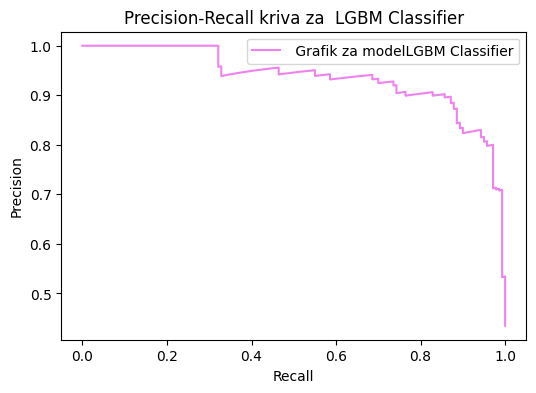

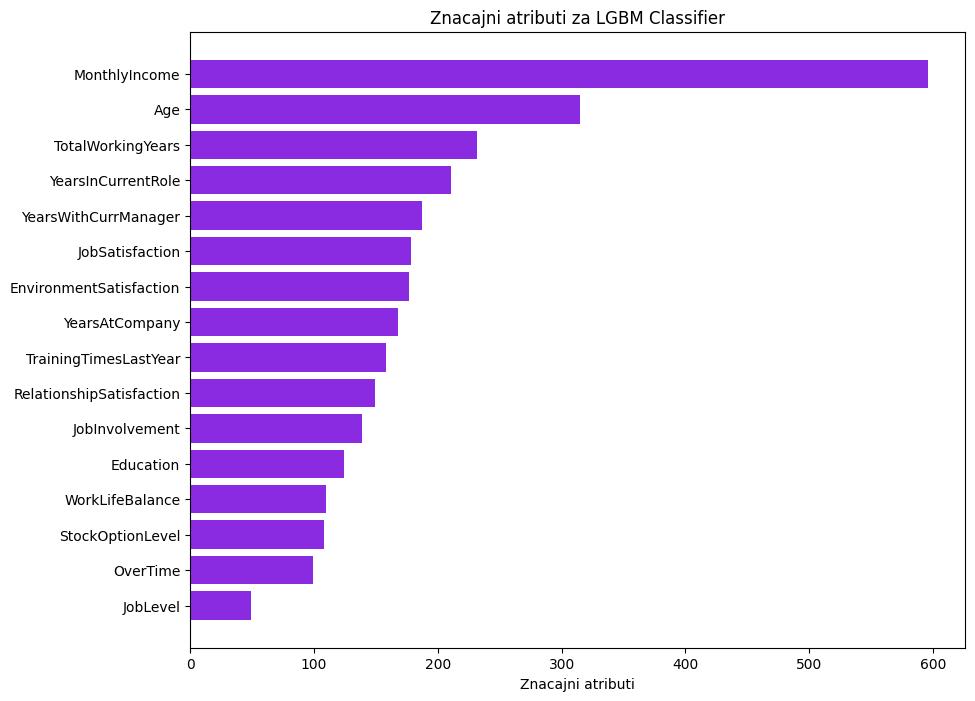

In [137]:
model_lgb = lgb.LGBMClassifier()
model_lgb.fit(x_train, y_train)
y_pred_lgb = model_lgb.predict(x_test)
y_pred_prob_lgb = model_lgb.predict_proba(x_test)[:, 1]

print("########### MODEL LGBM Classifier###########")
krosval_score=krosvalidacija_i_prikaz_roc_auc_krive(model_lgb, x_train,y_train,x_test, y_test,y_pred_lgb, y_pred_prob_lgb)

accuracy, precision, recall,f1_score_,roc_auc_score_,falseNegativi=evaluacija_modela_metrike("LGBM Classifier", y_test,y_pred_lgb, y_pred_prob_lgb)
lista_znacajnih_atributa = prikaz_znacajnosti_atributa(model_lgb, "LGBM Classifier", feature_names)
red_new= pd.DataFrame([{
"Ime modela": "LGBM Classifier",
"Accuracy":accuracy,
"Precision":precision,
"Recall" :recall,
"F1-score" :f1_score_,
"ROC_AUC_SCORE":roc_auc_score_,
"KrosvalidacioniScore":krosval_score,
"FALSE NEGATIVI":falseNegativi,
"HIPERPARAMETRIZACIJA":"NO",
"NAJBOLJI PARAMETRI":"NONE",
"NAJZNACAJNIJI ATRIBUTI":lista_znacajnih_atributa
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)

Learning rate set to 0.013304
0:	learn: 0.6867271	total: 142ms	remaining: 2m 21s
1:	learn: 0.6797358	total: 147ms	remaining: 1m 13s
2:	learn: 0.6729248	total: 150ms	remaining: 50s
3:	learn: 0.6668072	total: 155ms	remaining: 38.5s
4:	learn: 0.6604738	total: 158ms	remaining: 31.5s
5:	learn: 0.6546439	total: 163ms	remaining: 27s
6:	learn: 0.6480609	total: 167ms	remaining: 23.7s
7:	learn: 0.6419585	total: 171ms	remaining: 21.2s
8:	learn: 0.6367860	total: 175ms	remaining: 19.2s
9:	learn: 0.6309616	total: 178ms	remaining: 17.6s
10:	learn: 0.6250508	total: 181ms	remaining: 16.3s
11:	learn: 0.6209818	total: 186ms	remaining: 15.3s
12:	learn: 0.6163884	total: 191ms	remaining: 14.5s
13:	learn: 0.6110670	total: 196ms	remaining: 13.8s
14:	learn: 0.6055761	total: 204ms	remaining: 13.4s
15:	learn: 0.6008668	total: 208ms	remaining: 12.8s
16:	learn: 0.5957805	total: 212ms	remaining: 12.3s
17:	learn: 0.5911843	total: 220ms	remaining: 12s
18:	learn: 0.5867145	total: 224ms	remaining: 11.6s
19:	learn: 0.58

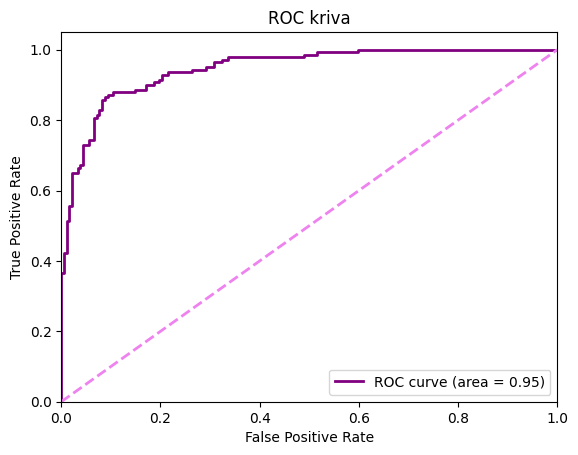

#################################
Accuracy (Tačnost): 0.8757763975155279
#################################
Precision (Preciznost): 0.8424657534246576
#################################
Recall(odziv): 0.8785714285714286
###############################
F1 Score: 0.8601398601398601
ROC AUC: 0.9464285714285714
Confusion Matrix (matrica konfuzije):
[[159  23]
 [ 17 123]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.90      0.87      0.89       182
           1       0.84      0.88      0.86       140

    accuracy                           0.88       322
   macro avg       0.87      0.88      0.87       322
weighted avg       0.88      0.88      0.88       322




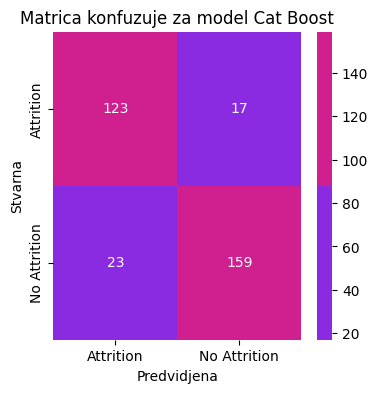

              precision    recall  f1-score   support

           0       0.90      0.87      0.89       182
           1       0.84      0.88      0.86       140

    accuracy                           0.88       322
   macro avg       0.87      0.88      0.87       322
weighted avg       0.88      0.88      0.88       322



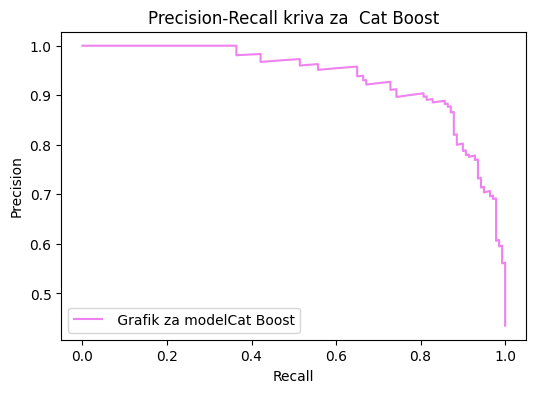

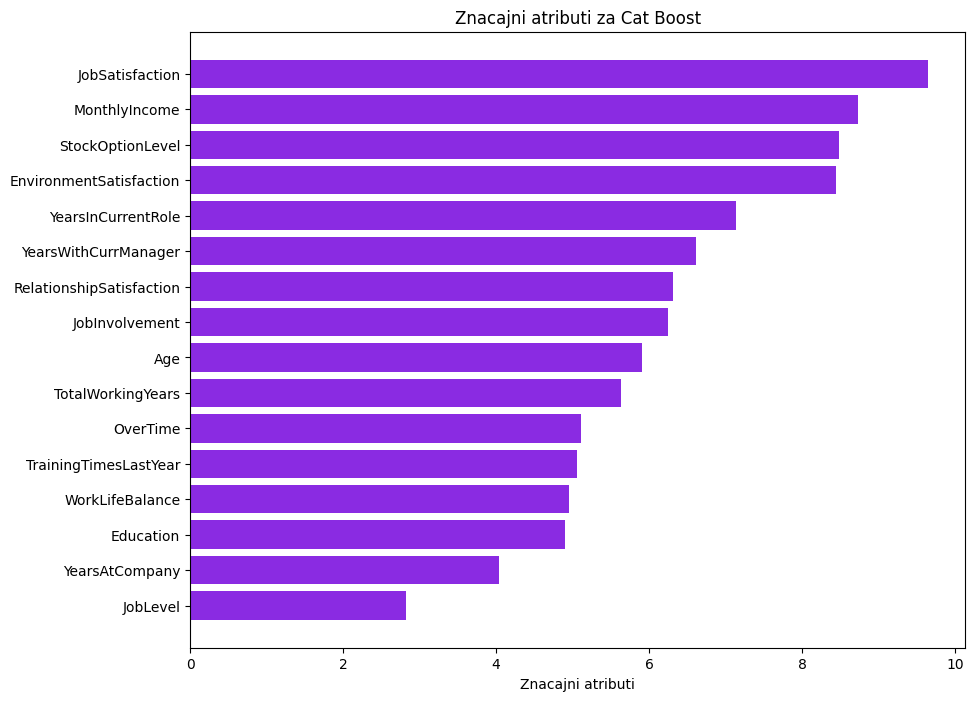

In [139]:
model_cb = cb.CatBoostClassifier()
model_cb.fit(x_train, y_train)
y_pred_cb = model_cb.predict(x_test)
y_pred_prob_cb = model_cb.predict_proba(x_test)[:, 1]

print("########### MODEL Cat Boost ###########")
krosval_score=krosvalidacija_i_prikaz_roc_auc_krive(model_cb, x_train,y_train,x_test, y_test,y_pred_cb, y_pred_prob_cb)

accuracy, precision, recall,f1_score_,roc_auc_score_,falseNegativi=evaluacija_modela_metrike("Cat Boost", y_test,y_pred_cb, y_pred_prob_cb)
lista_znacajnih_atributa = prikaz_znacajnosti_atributa(model_cb, "Cat Boost", feature_names)
red_new= pd.DataFrame([{
"Ime modela": "Cat Boost",
"Accuracy":accuracy,
"Precision":precision,
"Recall" :recall,
"F1-score" :f1_score_,
"ROC_AUC_SCORE":roc_auc_score_,
"KrosvalidacioniScore":krosval_score,
"FALSE NEGATIVI":falseNegativi,
"HIPERPARAMETRIZACIJA":"NO",
"NAJBOLJI PARAMETRI":"NONE",
"NAJZNACAJNIJI ATRIBUTI":lista_znacajnih_atributa
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)

In [138]:
REZULTATI_TABELA

,Ime modela,Accuracy,Precision,Recall,F1-score,ROC_AUC_SCORE,KrosvalidacioniScore,FALSE NEGATIVI,HIPERPARAMETRIZACIJA,NAJBOLJI PARAMETRI,NAJZNACAJNIJI ATRIBUTI
0,Logisticka regresija,0.798137,0.755102,0.792857,0.773519,0.881672,0.889855,29,NO,NONE,"[YearsInCurrentRole, YearsWithCurrManager, Tot..."
1,Drvo odlucivanja,0.813665,0.763158,0.828571,0.794521,0.815385,0.785576,24,NO,NONE,"[JobLevel, YearsInCurrentRole, YearsAtCompany]"
2,Random Forest,0.885093,0.865248,0.871429,0.868327,0.943250,0.945672,18,NO,NONE,"[OverTime, JobLevel, WorkLifeBalance]"
3,Gradient Boosting,0.850932,0.815068,0.850000,0.832168,0.928885,0.926648,21,NO,NONE,"[Age, JobLevel, OverTime]"
4,Ada Boost,0.829193,0.789116,0.828571,0.808362,0.907476,0.904184,24,NO,NONE,"[JobLevel, StockOptionLevel, Education]"
5,Bagging,0.866460,0.870229,0.814286,0.841328,0.912873,0.914960,26,NO,NONE,[]
6,XGB,0.866460,0.825503,0.878571,0.851211,0.955455,0.944500,17,NO,NONE,"[TotalWorkingYears, Age, MonthlyIncome]"
7,LGBM Classifier,0.891304,0.867133,0.885714,0.876325,0.954317,0.943262,16,NO,NONE,"[JobLevel, OverTime, StockOptionLevel]"


In [111]:
#### JOS VISE OSNOVNIH MODELA

In [141]:
from sklearn.naive_bayes import GaussianNB

########### MODEL Naive Bayes ###########
Krosvalidacioni scopre:  83.24%
ROC_AUC Score :  72.66%


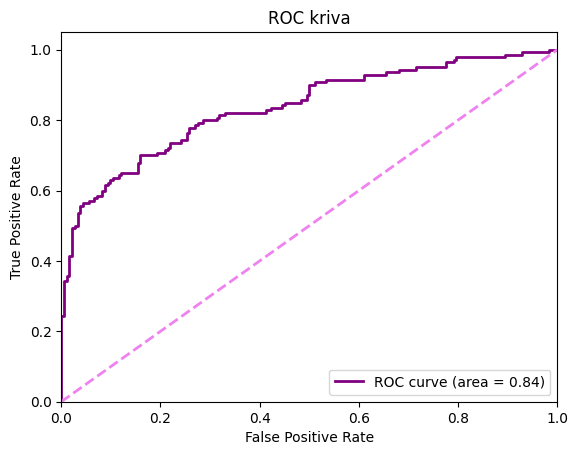

#################################
Accuracy (Tačnost): 0.7142857142857143
#################################
Precision (Preciznost): 0.6318681318681318
#################################
Recall(odziv): 0.8214285714285714
###############################
F1 Score: 0.7142857142857142
ROC AUC: 0.837087912087912
Confusion Matrix (matrica konfuzije):
[[115  67]
 [ 25 115]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.82      0.63      0.71       182
           1       0.63      0.82      0.71       140

    accuracy                           0.71       322
   macro avg       0.73      0.73      0.71       322
weighted avg       0.74      0.71      0.71       322




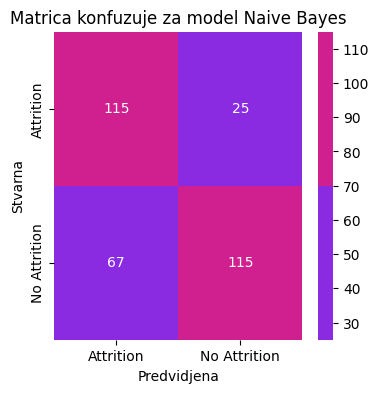

              precision    recall  f1-score   support

           0       0.82      0.63      0.71       182
           1       0.63      0.82      0.71       140

    accuracy                           0.71       322
   macro avg       0.73      0.73      0.71       322
weighted avg       0.74      0.71      0.71       322



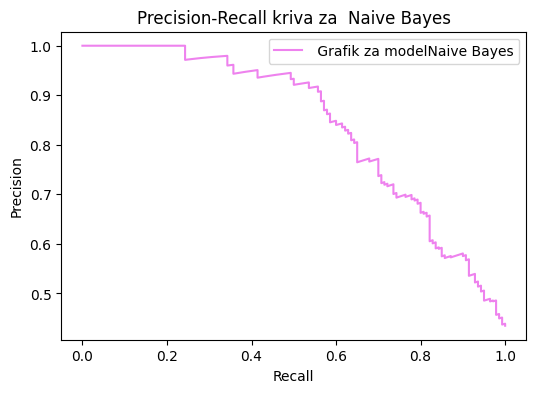

Model nema podržanu značajnost attributa


In [142]:
model_gnb = GaussianNB()
model_gnb.fit(x_train, y_train)
y_pred_gnb = model_gnb.predict(x_test)
y_pred_prob_gnb = model_gnb.predict_proba(x_test)[:, 1]

print("########### MODEL Naive Bayes ###########")
krosval_score=krosvalidacija_i_prikaz_roc_auc_krive(model_gnb, x_train,y_train,x_test, y_test,y_pred_gnb, y_pred_prob_gnb)

accuracy, precision, recall,f1_score_,roc_auc_score_,falseNegativi=evaluacija_modela_metrike("Naive Bayes", y_test,y_pred_gnb, y_pred_prob_gnb)

lista_znacajnih_atributa = prikaz_znacajnosti_atributa(model_gnb, "Naive Bayes", feature_names)
red_new= pd.DataFrame([{
"Ime modela": "Naive Bayes",
"Accuracy":accuracy,
"Precision":precision,
"Recall" :recall,
"F1-score" :f1_score_,
"ROC_AUC_SCORE":roc_auc_score_,
"KrosvalidacioniScore":krosval_score,
"FALSE NEGATIVI":falseNegativi,
"HIPERPARAMETRIZACIJA":"NO",
"NAJBOLJI PARAMETRI":"NONE",
"NAJZNACAJNIJI ATRIBUTI":lista_znacajnih_atributa
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)

In [114]:
# from sklearn.svm import SVC

########### MODEL Support Vector Machine ###########
Krosvalidacioni scopre:  91.56%
ROC_AUC Score :  83.65%


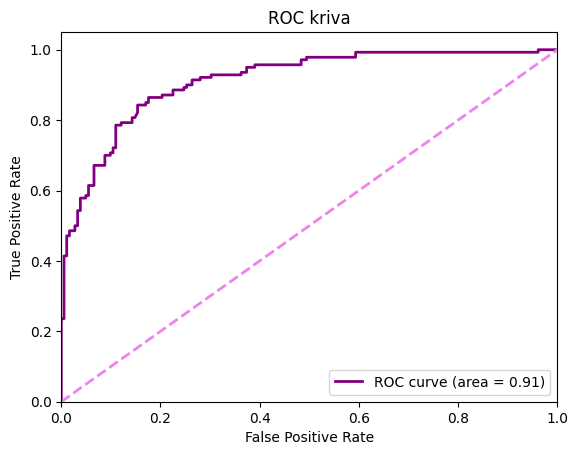

#################################
Accuracy (Tačnost): 0.8385093167701864
#################################
Precision (Preciznost): 0.8098591549295775
#################################
Recall(odziv): 0.8214285714285714
###############################
F1 Score: 0.8156028368794327
ROC AUC: 0.9127551020408163
Confusion Matrix (matrica konfuzije):
[[155  27]
 [ 25 115]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.86      0.85      0.86       182
           1       0.81      0.82      0.82       140

    accuracy                           0.84       322
   macro avg       0.84      0.84      0.84       322
weighted avg       0.84      0.84      0.84       322




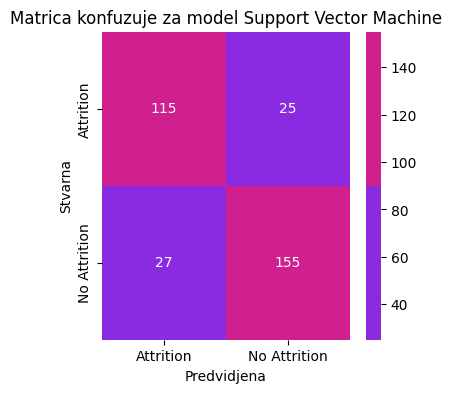

              precision    recall  f1-score   support

           0       0.86      0.85      0.86       182
           1       0.81      0.82      0.82       140

    accuracy                           0.84       322
   macro avg       0.84      0.84      0.84       322
weighted avg       0.84      0.84      0.84       322



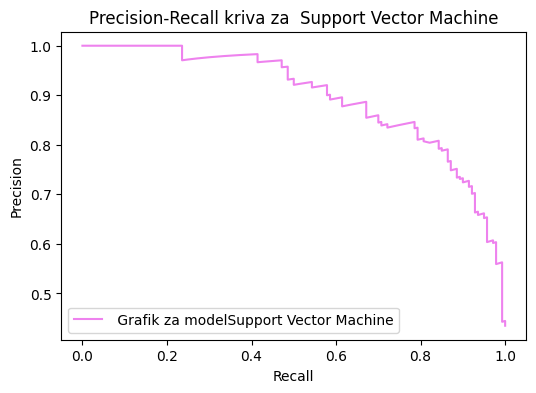

In [115]:
# model_svc = SVC(probability=True)
# model_svc.fit(x_train, y_train)
# y_pred_svc = model_svc.predict(x_test)
# y_pred_prob_svc = model_svc.predict_proba(x_test)[:, 1]

# print("########### MODEL Support Vector Machine ###########")
# krosvalidacija_i_prikaz_roc_auc_krive(model_svc, x_train,y_train,x_test, y_test,y_pred_svc, y_pred_prob_svc)

# evaluacija_modela_metrike("Support Vector Machine", y_test,y_pred_svc, y_pred_prob_svc)

In [143]:
from sklearn.model_selection import GridSearchCV

In [146]:
param_grids = {
    'Logistic Regression': {
        'C': [0.01, 0.1, 1, 10, 100],
        'solver': ['lbfgs', 'liblinear']
    },
    'Decision Tree': {
        'max_depth': [None, 10, 20, 30, 40],
        'min_samples_split': [2, 5, 10,20]
    },
    'Random Forest': {
        'n_estimators': [50, 100, 200],
        'max_depth': [None, 10,15,20, 30],
        'min_samples_split': [2, 5, 10]
    },
    'Gradient Boosting': {
        'n_estimators': [50, 100, 200],
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 5, 7]
    },
    'AdaBoost': {
        'n_estimators': [50, 100, 200],
        'learning_rate': [0.01, 0.1, 1]
    },
    'Bagging': {
        'n_estimators': [10, 50, 100],
        'max_samples': [0.5, 1.0],
        'max_features': [0.5, 1.0]
    },
    'XGBoost': {
        'n_estimators': [50, 100, 200,500,1000],
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 5, 7]
    },
    'LightGBM': {
        'n_estimators': [50, 100, 200,500,1000],
        'learning_rate': [0.01, 0.1, 0.2],
        'num_leaves': [31, 62, 127]
    },
    'CatBoost': {
        'iterations': [100, 200, 300],
        'learning_rate': [0.01, 0.1, 0.2],
        'depth': [3, 5, 7]
    },
    'GaussianNB': {
    'var_smoothing': [1e-9, 1e-8, 1e-7, 1e-6]
    }
}

In [147]:
def treniranje_i_tjunovanje(model, param_grid, model_name):
    print(f"Treniranje modela {model_name} nakon optimizacije parametara ")
    grid_search = GridSearchCV(model, param_grid, cv=5, scoring='roc_auc')
    grid_search.fit(x_train, y_train)
    
    best_model = grid_search.best_estimator_
    y_pred = best_model.predict(x_test)
    y_pred_prob = best_model.predict_proba(x_test)[:, 1]
    feature_names=x_test.columns
   
    kros_val_score = krosvalidacija_i_prikaz_roc_auc_krive(best_model, x_train, y_train, x_test, y_test,y_pred,y_pred_prob)
    print(f"################ METRIKE ZA MODEL {model_name} sa optimizacijom parametara ##################")
    accuracy, precision, recall,f1_score_,roc_auc_score_,falseNegativi=evaluacija_modela_metrike( f"{model_name} sa optimizacijom parametara", y_test,y_pred,y_pred_prob)
    lista_znacajnih_atributa =prikaz_znacajnosti_atributa(best_model, model_name, feature_names)
    table_output=[accuracy,precision,recall,f1_score_,roc_auc_score_,kros_val_score,falseNegativi,"yes",grid_search.best_params_,lista_znacajnih_atributa]    
    return best_model,grid_search.best_params_,table_output


Treniranje modela Logistic Regression nakon optimizacije parametara 
Krosvalidacioni scopre:  89.02%
ROC_AUC Score :  80.03%


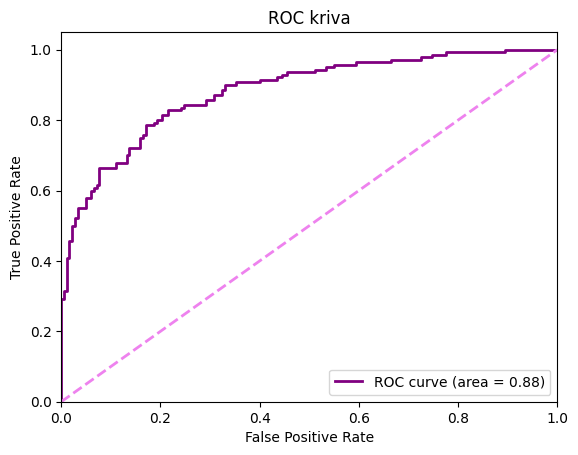

################ METRIKE ZA MODEL Logistic Regression sa optimizacijom parametara ##################
#################################
Accuracy (Tačnost): 0.8012422360248447
#################################
Precision (Preciznost): 0.7602739726027398
#################################
Recall(odziv): 0.7928571428571428
###############################
F1 Score: 0.7762237762237763
ROC AUC: 0.8822998430141287
Confusion Matrix (matrica konfuzije):
[[147  35]
 [ 29 111]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.84      0.81      0.82       182
           1       0.76      0.79      0.78       140

    accuracy                           0.80       322
   macro avg       0.80      0.80      0.80       322
weighted avg       0.80      0.80      0.80       322




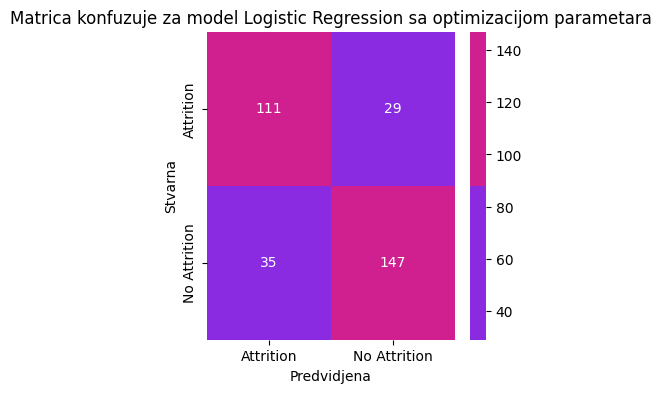

              precision    recall  f1-score   support

           0       0.84      0.81      0.82       182
           1       0.76      0.79      0.78       140

    accuracy                           0.80       322
   macro avg       0.80      0.80      0.80       322
weighted avg       0.80      0.80      0.80       322



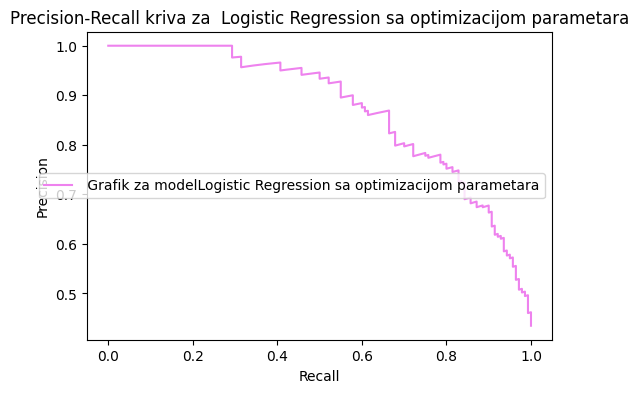

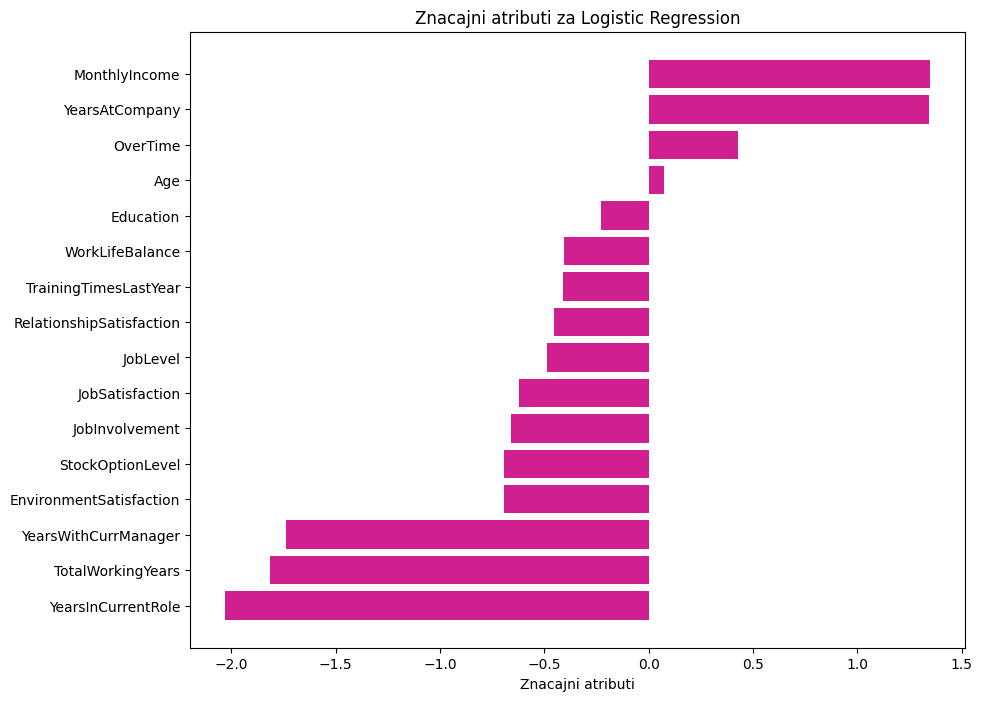

In [148]:
best_model_lr, best_params_lr, table_out_lr = treniranje_i_tjunovanje(LogisticRegression(), param_grids['Logistic Regression'], "Logistic Regression")

red_new= pd.DataFrame([{
"Ime modela": "Logistic Regression",
"Accuracy":table_out_lr[0],
"Precision":table_out_lr[1],
"Recall" :table_out_lr[2],
"F1-score" :table_out_lr[3],
"ROC_AUC_SCORE":table_out_lr[4],
"KrosvalidacioniScore":table_out_lr[5],
"FALSE NEGATIVI":table_out_lr[6],
"HIPERPARAMETRIZACIJA":table_out_lr[7],
"NAJBOLJI PARAMETRI":table_out_lr[8],
"NAJZNACAJNIJI ATRIBUTI":table_out_lr[9]
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)

In [149]:
REZULTATI_TABELA

,Ime modela,Accuracy,Precision,Recall,F1-score,ROC_AUC_SCORE,KrosvalidacioniScore,FALSE NEGATIVI,HIPERPARAMETRIZACIJA,NAJBOLJI PARAMETRI,NAJZNACAJNIJI ATRIBUTI
0,Logisticka regresija,0.798137,0.755102,0.792857,0.773519,0.881672,0.889855,29,NO,NONE,"[YearsInCurrentRole, YearsWithCurrManager, Tot..."
1,Drvo odlucivanja,0.813665,0.763158,0.828571,0.794521,0.815385,0.785576,24,NO,NONE,"[JobLevel, YearsInCurrentRole, YearsAtCompany]"
2,Random Forest,0.885093,0.865248,0.871429,0.868327,0.943250,0.945672,18,NO,NONE,"[OverTime, JobLevel, WorkLifeBalance]"
3,Gradient Boosting,0.850932,0.815068,0.850000,0.832168,0.928885,0.926648,21,NO,NONE,"[Age, JobLevel, OverTime]"
4,Ada Boost,0.829193,0.789116,0.828571,0.808362,0.907476,0.904184,24,NO,NONE,"[JobLevel, StockOptionLevel, Education]"
5,Bagging,0.866460,0.870229,0.814286,0.841328,0.912873,0.914960,26,NO,NONE,[]
6,XGB,0.866460,0.825503,0.878571,0.851211,0.955455,0.944500,17,NO,NONE,"[TotalWorkingYears, Age, MonthlyIncome]"
7,LGBM Classifier,0.891304,0.867133,0.885714,0.876325,0.954317,0.943262,16,NO,NONE,"[JobLevel, OverTime, StockOptionLevel]"
8,Cat Boost,0.875776,0.842466,0.878571,0.860140,0.946429,0.946233,17,NO,NONE,"[JobLevel, YearsAtCompany, Education]"
9,Naive Bayes,0.714286,0.631868,0.821429,0.714286,0.837088,0.832406,25,NO,NONE,[]


Treniranje modela Decision Tree nakon optimizacije parametara 
Krosvalidacioni scopre:  84.45%
ROC_AUC Score :  82.12%


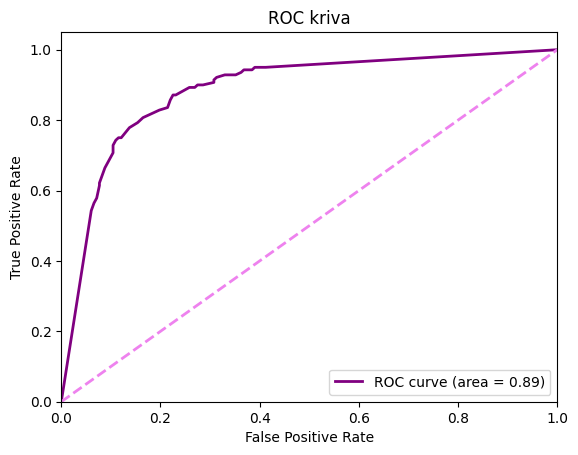

################ METRIKE ZA MODEL Decision Tree sa optimizacijom parametara ##################
#################################
Accuracy (Tačnost): 0.8229813664596274
#################################
Precision (Preciznost): 0.7902097902097902
#################################
Recall(odziv): 0.8071428571428572
###############################
F1 Score: 0.7985865724381626
ROC AUC: 0.8853610675039245
Confusion Matrix (matrica konfuzije):
[[152  30]
 [ 27 113]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.85      0.84      0.84       182
           1       0.79      0.81      0.80       140

    accuracy                           0.82       322
   macro avg       0.82      0.82      0.82       322
weighted avg       0.82      0.82      0.82       322




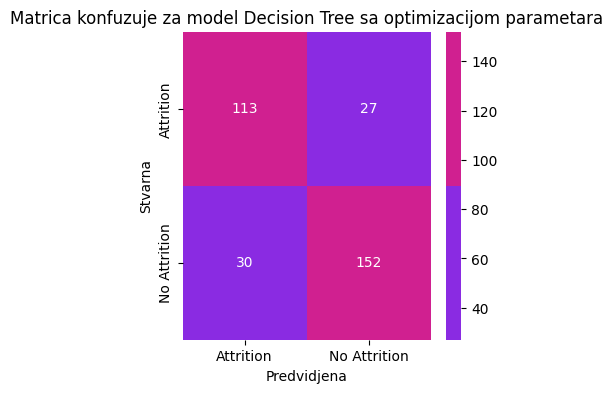

              precision    recall  f1-score   support

           0       0.85      0.84      0.84       182
           1       0.79      0.81      0.80       140

    accuracy                           0.82       322
   macro avg       0.82      0.82      0.82       322
weighted avg       0.82      0.82      0.82       322



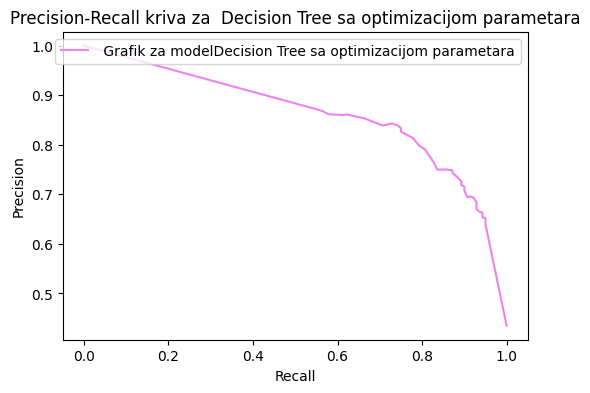

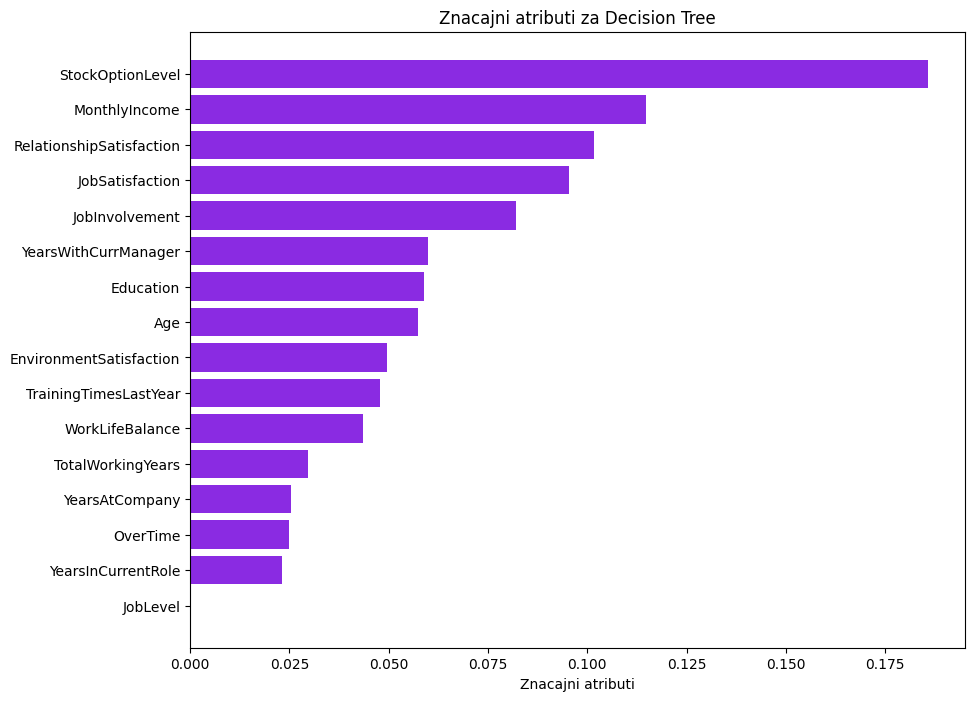

In [150]:
best_model_dt, best_params_dt, table_out_dt = treniranje_i_tjunovanje(DecisionTreeClassifier(), param_grids['Decision Tree'], "Decision Tree")
red_new= pd.DataFrame([{
"Ime modela": "Decision Tree",
"Accuracy":table_out_dt[0],
"Precision":table_out_dt[1],
"Recall" :table_out_dt[2],
"F1-score" :table_out_dt[3],
"ROC_AUC_SCORE":table_out_dt[4],
"KrosvalidacioniScore":table_out_dt[5],
"FALSE NEGATIVI":table_out_dt[6],
"HIPERPARAMETRIZACIJA":table_out_dt[7],
"NAJBOLJI PARAMETRI":table_out_dt[8],
"NAJZNACAJNIJI ATRIBUTI":table_out_dt[9]
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)



Treniranje modela Random Forest nakon optimizacije parametara 
Krosvalidacioni scopre:  94.63%
ROC_AUC Score :  88.79%


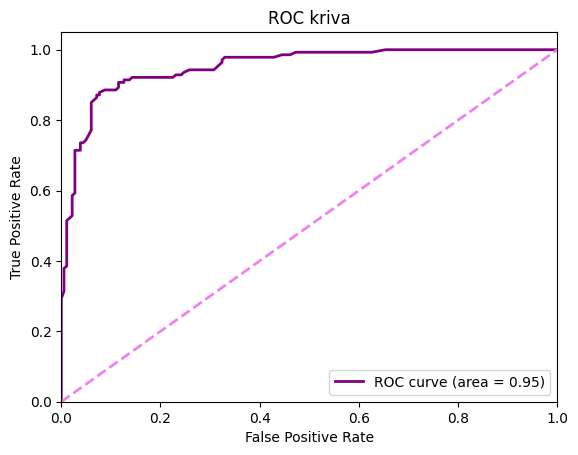

################ METRIKE ZA MODEL Random Forest sa optimizacijom parametara ##################
#################################
Accuracy (Tačnost): 0.8881987577639752
#################################
Precision (Preciznost): 0.8611111111111112
#################################
Recall(odziv): 0.8857142857142857
###############################
F1 Score: 0.8732394366197184
ROC AUC: 0.9510596546310832
Confusion Matrix (matrica konfuzije):
[[162  20]
 [ 16 124]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.91      0.89      0.90       182
           1       0.86      0.89      0.87       140

    accuracy                           0.89       322
   macro avg       0.89      0.89      0.89       322
weighted avg       0.89      0.89      0.89       322




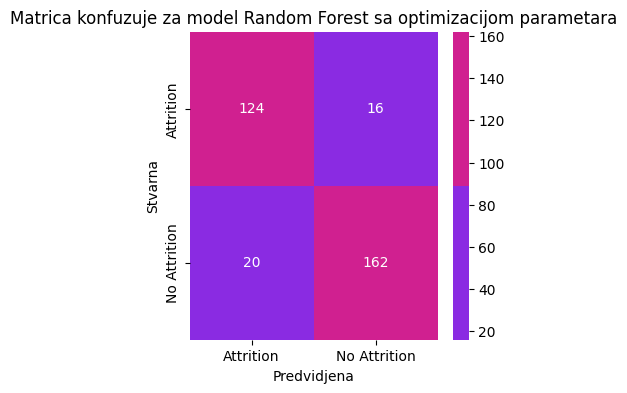

              precision    recall  f1-score   support

           0       0.91      0.89      0.90       182
           1       0.86      0.89      0.87       140

    accuracy                           0.89       322
   macro avg       0.89      0.89      0.89       322
weighted avg       0.89      0.89      0.89       322



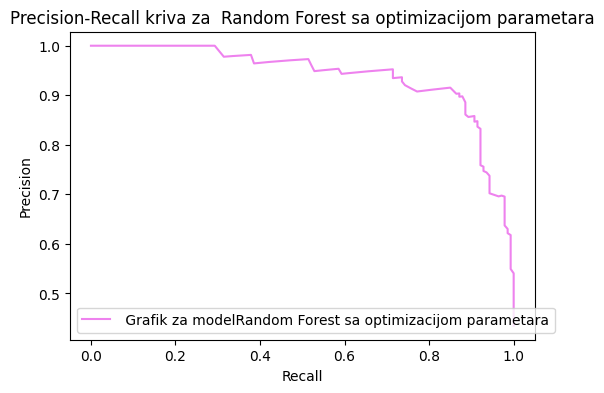

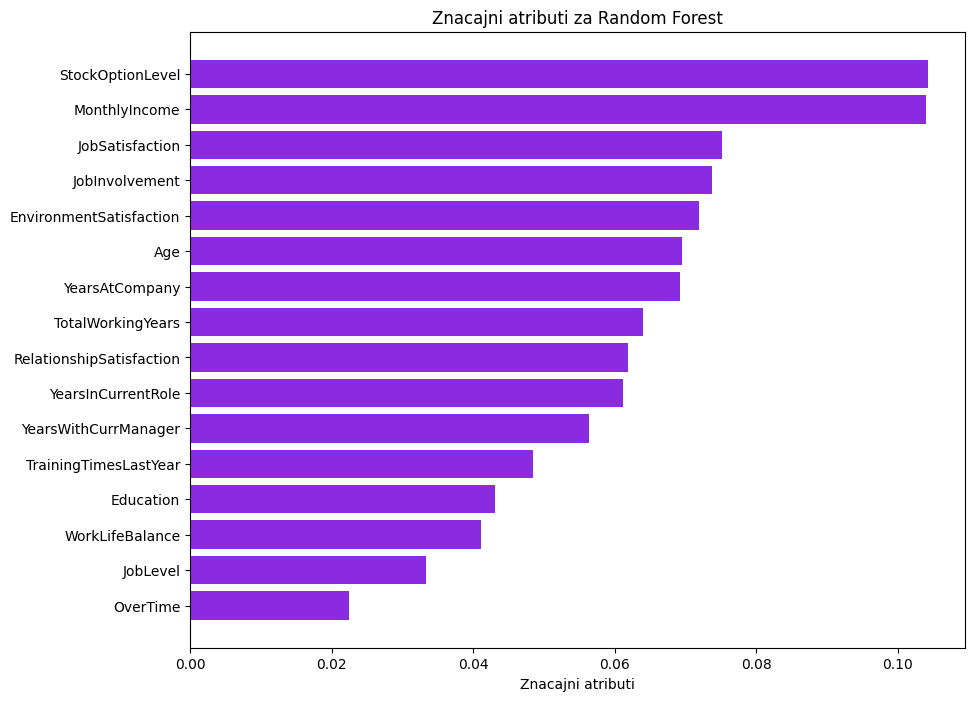

In [151]:
best_model_rf, best_params_rf, table_out_rf = treniranje_i_tjunovanje(RandomForestClassifier(), param_grids['Random Forest'], "Random Forest")

red_new= pd.DataFrame([{
"Ime modela": "Random Forest",
"Accuracy":table_out_rf[0],
"Precision":table_out_rf[1],
"Recall" :table_out_rf[2],
"F1-score" :table_out_rf[3],
"ROC_AUC_SCORE":table_out_rf[4],
"KrosvalidacioniScore":table_out_rf[5],
"FALSE NEGATIVI":table_out_rf[6],
"HIPERPARAMETRIZACIJA":table_out_rf[7],
"NAJBOLJI PARAMETRI":table_out_rf[8],
"NAJZNACAJNIJI ATRIBUTI":table_out_rf[9]
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)


Treniranje modela Gradient Boosting nakon optimizacije parametara 
Krosvalidacioni scopre:  95.07%
ROC_AUC Score :  88.87%


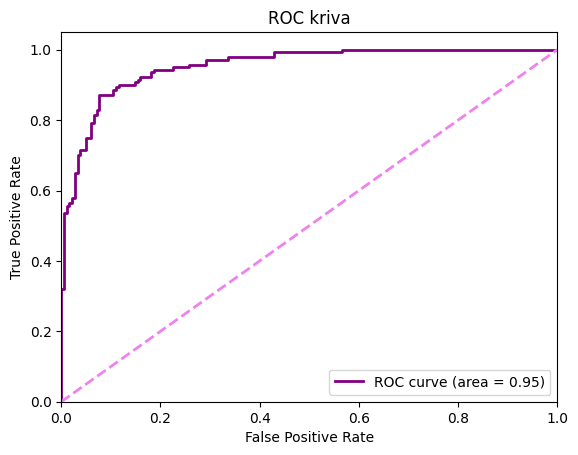

################ METRIKE ZA MODEL Gradient Boosting sa optimizacijom parametara ##################
#################################
Accuracy (Tačnost): 0.8881987577639752
#################################
Precision (Preciznost): 0.8561643835616438
#################################
Recall(odziv): 0.8928571428571429
###############################
F1 Score: 0.8741258741258742
ROC AUC: 0.953414442700157
Confusion Matrix (matrica konfuzije):
[[161  21]
 [ 15 125]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.91      0.88      0.90       182
           1       0.86      0.89      0.87       140

    accuracy                           0.89       322
   macro avg       0.89      0.89      0.89       322
weighted avg       0.89      0.89      0.89       322




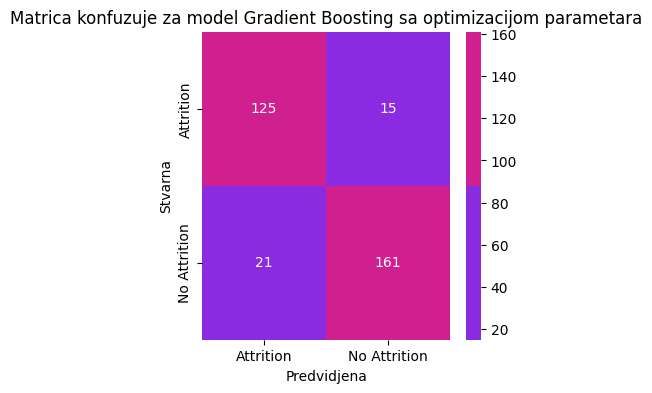

              precision    recall  f1-score   support

           0       0.91      0.88      0.90       182
           1       0.86      0.89      0.87       140

    accuracy                           0.89       322
   macro avg       0.89      0.89      0.89       322
weighted avg       0.89      0.89      0.89       322



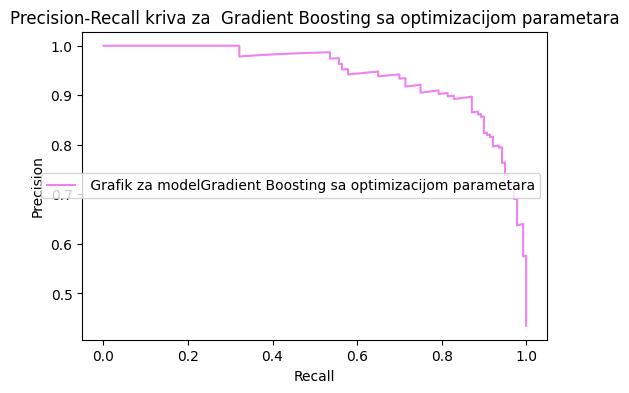

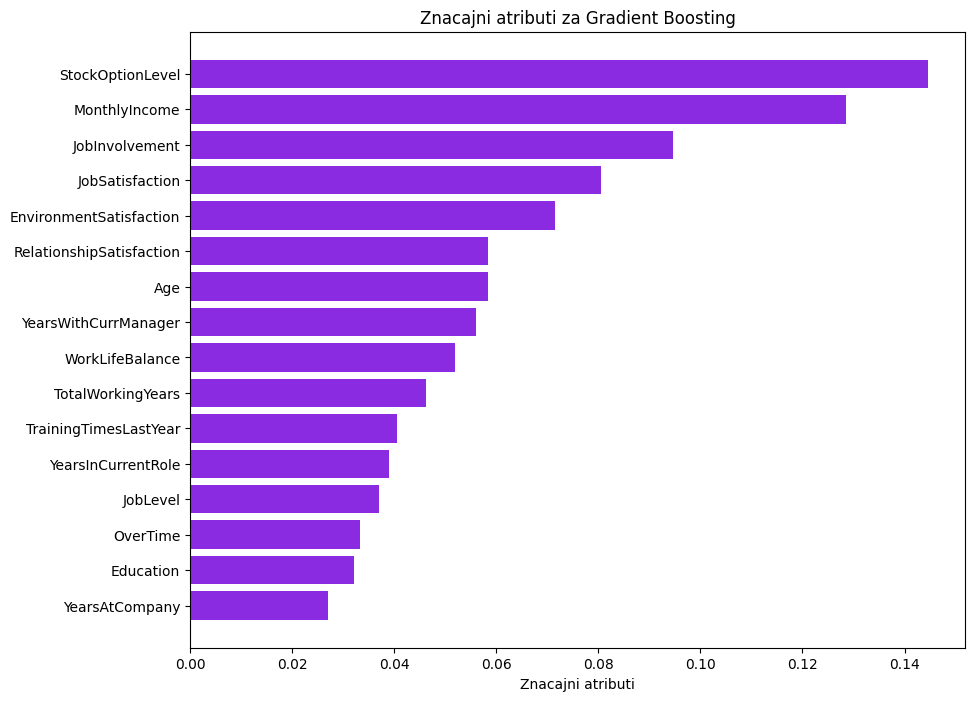

In [123]:
best_model_gb,best_params_gb, table_out_gb = treniranje_i_tjunovanje(GradientBoostingClassifier(), param_grids['Gradient Boosting'], "Gradient Boosting")

red_new= pd.DataFrame([{
"Ime modela": "Gradient Boosting",
"Accuracy":table_out_gb[0],
"Precision":table_out_gb[1],
"Recall" :table_out_gb[2],
"F1-score" :table_out_gb[3],
"ROC_AUC_SCORE":table_out_gb[4],
"KrosvalidacioniScore":table_out_gb[5],
"FALSE NEGATIVI":table_out_gb[6],
"HIPERPARAMETRIZACIJA":table_out_gb[7],
"NAJBOLJI PARAMETRI":table_out_gb[8],
"NAJZNACAJNIJI ATRIBUTI":table_out_gb[9]
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)

Treniranje modela AdaBoost nakon optimizacije parametara 
Krosvalidacioni scopre:  90.88%
ROC_AUC Score :  82.47%


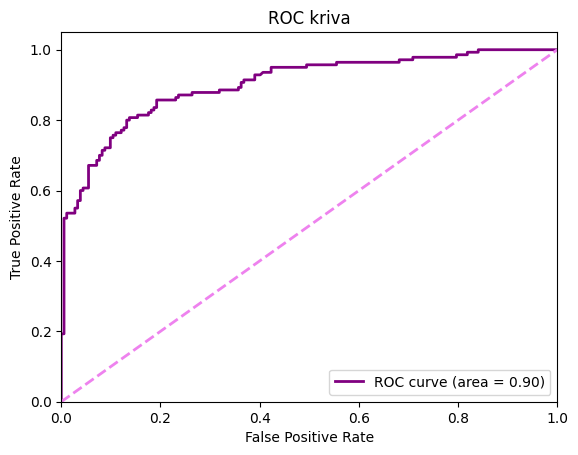

################ METRIKE ZA MODEL AdaBoost sa optimizacijom parametara ##################
#################################
Accuracy (Tačnost): 0.8260869565217391
#################################
Precision (Preciznost): 0.7916666666666666
#################################
Recall(odziv): 0.8142857142857143
###############################
F1 Score: 0.8028169014084506
ROC AUC: 0.9017072213500785
Confusion Matrix (matrica konfuzije):
[[152  30]
 [ 26 114]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.85      0.84      0.84       182
           1       0.79      0.81      0.80       140

    accuracy                           0.83       322
   macro avg       0.82      0.82      0.82       322
weighted avg       0.83      0.83      0.83       322




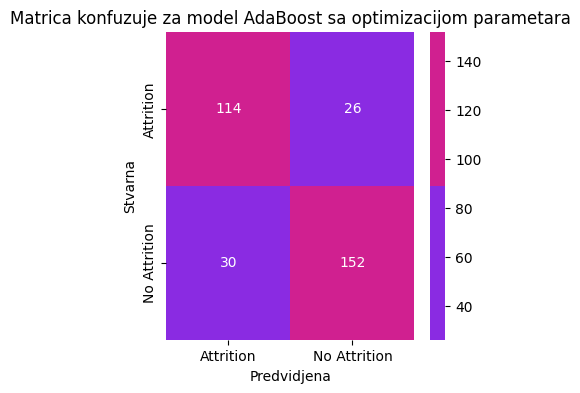

              precision    recall  f1-score   support

           0       0.85      0.84      0.84       182
           1       0.79      0.81      0.80       140

    accuracy                           0.83       322
   macro avg       0.82      0.82      0.82       322
weighted avg       0.83      0.83      0.83       322



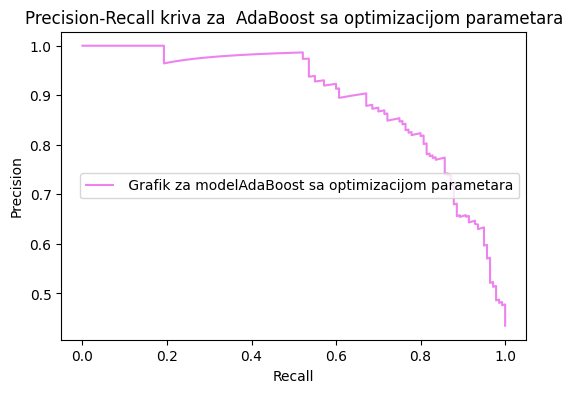

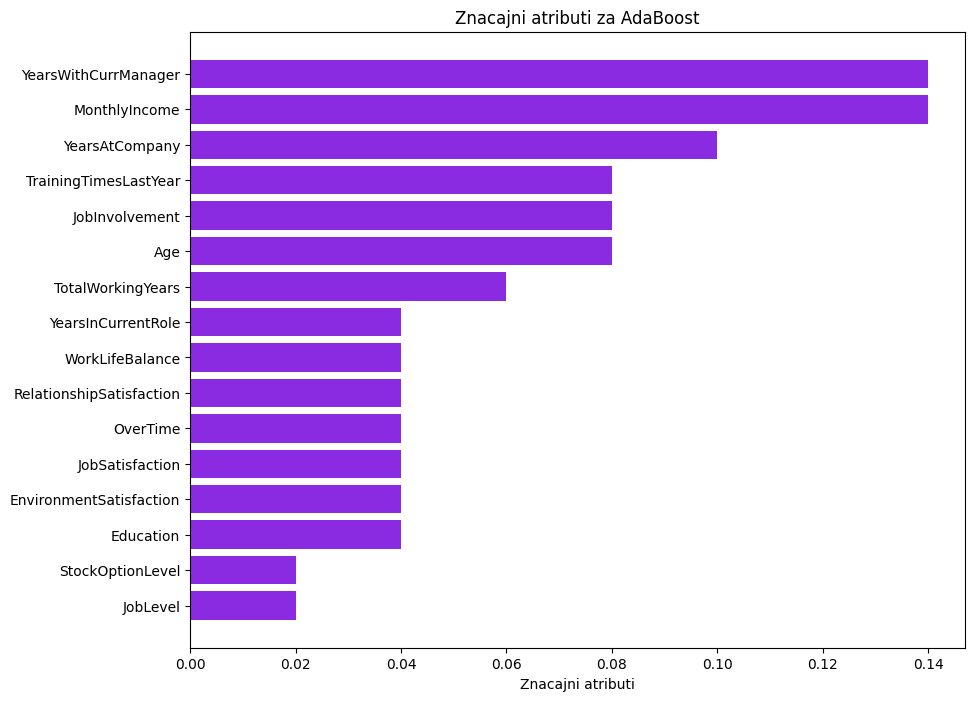

In [124]:
best_model_ab,best_params_ab, table_out_ab = treniranje_i_tjunovanje(AdaBoostClassifier(), param_grids['AdaBoost'], "AdaBoost")

red_new= pd.DataFrame([{
"Ime modela": "Ada Boost",
"Accuracy":table_out_ab[0],
"Precision":table_out_ab[1],
"Recall" :table_out_ab[2],
"F1-score" :table_out_ab[3],
"ROC_AUC_SCORE":table_out_ab[4],
"KrosvalidacioniScore":table_out_ab[5],
"FALSE NEGATIVI":table_out_ab[6],
"HIPERPARAMETRIZACIJA":table_out_ab[7],
"NAJBOLJI PARAMETRI":table_out_ab[8],
"NAJZNACAJNIJI ATRIBUTI":table_out_ab[9]
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)

Treniranje modela Bagging nakon optimizacije parametara 
Krosvalidacioni scopre:  94.77%
ROC_AUC Score :  87.69%


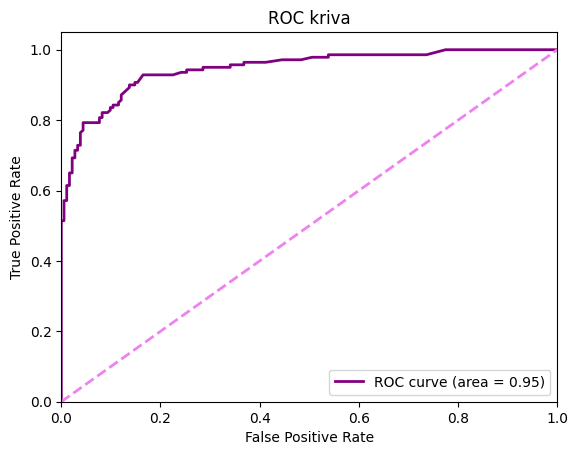

################ METRIKE ZA MODEL Bagging sa optimizacijom parametara ##################
#################################
Accuracy (Tačnost): 0.8757763975155279
#################################
Precision (Preciznost): 0.8378378378378378
#################################
Recall(odziv): 0.8857142857142857
###############################
F1 Score: 0.8611111111111112
ROC AUC: 0.9461734693877552
Confusion Matrix (matrica konfuzije):
[[158  24]
 [ 16 124]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.91      0.87      0.89       182
           1       0.84      0.89      0.86       140

    accuracy                           0.88       322
   macro avg       0.87      0.88      0.87       322
weighted avg       0.88      0.88      0.88       322




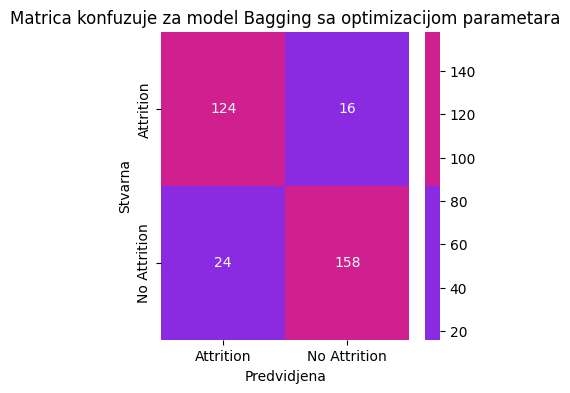

              precision    recall  f1-score   support

           0       0.91      0.87      0.89       182
           1       0.84      0.89      0.86       140

    accuracy                           0.88       322
   macro avg       0.87      0.88      0.87       322
weighted avg       0.88      0.88      0.88       322



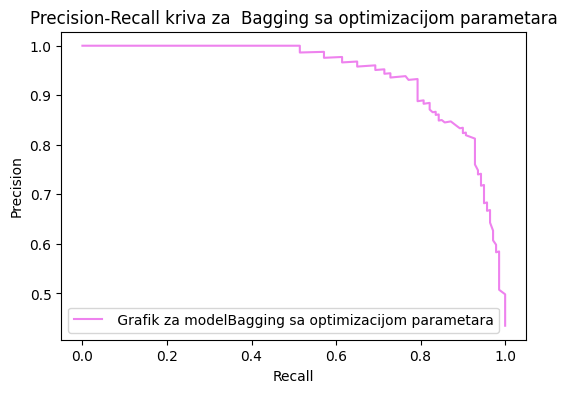

In [125]:
best_model_bg, best_params_bg, table_out_bg = treniranje_i_tjunovanje(BaggingClassifier(), param_grids['Bagging'], "Bagging")
red_new= pd.DataFrame([{
"Ime modela": "Bagging",
"Accuracy":table_out_bg[0],
"Precision":table_out_bg[1],
"Recall" :table_out_bg[2],
"F1-score" :table_out_bg[3],
"ROC_AUC_SCORE":table_out_bg[4],
"KrosvalidacioniScore":table_out_bg[5],
"FALSE NEGATIVI":table_out_bg[6],
"HIPERPARAMETRIZACIJA":table_out_bg[7],
"NAJBOLJI PARAMETRI":table_out_bg[8],
"NAJZNACAJNIJI ATRIBUTI":table_out_bg[9]
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)

Treniranje modela XGBoost nakon optimizacije parametara 
Krosvalidacioni scopre:  94.66%
ROC_AUC Score :  88.52%


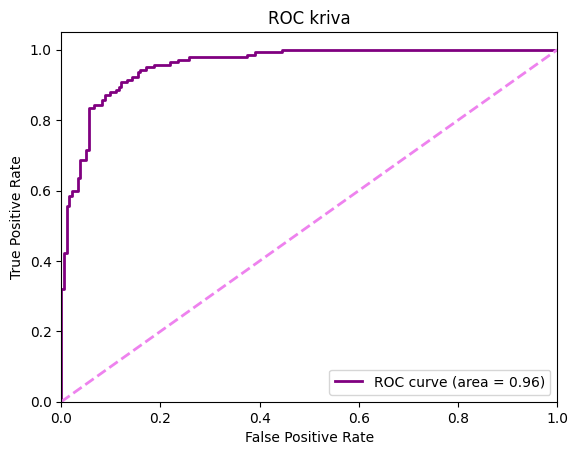

################ METRIKE ZA MODEL XGBoost sa optimizacijom parametara ##################
#################################
Accuracy (Tačnost): 0.8850931677018633
#################################
Precision (Preciznost): 0.8551724137931035
#################################
Recall(odziv): 0.8857142857142857
###############################
F1 Score: 0.8701754385964913
ROC AUC: 0.9574568288854003
Confusion Matrix (matrica konfuzije):
[[161  21]
 [ 16 124]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.91      0.88      0.90       182
           1       0.86      0.89      0.87       140

    accuracy                           0.89       322
   macro avg       0.88      0.89      0.88       322
weighted avg       0.89      0.89      0.89       322




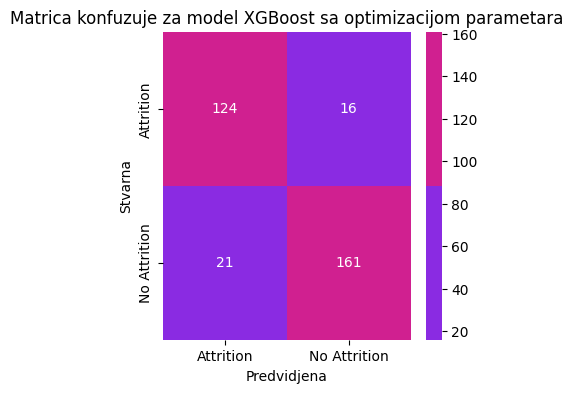

              precision    recall  f1-score   support

           0       0.91      0.88      0.90       182
           1       0.86      0.89      0.87       140

    accuracy                           0.89       322
   macro avg       0.88      0.89      0.88       322
weighted avg       0.89      0.89      0.89       322



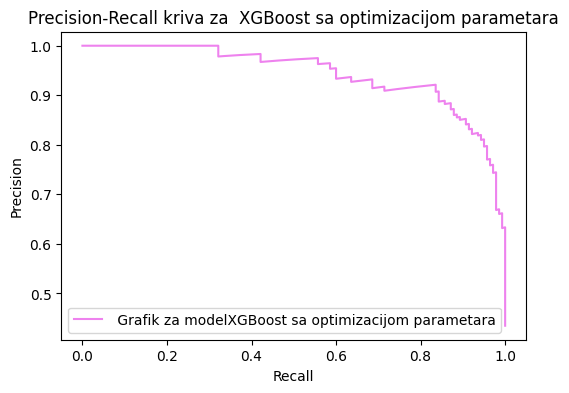

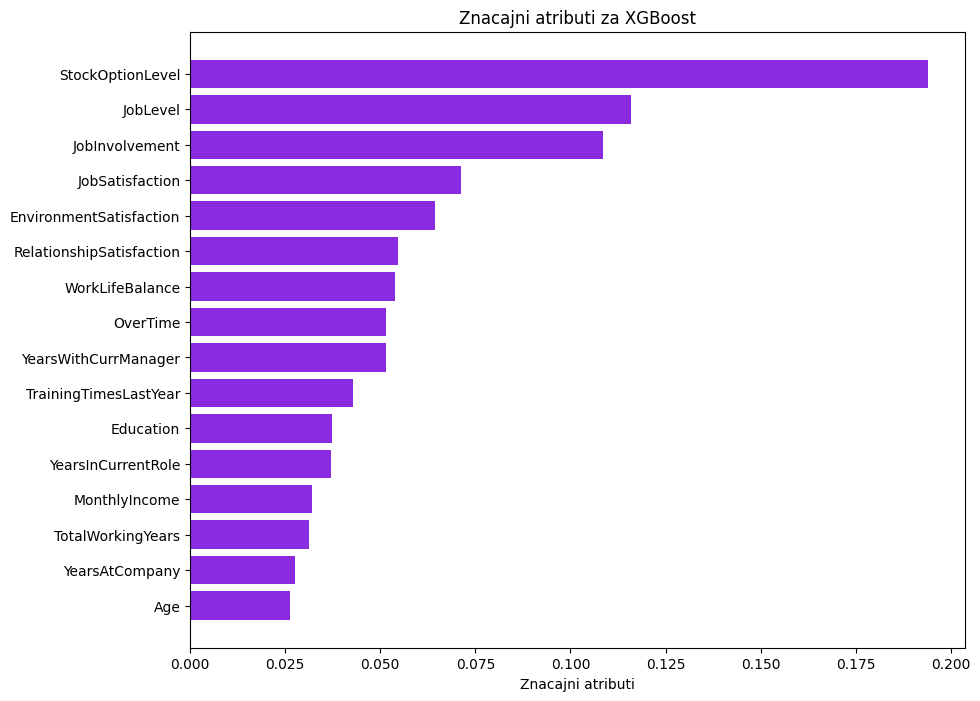

In [126]:
best_model_xgb, best_params_xgb, table_out_xgb = treniranje_i_tjunovanje(xgb.XGBClassifier(use_label_encoder=False, eval_metric='logloss'), param_grids['XGBoost'], "XGBoost")
red_new= pd.DataFrame([{
"Ime modela": "XGBoost",
"Accuracy":table_out_xgb[0],
"Precision":table_out_xgb[1],
"Recall" :table_out_xgb[2],
"F1-score" :table_out_xgb[3],
"ROC_AUC_SCORE":table_out_xgb[4],
"KrosvalidacioniScore":table_out_xgb[5],
"FALSE NEGATIVI":table_out_xgb[6],
"HIPERPARAMETRIZACIJA":table_out_xgb[7],
"NAJBOLJI PARAMETRI":table_out_xgb[8],
"NAJZNACAJNIJI ATRIBUTI":table_out_xgb[9]
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)




Treniranje modela LightGBM nakon optimizacije parametara 
[LightGBM] [Info] Number of positive: 676, number of negative: 780
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000174 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 441
[LightGBM] [Info] Number of data points in the train set: 1456, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.464286 -> initscore=-0.143101
[LightGBM] [Info] Start training from score -0.143101
[LightGBM] [Info] Number of positive: 675, number of negative: 781
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000486 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 439
[LightGBM] [Info] Number of data points in the train set: 1456, number of used features: 16
[LightGBM] [Info] [binary:BoostFromS

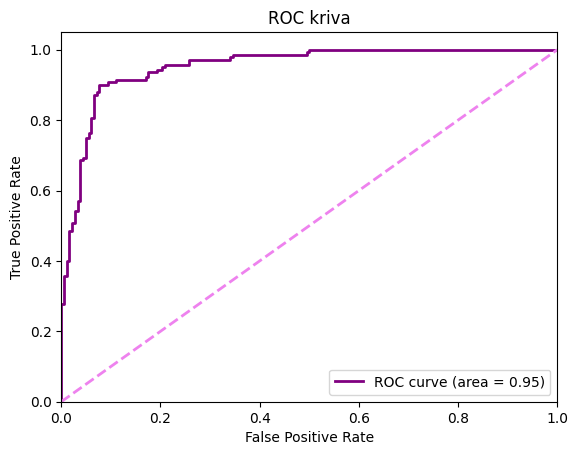

################ METRIKE ZA MODEL LightGBM sa optimizacijom parametara ##################
#################################
Accuracy (Tačnost): 0.906832298136646
#################################
Precision (Preciznost): 0.8819444444444444
#################################
Recall(odziv): 0.9071428571428571
###############################
F1 Score: 0.8943661971830985
ROC AUC: 0.9527864992150707
Confusion Matrix (matrica konfuzije):
[[165  17]
 [ 13 127]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.93      0.91      0.92       182
           1       0.88      0.91      0.89       140

    accuracy                           0.91       322
   macro avg       0.90      0.91      0.91       322
weighted avg       0.91      0.91      0.91       322




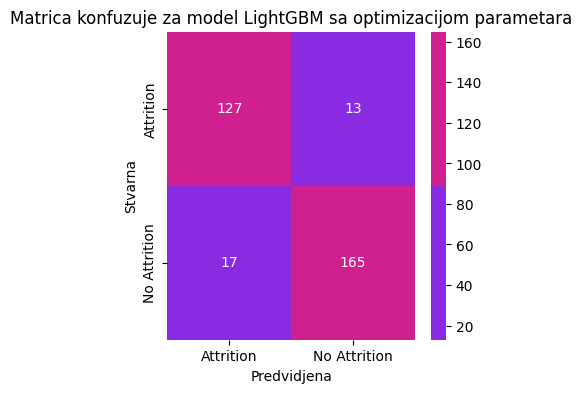

              precision    recall  f1-score   support

           0       0.93      0.91      0.92       182
           1       0.88      0.91      0.89       140

    accuracy                           0.91       322
   macro avg       0.90      0.91      0.91       322
weighted avg       0.91      0.91      0.91       322



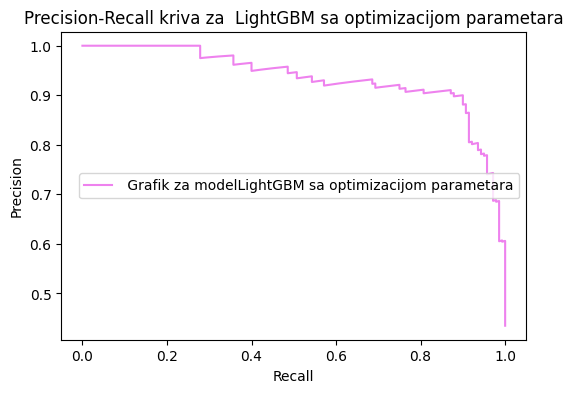

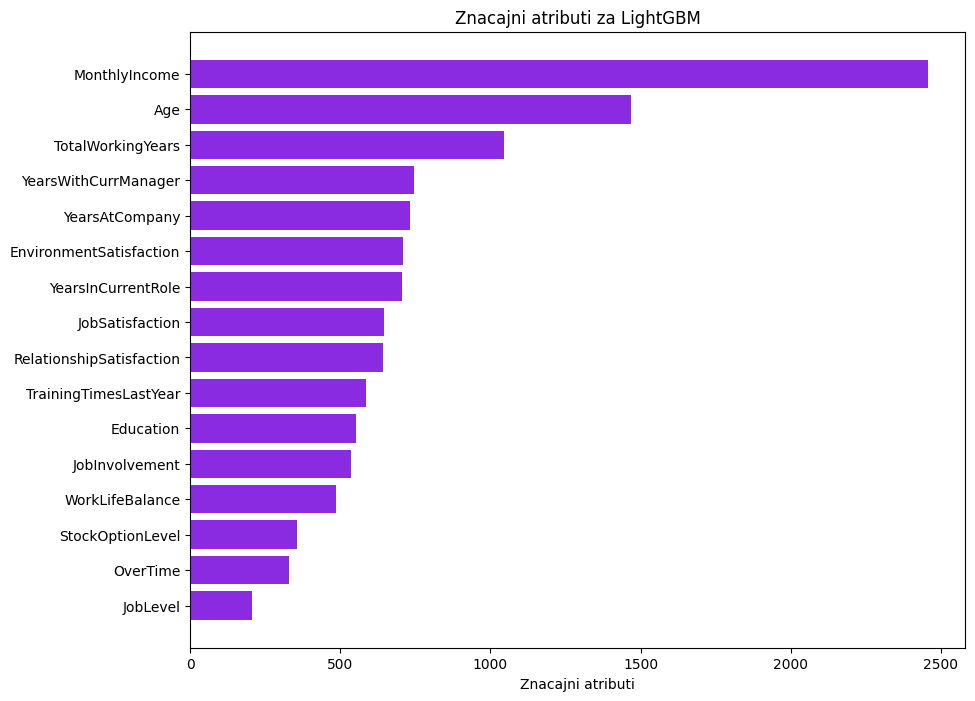

In [127]:
best_model_lgb,best_params_lgb, table_out_lgb = treniranje_i_tjunovanje(lgb.LGBMClassifier(), param_grids['LightGBM'], "LightGBM")
red_new= pd.DataFrame([{
"Ime modela": "LightGBM",
"Accuracy":table_out_lgb[0],
"Precision":table_out_lgb[1],
"Recall" :table_out_lgb[2],
"F1-score" :table_out_lgb[3],
"ROC_AUC_SCORE":table_out_lgb[4],
"KrosvalidacioniScore":table_out_lgb[5],
"FALSE NEGATIVI":table_out_lgb[6],
"HIPERPARAMETRIZACIJA":table_out_lgb[7],
"NAJBOLJI PARAMETRI":table_out_lgb[8],
"NAJZNACAJNIJI ATRIBUTI":table_out_lgb[9]
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)

Treniranje modela CatBoost nakon optimizacije parametara 
Krosvalidacioni scopre:  95.15%
ROC_AUC Score :  88.16%


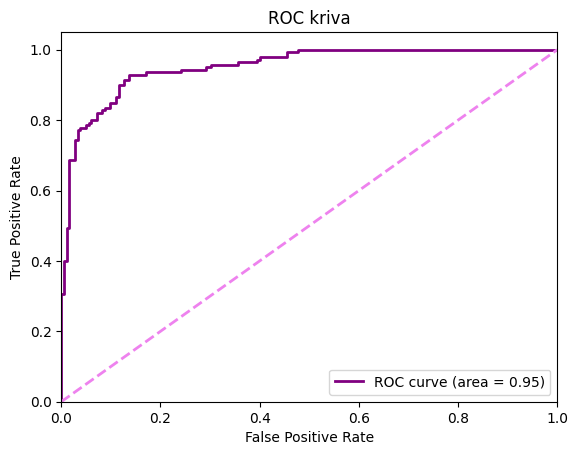

################ METRIKE ZA MODEL CatBoost sa optimizacijom parametara ##################
#################################
Accuracy (Tačnost): 0.8819875776397516
#################################
Precision (Preciznost): 0.8541666666666666
#################################
Recall(odziv): 0.8785714285714286
###############################
F1 Score: 0.8661971830985916
ROC AUC: 0.9523547880690737
Confusion Matrix (matrica konfuzije):
[[161  21]
 [ 17 123]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.90      0.88      0.89       182
           1       0.85      0.88      0.87       140

    accuracy                           0.88       322
   macro avg       0.88      0.88      0.88       322
weighted avg       0.88      0.88      0.88       322




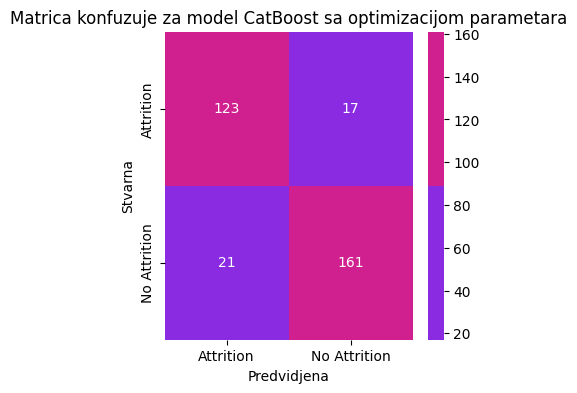

              precision    recall  f1-score   support

           0       0.90      0.88      0.89       182
           1       0.85      0.88      0.87       140

    accuracy                           0.88       322
   macro avg       0.88      0.88      0.88       322
weighted avg       0.88      0.88      0.88       322



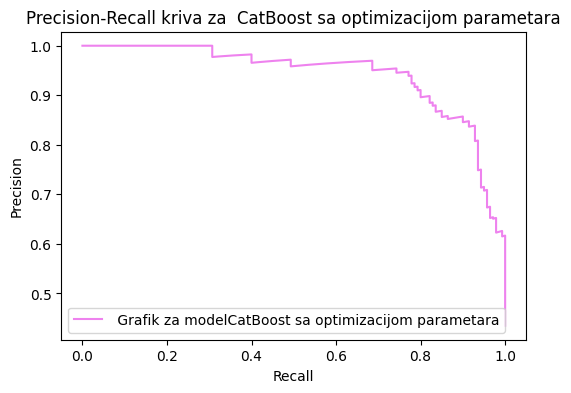

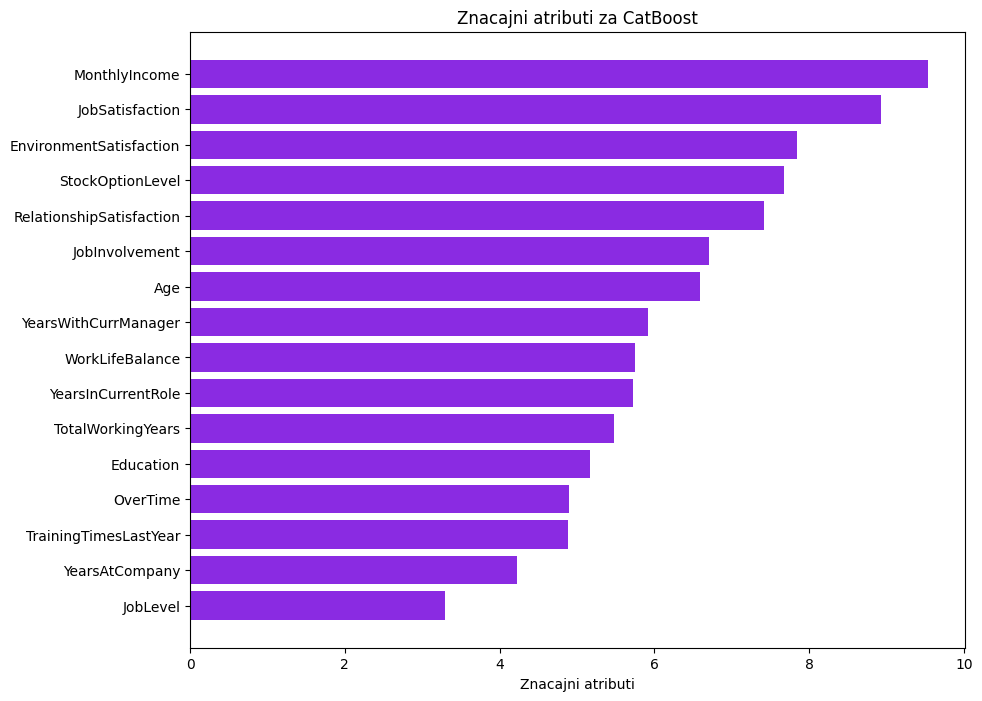

In [128]:
best_model_cb, best_params_cb, table_out_cb = treniranje_i_tjunovanje(cb.CatBoostClassifier(silent=True), param_grids['CatBoost'], "CatBoost")
red_new= pd.DataFrame([{
"Ime modela": "CatBoost",
"Accuracy":table_out_lr[0],
"Precision":table_out_lr[1],
"Recall" :table_out_lr[2],
"F1-score" :table_out_lr[3],
"ROC_AUC_SCORE":table_out_lr[4],
"KrosvalidacioniScore":table_out_lr[5],
"FALSE NEGATIVI":table_out_lr[6],
"HIPERPARAMETRIZACIJA":table_out_lr[7],
"NAJBOLJI PARAMETRI":table_out_lr[8],
"NAJZNACAJNIJI ATRIBUTI":table_out_lr[9]
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)


In [129]:
#best_params_svc = treniranje_i_tjunovanje(SVC(probability=True), param_grids['SVC'], "Support Vector Machine")

Treniranje modela Naive Bayes nakon optimizacije parametara 
Krosvalidacioni scopre:  83.45%
ROC_AUC Score :  71.76%


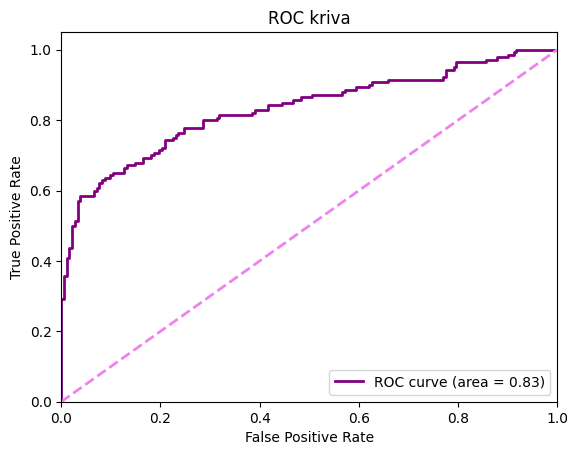

################ METRIKE ZA MODEL Naive Bayes sa optimizacijom parametara ##################
#################################
Accuracy (Tačnost): 0.7049689440993789
#################################
Precision (Preciznost): 0.6229508196721312
#################################
Recall(odziv): 0.8142857142857143
###############################
F1 Score: 0.7058823529411765
ROC AUC: 0.8318288854003139
Confusion Matrix (matrica konfuzije):
[[113  69]
 [ 26 114]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.81      0.62      0.70       182
           1       0.62      0.81      0.71       140

    accuracy                           0.70       322
   macro avg       0.72      0.72      0.70       322
weighted avg       0.73      0.70      0.70       322




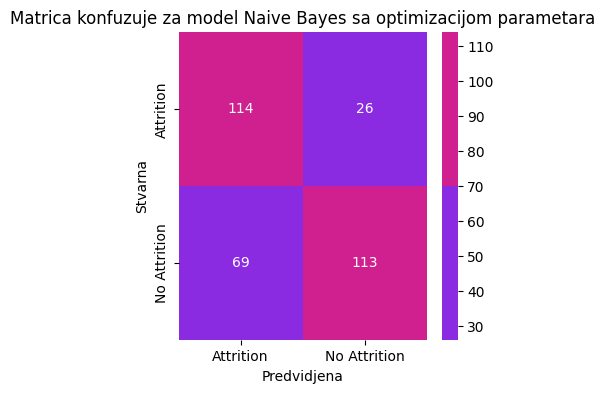

              precision    recall  f1-score   support

           0       0.81      0.62      0.70       182
           1       0.62      0.81      0.71       140

    accuracy                           0.70       322
   macro avg       0.72      0.72      0.70       322
weighted avg       0.73      0.70      0.70       322



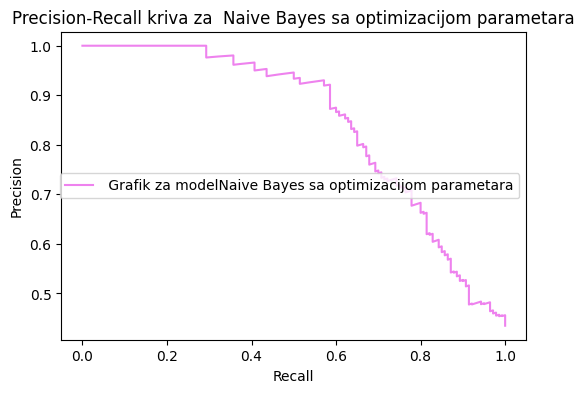

In [130]:
best_params_NB = treniranje_i_tjunovanje(GaussianNB(), param_grids['GaussianNB'], "Naive Bayes")

In [132]:
print("NAJBOLJI PARAMETRI ZA Logistic Regression:", best_params_lr)
print("NAJBOLJI PARAMETRI ZA  Decision Tree:", best_params_dt)
print("NAJBOLJI PARAMETRI ZA  Random Forest:", best_params_rf)
print("NAJBOLJI PARAMETRI ZA Gradient Boosting:", best_params_gb)
print("NAJBOLJI PARAMETRI ZA  AdaBoost:", best_params_ab)
print("NAJBOLJI PARAMETRI ZA  Bagging:", best_params_bg)
print("NAJBOLJI PARAMETRI ZA  XGBoost:", best_params_xgb)
print("NAJBOLJI PARAMETRI ZA  LightGBM:", best_params_lgb)
print("NAJBOLJI PARAMETRI ZA  CatBoost:", best_params_cb)
#print("NAJBOLJI PARAMETRI ZA  Support Vector Machine:", best_params_svc)
print("NAJBOLJI PARAMETRI ZA Naive Bayes:", best_params_NB)

NAJBOLJI PARAMETRI ZA Logistic Regression: {'C': 1, 'solver': 'lbfgs'}
NAJBOLJI PARAMETRI ZA  Decision Tree: {'max_depth': 20, 'min_samples_split': 10}
NAJBOLJI PARAMETRI ZA  Random Forest: {'max_depth': 30, 'min_samples_split': 2, 'n_estimators': 200}
NAJBOLJI PARAMETRI ZA Gradient Boosting: {'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 200}
NAJBOLJI PARAMETRI ZA  AdaBoost: {'learning_rate': 1, 'n_estimators': 50}
NAJBOLJI PARAMETRI ZA  Bagging: {'max_features': 0.5, 'max_samples': 1.0, 'n_estimators': 100}
NAJBOLJI PARAMETRI ZA  XGBoost: {'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 200}
NAJBOLJI PARAMETRI ZA  LightGBM: {'learning_rate': 0.1, 'n_estimators': 200, 'num_leaves': 62}
NAJBOLJI PARAMETRI ZA  CatBoost: {'depth': 7, 'iterations': 300, 'learning_rate': 0.1}
NAJBOLJI PARAMETRI ZA Naive Bayes: {'var_smoothing': 1e-09}


In [134]:
param_grids_new = {
    'Logistic Regression': {
        'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000],
        'solver': ['lbfgs', 'liblinear']
    },
    'Decision Tree': {
        'max_depth': [None, 10, 20, 30, 40, 50],
        'min_samples_split': [2, 5, 10, 20],
        'min_samples_leaf': [1, 2, 4]
    },
    'Random Forest': {
        'n_estimators': [50, 100, 200, 500,1000],
        'max_depth': [None, 10, 20, 30, 40],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4]
    },
    'Gradient Boosting': {
        'n_estimators': [50, 100, 200, 500,1000],
        'learning_rate': [0.01, 0.1, 0.2, 0.3],
        'max_depth': [3, 5, 7, 9]
    },
    'AdaBoost': {
        'n_estimators': [50, 100, 200, 500,1000],
        'learning_rate': [0.01, 0.1, 1, 1.5]
    },
    'Bagging': {
        'n_estimators': [10, 50, 100, 200,1000],
        'max_samples': [0.5, 1.0],
        'max_features': [0.5, 1.0]
    },
    'XGBoost': {
        'n_estimators': [50, 100, 200, 500,1000],
        'learning_rate': [0.01, 0.1, 0.2, 0.3],
        'max_depth': [3, 5, 7, 9]
    },
    'LightGBM': {
        'n_estimators': [50, 100, 200, 500],
        'learning_rate': [0.01, 0.1, 0.2, 0.3],
        'num_leaves': [31, 62, 127, 255]
    },
    'CatBoost': {
        'iterations': [100, 200, 300, 500],
        'learning_rate': [0.01, 0.1, 0.2, 0.3],
        'depth': [3, 5, 7, 9]
    },
    'Naive Bayes': {
        'var_smoothing': np.logspace(0, -9, num=100)
    }
}

Treniranje modela Logistic Regression nakon optimizacije parametara 
Krosvalidacioni scopre:  88.84%
ROC_AUC Score :  81.10%


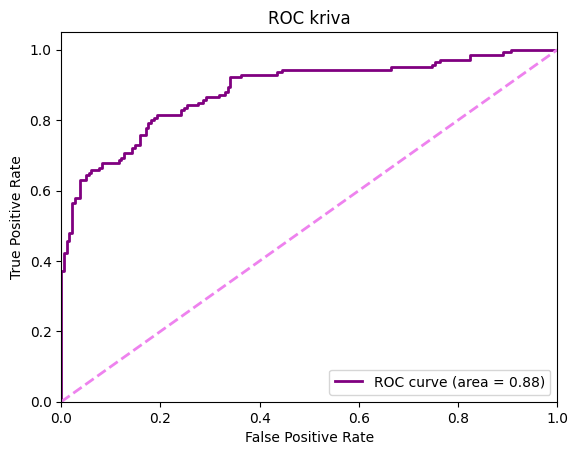

################ METRIKE ZA MODEL Logistic Regression sa optimizacijom parametara ##################
#################################
Accuracy (Tačnost): 0.8105590062111802
#################################
Precision (Preciznost): 0.7651006711409396
#################################
Recall(odziv): 0.8142857142857143
###############################
F1 Score: 0.7889273356401384
ROC AUC: 0.8835557299843014
Confusion Matrix (matrica konfuzije):
[[147  35]
 [ 26 114]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.85      0.81      0.83       182
           1       0.77      0.81      0.79       140

    accuracy                           0.81       322
   macro avg       0.81      0.81      0.81       322
weighted avg       0.81      0.81      0.81       322




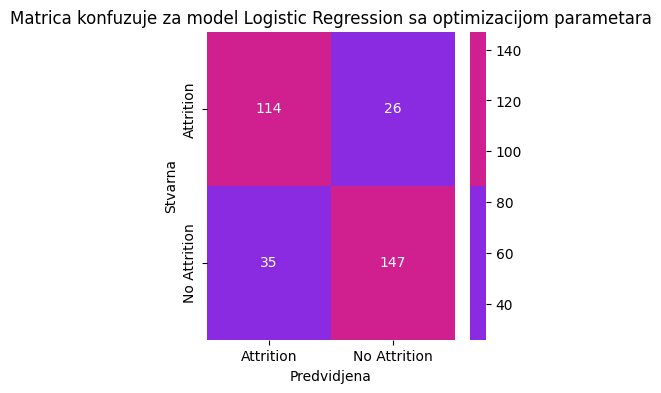

              precision    recall  f1-score   support

           0       0.85      0.81      0.83       182
           1       0.77      0.81      0.79       140

    accuracy                           0.81       322
   macro avg       0.81      0.81      0.81       322
weighted avg       0.81      0.81      0.81       322



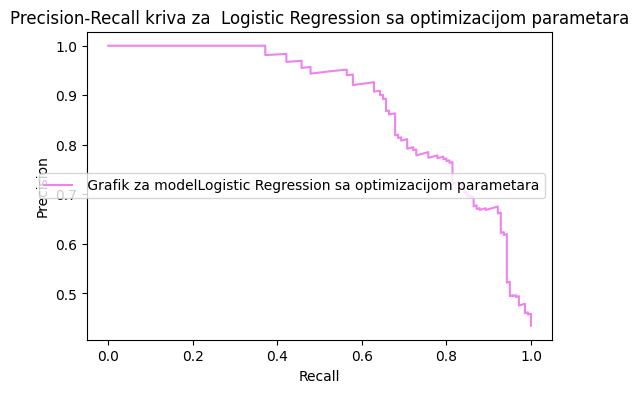

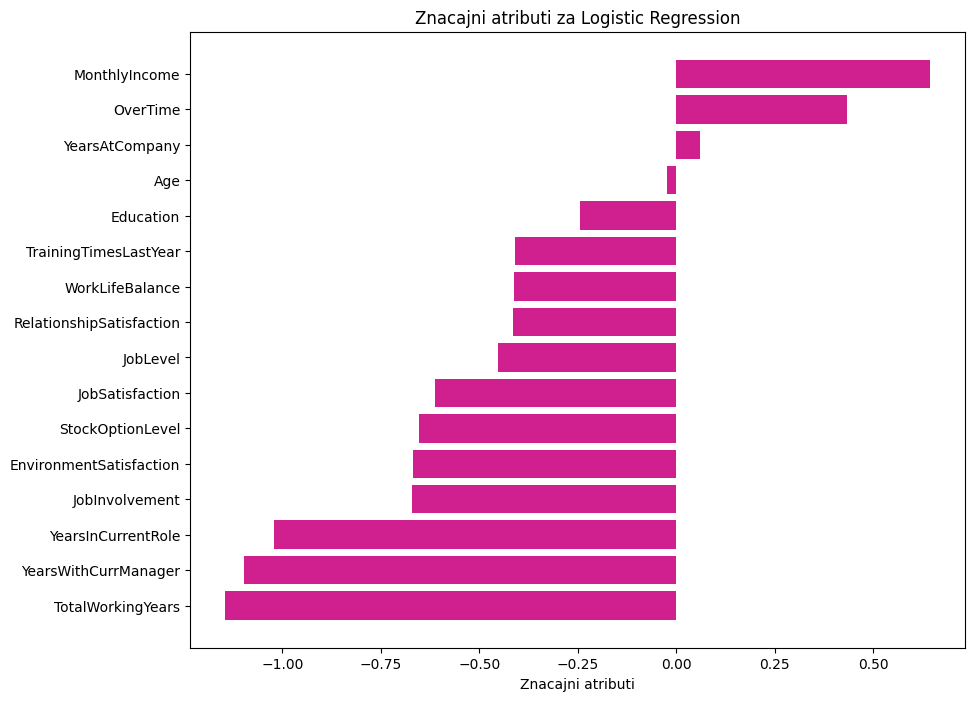

In [135]:
best_params_lr_new = treniranje_i_tjunovanje(LogisticRegression(), param_grids_new['Logistic Regression'], "Logistic Regression")

Treniranje modela Decision Tree nakon optimizacije parametara 
Krosvalidacioni scopre:  86.20%
ROC_AUC Score :  79.07%


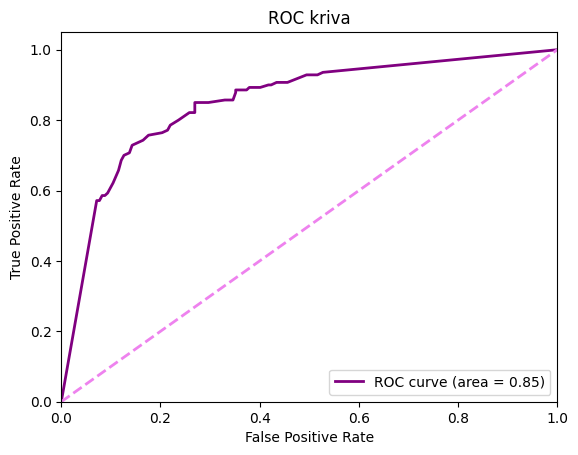

################ METRIKE ZA MODEL Decision Tree sa optimizacijom parametara ##################
#################################
Accuracy (Tačnost): 0.7950310559006211
#################################
Precision (Preciznost): 0.7681159420289855
#################################
Recall(odziv): 0.7571428571428571
###############################
F1 Score: 0.762589928057554
ROC AUC: 0.8512362637362637
Confusion Matrix (matrica konfuzije):
[[150  32]
 [ 34 106]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.82      0.82      0.82       182
           1       0.77      0.76      0.76       140

    accuracy                           0.80       322
   macro avg       0.79      0.79      0.79       322
weighted avg       0.79      0.80      0.79       322




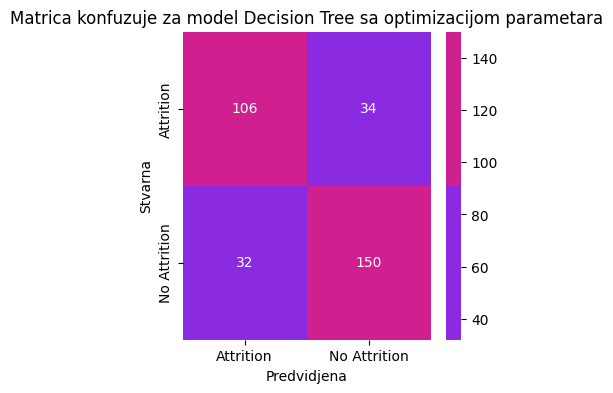

              precision    recall  f1-score   support

           0       0.82      0.82      0.82       182
           1       0.77      0.76      0.76       140

    accuracy                           0.80       322
   macro avg       0.79      0.79      0.79       322
weighted avg       0.79      0.80      0.79       322



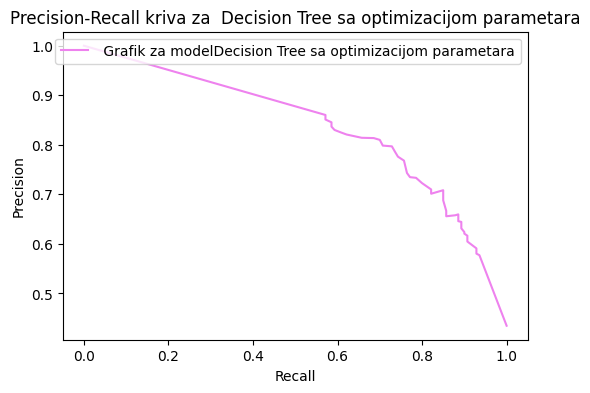

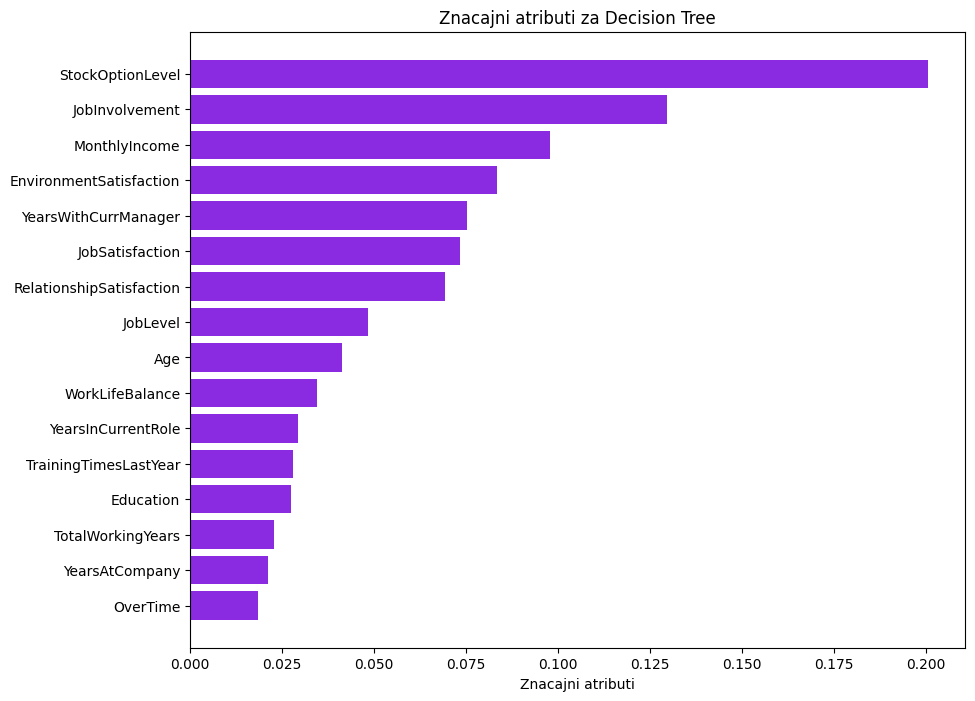

In [136]:
best_params_dt_new = treniranje_i_tjunovanje(DecisionTreeClassifier(), param_grids_new['Decision Tree'], "Decision Tree")

Treniranje modela Random Forest nakon optimizacije parametara 
Krosvalidacioni scopre:  94.26%
ROC_AUC Score :  88.63%


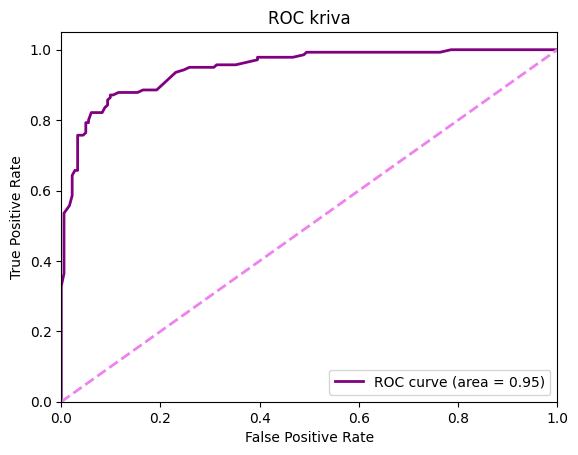

################ METRIKE ZA MODEL Random Forest sa optimizacijom parametara ##################
#################################
Accuracy (Tačnost): 0.8881987577639752
#################################
Precision (Preciznost): 0.8714285714285714
#################################
Recall(odziv): 0.8714285714285714
###############################
F1 Score: 0.8714285714285714
ROC AUC: 0.9464481946624804
Confusion Matrix (matrica konfuzije):
[[164  18]
 [ 18 122]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.90      0.90      0.90       182
           1       0.87      0.87      0.87       140

    accuracy                           0.89       322
   macro avg       0.89      0.89      0.89       322
weighted avg       0.89      0.89      0.89       322




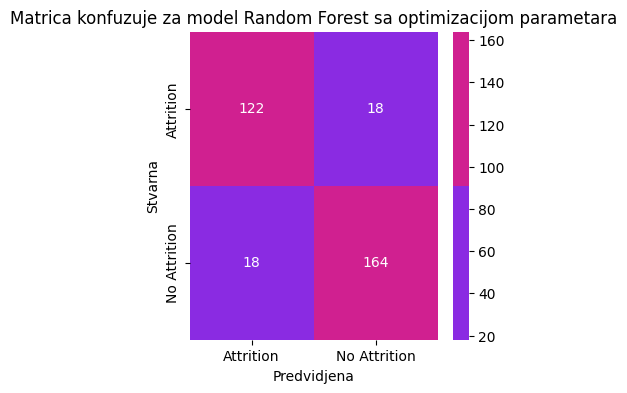

              precision    recall  f1-score   support

           0       0.90      0.90      0.90       182
           1       0.87      0.87      0.87       140

    accuracy                           0.89       322
   macro avg       0.89      0.89      0.89       322
weighted avg       0.89      0.89      0.89       322



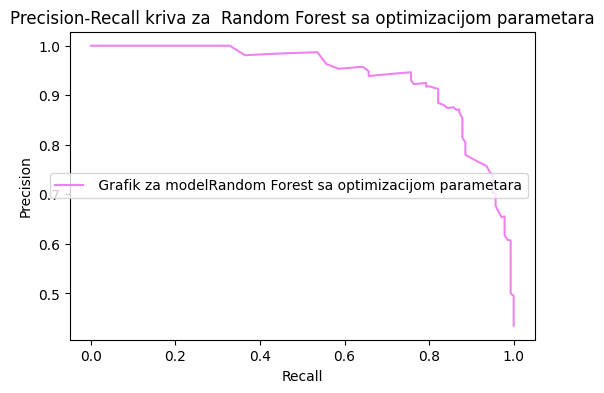

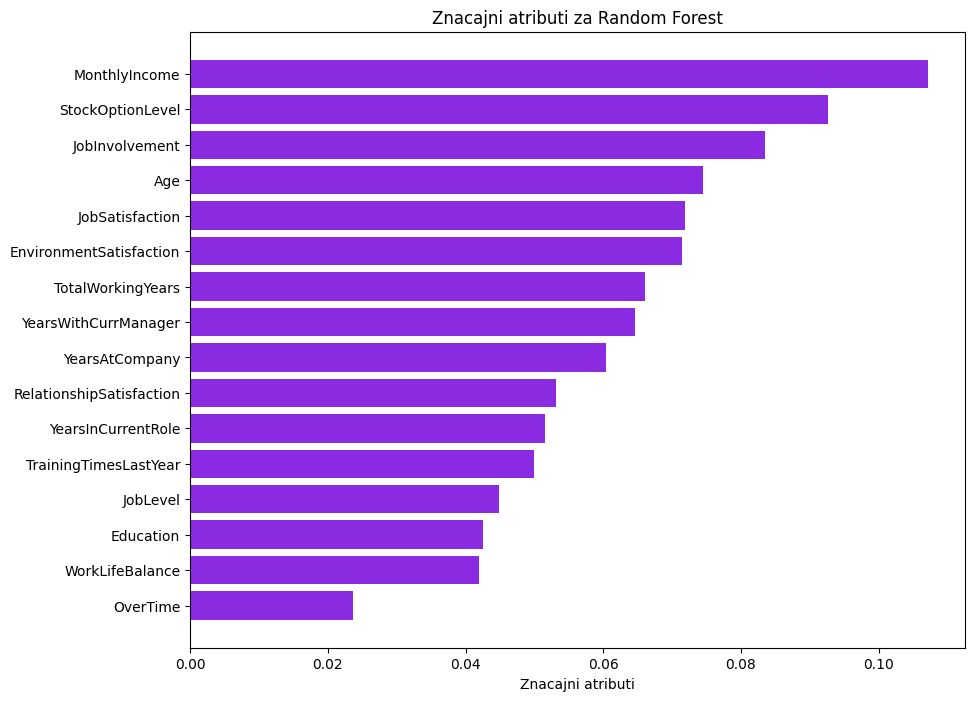

In [137]:
best_params_rf_new = treniranje_i_tjunovanje(RandomForestClassifier(), param_grids_new['Random Forest'], "Random Forest")

Treniranje modela Gradient Boosting nakon optimizacije parametara 
Krosvalidacioni scopre:  95.06%
ROC_AUC Score :  88.68%


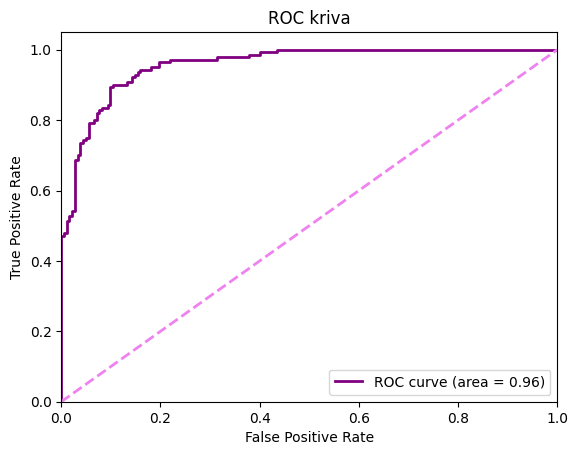

################ METRIKE ZA MODEL Gradient Boosting sa optimizacijom parametara ##################
#################################
Accuracy (Tačnost): 0.8850931677018633
#################################
Precision (Preciznost): 0.8456375838926175
#################################
Recall(odziv): 0.9
###############################
F1 Score: 0.8719723183391003
ROC AUC: 0.9578492935635793
Confusion Matrix (matrica konfuzije):
[[159  23]
 [ 14 126]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.92      0.87      0.90       182
           1       0.85      0.90      0.87       140

    accuracy                           0.89       322
   macro avg       0.88      0.89      0.88       322
weighted avg       0.89      0.89      0.89       322




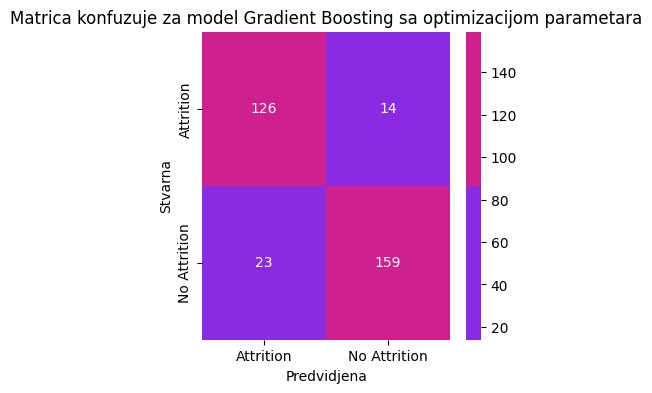

              precision    recall  f1-score   support

           0       0.92      0.87      0.90       182
           1       0.85      0.90      0.87       140

    accuracy                           0.89       322
   macro avg       0.88      0.89      0.88       322
weighted avg       0.89      0.89      0.89       322



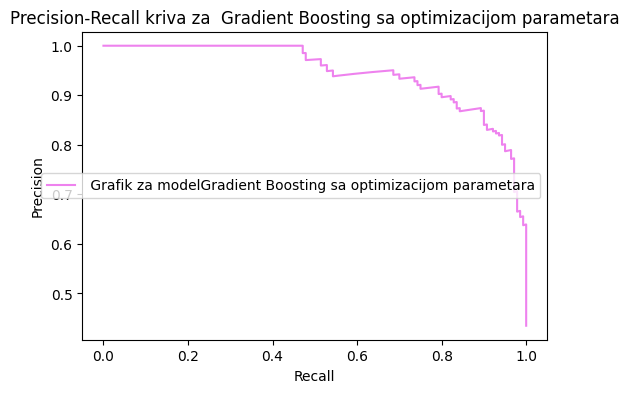

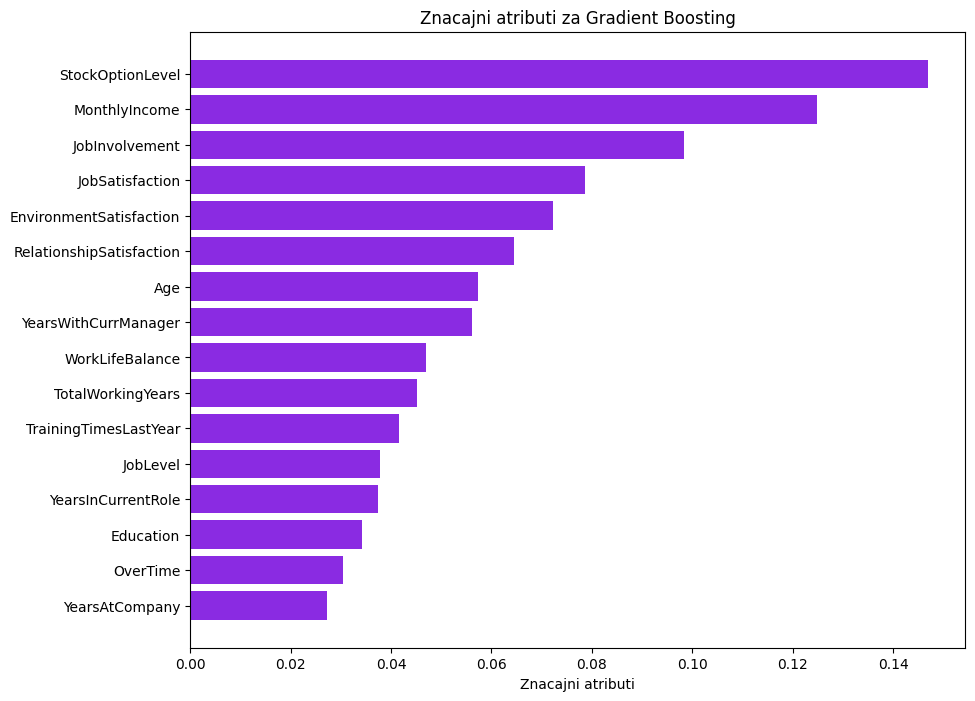

In [138]:
best_params_gb_new = treniranje_i_tjunovanje(GradientBoostingClassifier(), param_grids_new['Gradient Boosting'], "Gradient Boosting")

Treniranje modela AdaBoost nakon optimizacije parametara 
Krosvalidacioni scopre:  90.88%
ROC_AUC Score :  82.47%


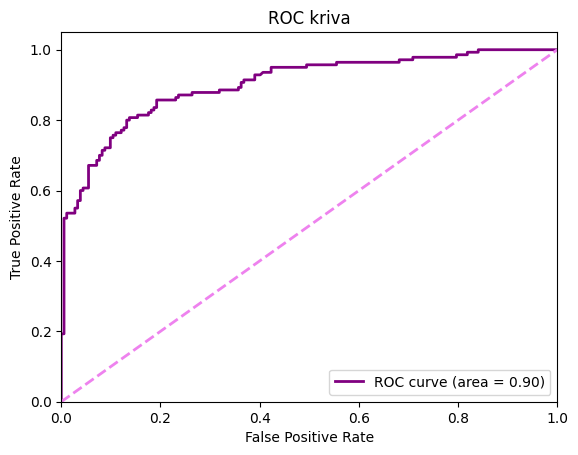

################ METRIKE ZA MODEL AdaBoost sa optimizacijom parametara ##################
#################################
Accuracy (Tačnost): 0.8260869565217391
#################################
Precision (Preciznost): 0.7916666666666666
#################################
Recall(odziv): 0.8142857142857143
###############################
F1 Score: 0.8028169014084506
ROC AUC: 0.9017072213500785
Confusion Matrix (matrica konfuzije):
[[152  30]
 [ 26 114]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.85      0.84      0.84       182
           1       0.79      0.81      0.80       140

    accuracy                           0.83       322
   macro avg       0.82      0.82      0.82       322
weighted avg       0.83      0.83      0.83       322




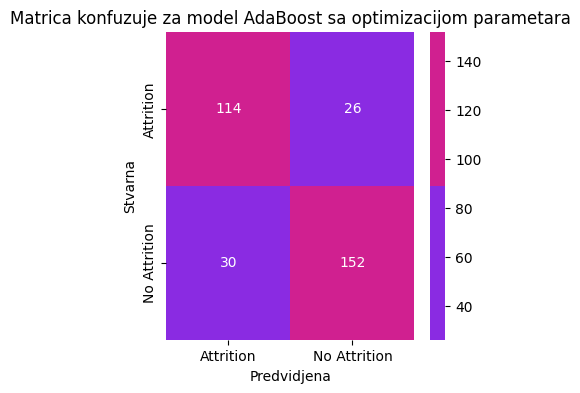

              precision    recall  f1-score   support

           0       0.85      0.84      0.84       182
           1       0.79      0.81      0.80       140

    accuracy                           0.83       322
   macro avg       0.82      0.82      0.82       322
weighted avg       0.83      0.83      0.83       322



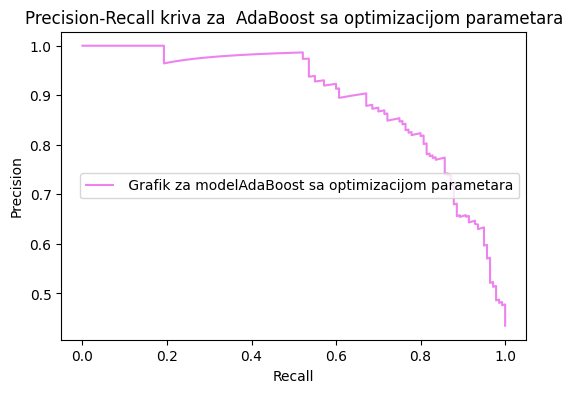

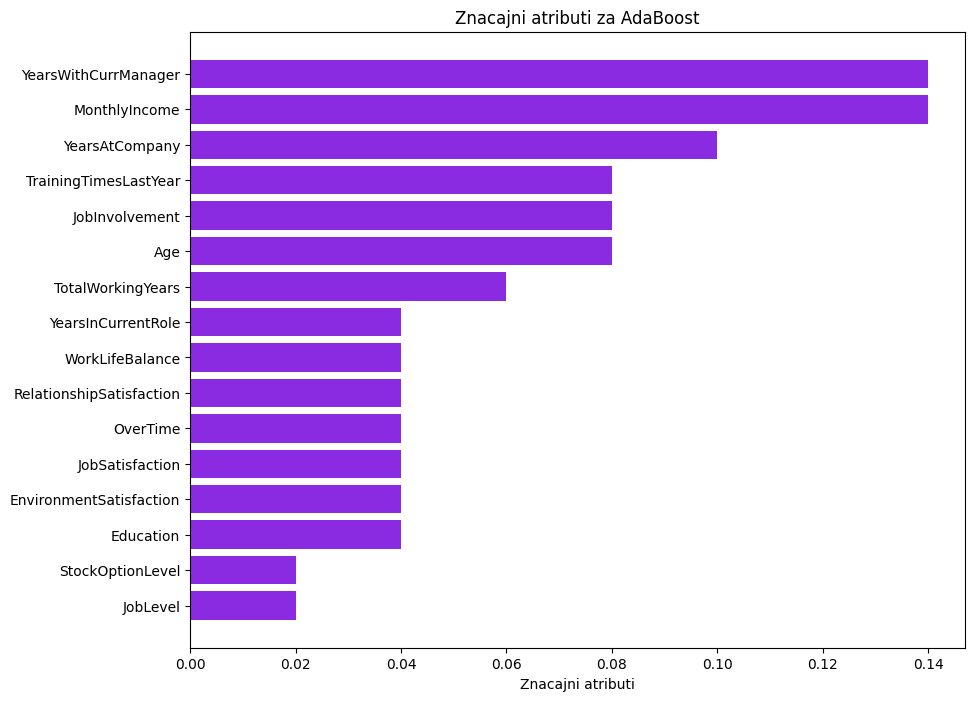

In [139]:
best_params_ab_new = treniranje_i_tjunovanje(AdaBoostClassifier(), param_grids_new['AdaBoost'], "AdaBoost")


Treniranje modela Bagging nakon optimizacije parametara 
Krosvalidacioni scopre:  95.04%
ROC_AUC Score :  87.72%


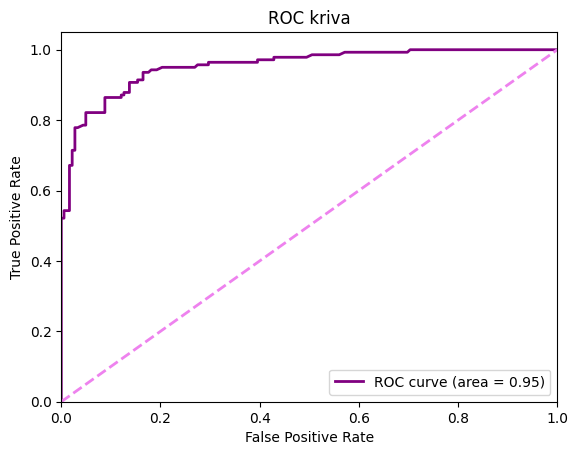

################ METRIKE ZA MODEL Bagging sa optimizacijom parametara ##################
#################################
Accuracy (Tačnost): 0.8788819875776398
#################################
Precision (Preciznost): 0.8581560283687943
#################################
Recall(odziv): 0.8642857142857143
###############################
F1 Score: 0.8612099644128114
ROC AUC: 0.9536695447409733
Confusion Matrix (matrica konfuzije):
[[162  20]
 [ 19 121]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.90      0.89      0.89       182
           1       0.86      0.86      0.86       140

    accuracy                           0.88       322
   macro avg       0.88      0.88      0.88       322
weighted avg       0.88      0.88      0.88       322




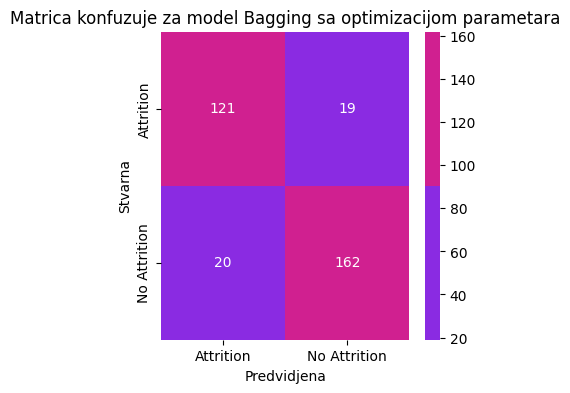

              precision    recall  f1-score   support

           0       0.90      0.89      0.89       182
           1       0.86      0.86      0.86       140

    accuracy                           0.88       322
   macro avg       0.88      0.88      0.88       322
weighted avg       0.88      0.88      0.88       322



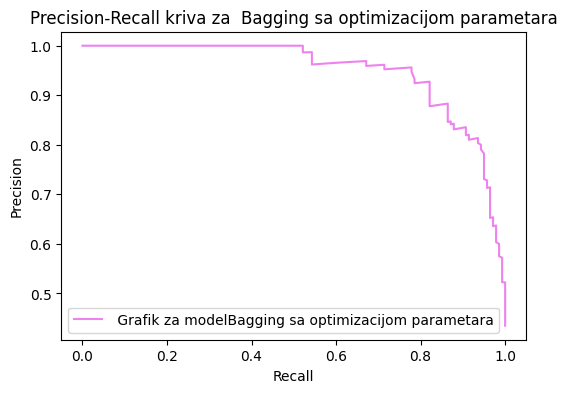

In [140]:
best_params_bg_new = treniranje_i_tjunovanje(BaggingClassifier(), param_grids_new['Bagging'], "Bagging")

Treniranje modela XGBoost nakon optimizacije parametara 
Krosvalidacioni scopre:  94.67%
ROC_AUC Score :  87.88%


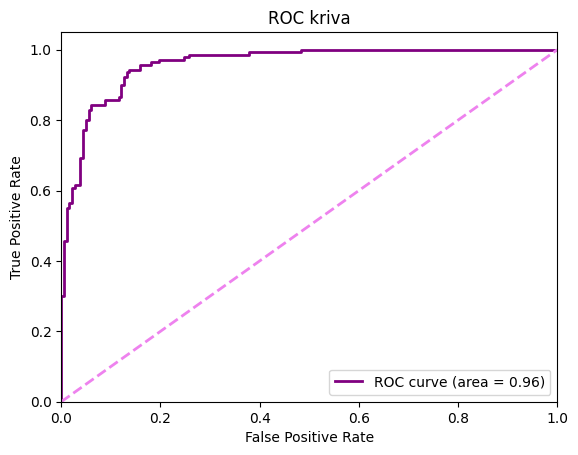

################ METRIKE ZA MODEL XGBoost sa optimizacijom parametara ##################
#################################
Accuracy (Tačnost): 0.8788819875776398
#################################
Precision (Preciznost): 0.8482758620689655
#################################
Recall(odziv): 0.8785714285714286
###############################
F1 Score: 0.863157894736842
ROC AUC: 0.9596938775510204
Confusion Matrix (matrica konfuzije):
[[160  22]
 [ 17 123]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.90      0.88      0.89       182
           1       0.85      0.88      0.86       140

    accuracy                           0.88       322
   macro avg       0.88      0.88      0.88       322
weighted avg       0.88      0.88      0.88       322




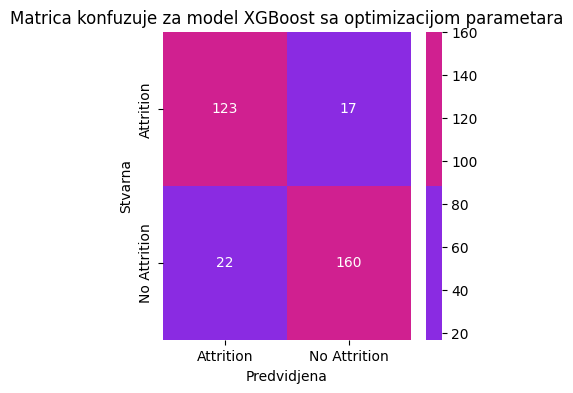

              precision    recall  f1-score   support

           0       0.90      0.88      0.89       182
           1       0.85      0.88      0.86       140

    accuracy                           0.88       322
   macro avg       0.88      0.88      0.88       322
weighted avg       0.88      0.88      0.88       322



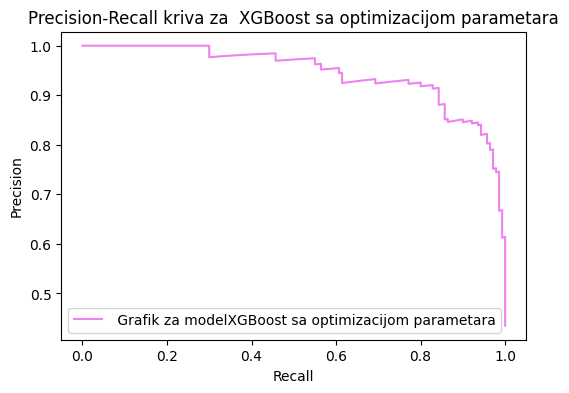

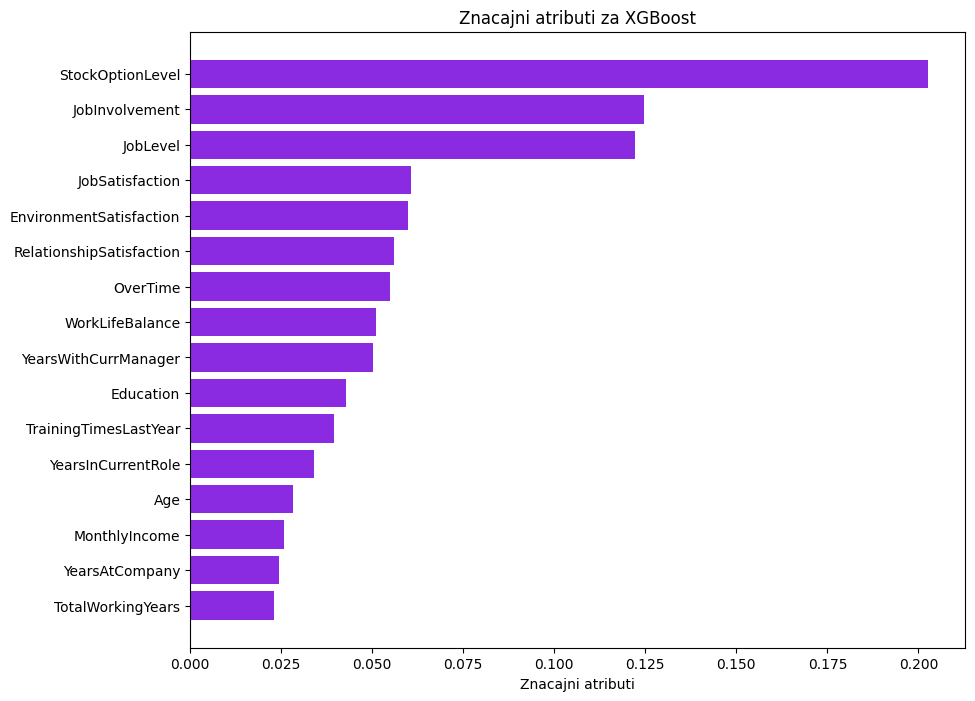

In [141]:
best_params_xgb_new = treniranje_i_tjunovanje(xgb.XGBClassifier(eval_metric='logloss'), param_grids_new['XGBoost'], "XGBoost")


Treniranje modela LightGBM nakon optimizacije parametara 
[LightGBM] [Info] Number of positive: 676, number of negative: 780
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000161 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 441
[LightGBM] [Info] Number of data points in the train set: 1456, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.464286 -> initscore=-0.143101
[LightGBM] [Info] Start training from score -0.143101
[LightGBM] [Info] Number of positive: 675, number of negative: 781
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000077 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 439
[LightGBM] [Info] Number of data points in the train set: 1456, number of used features: 16
[LightGBM] [Info] [binary:BoostFromS

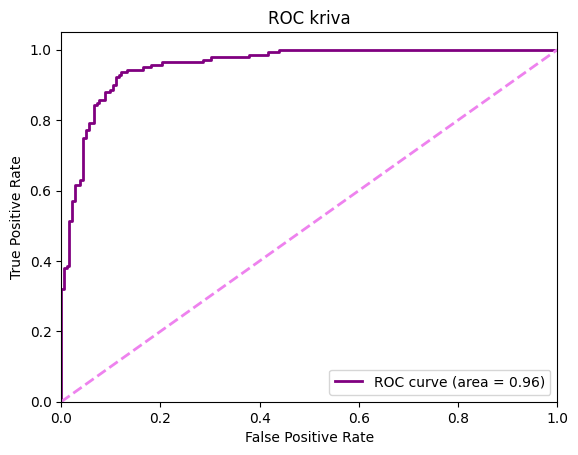

################ METRIKE ZA MODEL LightGBM sa optimizacijom parametara ##################
#################################
Accuracy (Tačnost): 0.9006211180124224
#################################
Precision (Preciznost): 0.8648648648648649
#################################
Recall(odziv): 0.9142857142857143
###############################
F1 Score: 0.888888888888889
ROC AUC: 0.9565541601255887
Confusion Matrix (matrica konfuzije):
[[162  20]
 [ 12 128]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.93      0.89      0.91       182
           1       0.86      0.91      0.89       140

    accuracy                           0.90       322
   macro avg       0.90      0.90      0.90       322
weighted avg       0.90      0.90      0.90       322




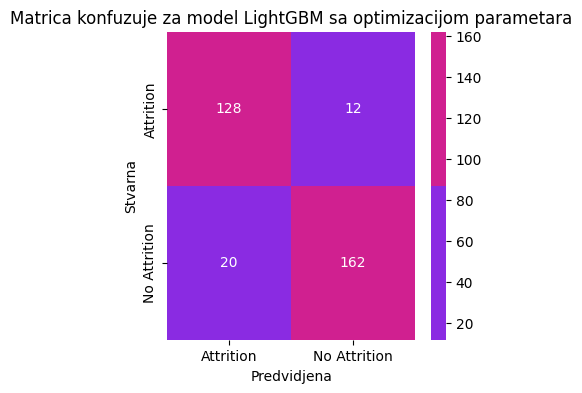

              precision    recall  f1-score   support

           0       0.93      0.89      0.91       182
           1       0.86      0.91      0.89       140

    accuracy                           0.90       322
   macro avg       0.90      0.90      0.90       322
weighted avg       0.90      0.90      0.90       322



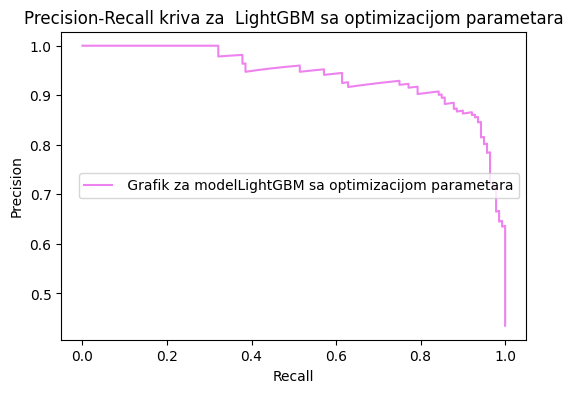

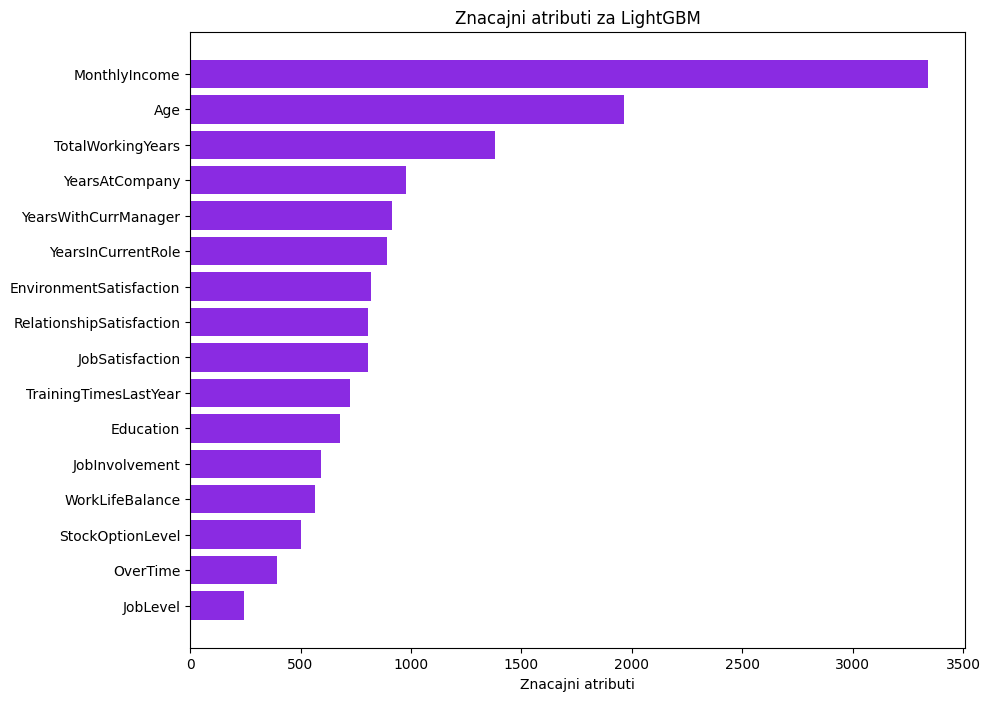

In [142]:
best_params_lgb_new = treniranje_i_tjunovanje(lgb.LGBMClassifier(), param_grids_new['LightGBM'], "LightGBM")

Treniranje modela CatBoost nakon optimizacije parametara 
Krosvalidacioni scopre:  95.36%
ROC_AUC Score :  87.45%


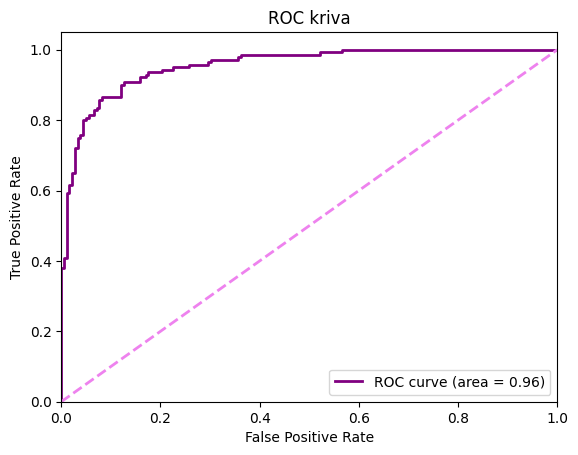

################ METRIKE ZA MODEL CatBoost sa optimizacijom parametara ##################
#################################
Accuracy (Tačnost): 0.8757763975155279
#################################
Precision (Preciznost): 0.852112676056338
#################################
Recall(odziv): 0.8642857142857143
###############################
F1 Score: 0.8581560283687943
ROC AUC: 0.9551020408163264
Confusion Matrix (matrica konfuzije):
[[161  21]
 [ 19 121]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.89      0.88      0.89       182
           1       0.85      0.86      0.86       140

    accuracy                           0.88       322
   macro avg       0.87      0.87      0.87       322
weighted avg       0.88      0.88      0.88       322




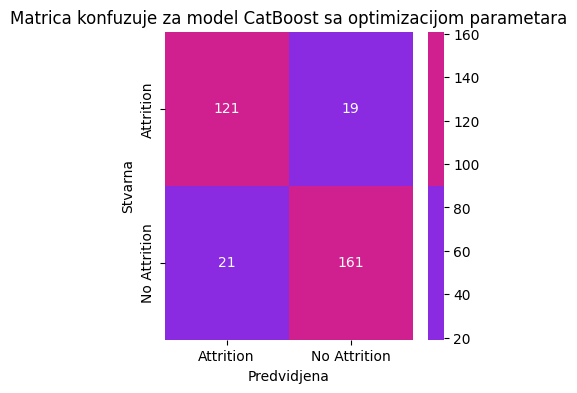

              precision    recall  f1-score   support

           0       0.89      0.88      0.89       182
           1       0.85      0.86      0.86       140

    accuracy                           0.88       322
   macro avg       0.87      0.87      0.87       322
weighted avg       0.88      0.88      0.88       322



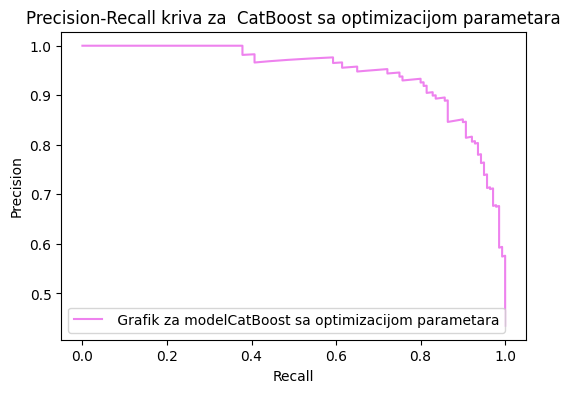

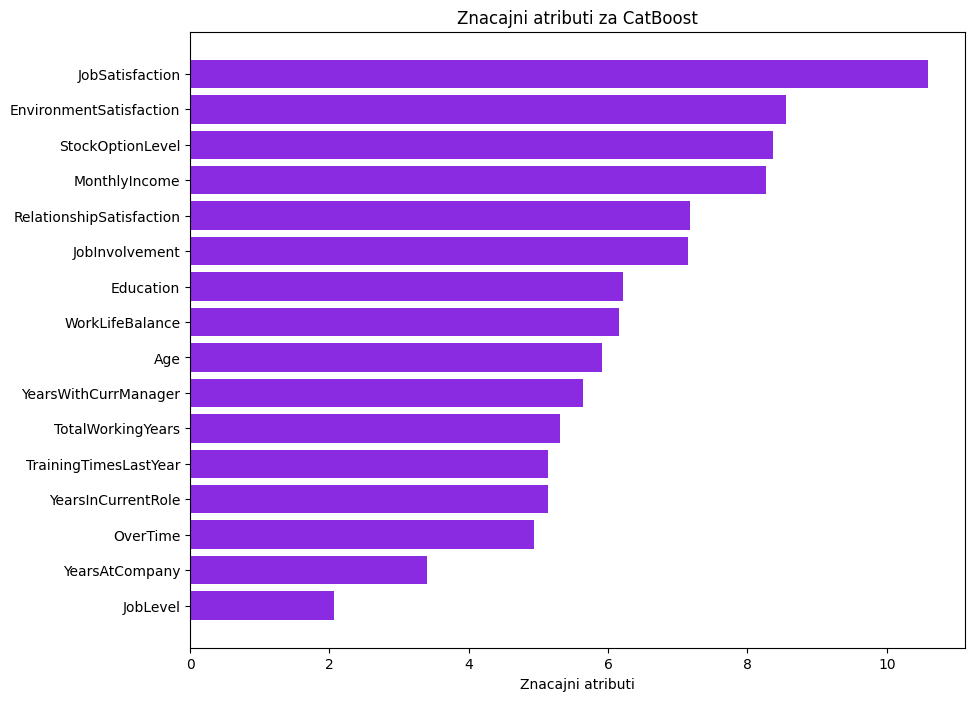

In [143]:
best_params_cb_new = treniranje_i_tjunovanje(cb.CatBoostClassifier(silent=True), param_grids_new['CatBoost'], "CatBoost")

In [145]:
from sklearn.naive_bayes import GaussianNB

Treniranje modela Naive Bayes nakon optimizacije parametara 
Krosvalidacioni scopre:  87.65%
ROC_AUC Score :  77.55%


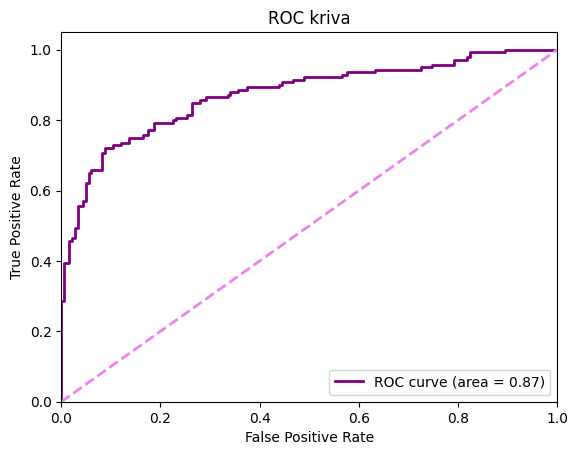

################ METRIKE ZA MODEL Naive Bayes sa optimizacijom parametara ##################
#################################
Accuracy (Tačnost): 0.7639751552795031
#################################
Precision (Preciznost): 0.6797752808988764
#################################
Recall(odziv): 0.8642857142857143
###############################
F1 Score: 0.761006289308176
ROC AUC: 0.8732731554160126
Confusion Matrix (matrica konfuzije):
[[125  57]
 [ 19 121]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.87      0.69      0.77       182
           1       0.68      0.86      0.76       140

    accuracy                           0.76       322
   macro avg       0.77      0.78      0.76       322
weighted avg       0.79      0.76      0.76       322




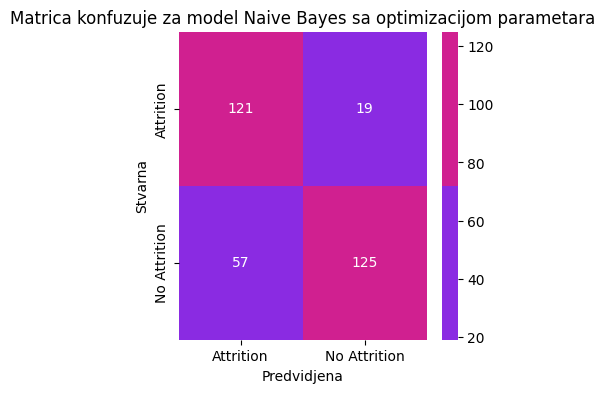

              precision    recall  f1-score   support

           0       0.87      0.69      0.77       182
           1       0.68      0.86      0.76       140

    accuracy                           0.76       322
   macro avg       0.77      0.78      0.76       322
weighted avg       0.79      0.76      0.76       322



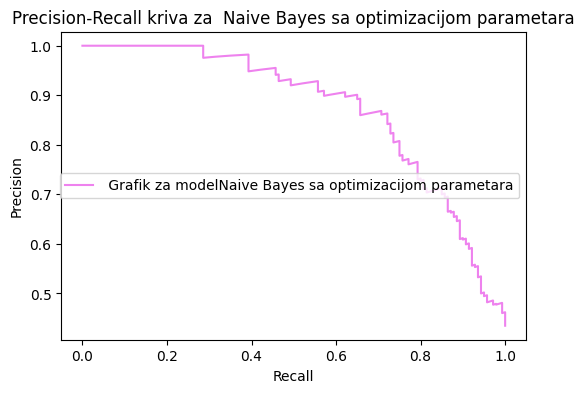

In [147]:
best_params_NB_new = treniranje_i_tjunovanje(GaussianNB(), param_grids_new['Naive Bayes'], "Naive Bayes")

In [148]:
print("NAJBOLJI PARAMETRI ZA Logistic Regression:", best_params_lr_new)
print("NAJBOLJI PARAMETRI ZA  Decision Tree:", best_params_dt_new)
print("NAJBOLJI PARAMETRI ZA  Random Forest:", best_params_rf_new)
print("NAJBOLJI PARAMETRI ZA Gradient Boosting:", best_params_gb_new)
print("NAJBOLJI PARAMETRI ZA  AdaBoost:", best_params_ab_new)
print("NAJBOLJI PARAMETRI ZA  Bagging:", best_params_bg_new)
print("NAJBOLJI PARAMETRI ZA  XGBoost:", best_params_xgb_new)
print("NAJBOLJI PARAMETRI ZA  LightGBM:", best_params_lgb_new)
print("NAJBOLJI PARAMETRI ZA  CatBoost:", best_params_cb_new)
#print("NAJBOLJI PARAMETRI ZA  Support Vector Machine:", best_params_svc)
print("NAJBOLJI PARAMETRI ZA Naive Bayes:", best_params_NB_new)

NAJBOLJI PARAMETRI ZA Logistic Regression: {'C': 1, 'solver': 'lbfgs'}
NAJBOLJI PARAMETRI ZA  Decision Tree: {'max_depth': 30, 'min_samples_leaf': 4, 'min_samples_split': 20}
NAJBOLJI PARAMETRI ZA  Random Forest: {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
NAJBOLJI PARAMETRI ZA Gradient Boosting: {'learning_rate': 0.3, 'max_depth': 7, 'n_estimators': 200}
NAJBOLJI PARAMETRI ZA  AdaBoost: {'learning_rate': 1, 'n_estimators': 50}
NAJBOLJI PARAMETRI ZA  Bagging: {'max_features': 0.5, 'max_samples': 1.0, 'n_estimators': 200}
NAJBOLJI PARAMETRI ZA  XGBoost: {'learning_rate': 0.3, 'max_depth': 9, 'n_estimators': 500}
NAJBOLJI PARAMETRI ZA  LightGBM: {'learning_rate': 0.2, 'n_estimators': 500, 'num_leaves': 127}
NAJBOLJI PARAMETRI ZA  CatBoost: {'depth': 9, 'iterations': 500, 'learning_rate': 0.2}
NAJBOLJI PARAMETRI ZA Naive Bayes: {'var_smoothing': 1.0}
